<a href="https://colab.research.google.com/github/ReeNaeem/Deep-Clustering-MSC/blob/main/NewData_Cnn_Vae_Topomaps_tSNE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

GDrive connect

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install --upgrade mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 94.2 MB/s eta 0:00:00


In [ ]:
import mne
print(mne.__version__)

ModuleNotFoundError: No module named 'mne'

#1

In [ ]:
from datetime import datetime
start_time = datetime.now()

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

from mne.io import read_raw_bdf
import pandas as pd
import mne
import numpy as np
import scipy.io
from matplotlib import pyplot as plt
from matplotlib import ticker
# import plotly.plotly as py
import numpy as np
import os
from scipy.io import loadmat
import scipy.io
import math as m
from scipy.interpolate import griddata
import random
import math

#2

In [ ]:
person=2
def readDataset(verbose=False):

  raw = mne.io.read_raw_bdf('/content/drive/MyDrive/Masters Dataset/ds002778/sub-hc1/ses-hc/eeg/sub-hc1_ses-hc_task-rest_eeg.bdf', preload=True)
  #print(raw)
  #print(raw.info)
  print(raw._data.shape)
  rawDataset = raw.copy()
  ch_names= ['EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7', 'EXG8','Status']
  rawDataset=rawDataset.drop_channels(ch_names, on_missing='raise')
  #rawDatasetForMontageLocation=rawDataset.copy()

  channelNames = ['Fp1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7',
          'P3', 'Pz', 'PO3', 'O1', 'Oz', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2',
          'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'Fp2', 'Fz', 'Cz']

  montage = mne.channels.make_standard_montage('biosemi32')


  info = mne.create_info(ch_names=channelNames, sfreq=128, ch_types='eeg')
  info.set_montage(montage)


  #A bandpass frequency filter from 4.0-45.0Hz was applied.
  rawDataset.filter(0.1, 50., fir_design='firwin')


  #pre-process data
  #downsampling to 128
  rawDataset = rawDataset.resample(sfreq=128)

  # use the average of all channels as reference
  rawDatasetReReferenced = rawDataset.copy().set_eeg_reference(ref_channels='average')
  rawDatasetForMontageLocation=rawDatasetReReferenced.copy()



  transposedDataset = np.transpose(rawDatasetReReferenced._data)
  print ("Length of data: {}".format(len(transposedDataset)))


  if (verbose):
    rawDataset.plot()
    rawDatasetReReferenced.plot()

  if (verbose):
    for i in range(10):
      randomIndex = random.randint(0,len(transposedDataset))
      print ("Random index: {}".format(randomIndex))
      fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5,3), gridspec_kw = {'wspace':0, 'hspace':0.2})
      sampleUnderAnalysis = transposedDataset[randomIndex,:]
      #print (sampleUnderAnalysis)

      ax = axes
      ax.title.set_text('raw dataset')
      im,_ = mne.viz.topomap.plot_topomap(sampleUnderAnalysis,info,names=channelNames,axes=ax,cmap='Spectral_r',show=False)
      #ax.axis('off')

      plt.show()

  return transposedDataset,rawDatasetForMontageLocation

# All functions for converting 3D coordinates to 2D and reading the channel location
rawDataset,rawDatasetForMontageLocation= readDataset(verbose=False)
rawDatasetForMontageLocation.set_montage('biosemi32')
MontageChannelLocation=rawDatasetForMontageLocation.info['dig']

#initialisation for all required variables.
rawDatasetForMontageLocation.set_montage('biosemi32')
MontageChannelLocation=rawDatasetForMontageLocation.info['dig']
sfreq=128
NumberOfEEGChannel=32
lengthOfTopographicMap=40
StartingSamplePoint= 0
EndSamplePoint= rawDataset.shape[0]-1
EndSamplePoint= 24567
NumberOfTopomapsGenerating=EndSamplePoint-StartingSamplePoint

def getChannelNames():
  channelNames = ['Fp1', 'AF3', 'F7', 'F3', 'FC1', 'FC5', 'T7', 'C3', 'CP1', 'CP5', 'P7',
        'P3', 'Pz', 'PO3', 'O1', 'Oz', 'O2', 'PO4', 'P4', 'P8', 'CP6', 'CP2',
        'C4', 'T8', 'FC6', 'FC2', 'F4', 'F8', 'AF4', 'Fp2', 'Fz', 'Cz']
  return channelNames

def getChannellInfoForSample (channelNames, channelValues, onlyValues=False):
  i = 0
  channelValuesforCurrentSample = []
  for ch in channelNames:
    chValue = channelValues[i]
    if (onlyValues):
      channelValuesforCurrentSample.append(chValue)
    else:
      channelValuesforCurrentSample.append((ch, chValue))
    i+=1

  return channelValuesforCurrentSample


def azim_proj(pos):
    """
    Computes the Azimuthal Equidistant Projection of input point in 3D Cartesian Coordinates.
    Imagine a plane being placed against (tangent to) a globe. If
    a light source inside the globe projects the graticule onto
    the plane the result would be a planar, or azimuthal, map
    projection.

    :param pos: position in 3D Cartesian coordinates    [x, y, z]
    :return: projected coordinates using Azimuthal Equidistant Projection
    """
    [r, elev, az] = cart2sph(pos[0], pos[1], pos[2])
    return pol2cart(az, m.pi / 2 - elev)


def cart2sph(x, y, z):
    """
    Transform Cartesian coordinates to spherical
    :param x: X coordinate
    :param y: Y coordinate
    :param z: Z coordinate
    :return: radius, elevation, azimuth
    """
    x2_y2 = x**2 + y**2
    r = m.sqrt(x2_y2 + z**2)                    # r     tant^(-1)(y/x)
    elev = m.atan2(z, m.sqrt(x2_y2))            # Elevation
    az = m.atan2(y, x)                          # Azimuth
    return r, elev, az


def pol2cart(theta, rho):
    """
    Transform polar coordinates to Cartesian
    :param theta: angle value
    :param rho: radius value
    :return: X, Y
    """
    #print ('----------')
    #print (rho * m.cos(theta))
    #print (rho * m.sin(theta))
    return rho * m.cos(theta), rho * m.sin(theta)
"""
def get3DCoordinates(rawDatasetForMontageLocation):
    rawDatasetForMontageLocation.set_montage('biosemi32')
    result=rawDatasetForMontageLocation.info['dig']
    result=result[3:]
    location=[]
    for i in range(0,32):

      v=result[i].values()
      values = list(v)
      a=(values[1])*1000
      location.append(a)
    MontageLocation=np.array(location)
    #MontageLocation=trunc(MontageLocation,decs=3)
    MontageLocation= np.round(MontageLocation,1)
    MontageLocation=MontageLocation.tolist()
    return MontageLocation
"""

def getBrainRateForTimeSlice(brainRatesForChannels):
    #return (np.mean(brainRatesForChannels))
    return (np.sum(brainRatesForChannels))

def get3DCoordinates(MontageChannelLocation,EEGChannels):
    MontageChannelLocation=MontageChannelLocation[-EEGChannels:]
    location=[]
    for i in range(0,32):

      v=MontageChannelLocation[i].values()
      values = list(v)
      a=(values[1])*1000
      location.append(a)
    MontageLocation=np.array(location)
    #MontageLocation=trunc(MontageLocation,decs=3)
    MontageLocation= np.round(MontageLocation,1)
    MontageLocation=MontageLocation.tolist()
    return MontageLocation


pos_3d = get3DCoordinates(MontageChannelLocation,NumberOfEEGChannel)
def convert3DTo2D(pos_3d):
  pos_2d = []
  for e in pos_3d:
    pos_2d.append(azim_proj(e))
  return (pos_2d)


Extracting EDF parameters from /content/drive/MyDrive/Masters Dataset/ds002778/sub-hc1/ses-hc/eeg/sub-hc1_ses-hc_task-rest_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 98303  =      0.000 ...   191.998 secs...
(41, 98304)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16897 samples (33.002 s)

EEG channel type selected for re-referencing
Applying average reference.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Applying a custom ('EEG',) reference.
Length of data: 24576


#3

In [ ]:
# Create topographic map for a specific sample (of 32 channels)
def createTopographicMapFromChannelValues(channelValues, interpolationMethod = "cubic", verbose=False):
  #retrieve the names of channels
  channelNames = getChannelNames()
  #channelValues=channelValues.transpose(1,0)
  listOfChannelValues = getChannellInfoForSample(channelNames, channelValues, onlyValues=True)
  #print(listOfChannelValues)
  #create an empty (with zeros) topographic map of lengthOfTopographicMap x lengthOfTopographicMap pixels
  emptyTopographicMap = np.array(np.zeros([lengthOfTopographicMap, lengthOfTopographicMap]))
  if (verbose):
    #print the empty topographic map
    plt.imshow(emptyTopographicMap)
    plt.show()

  pos2D=np.array(convert3DTo2D(get3DCoordinates(MontageChannelLocation,NumberOfEEGChannel)))
  #print(pos2D)
  #input()
  grid_x, grid_y = np.mgrid[
                     min(pos2D[:, 0]):max( pos2D[:, 0]):lengthOfTopographicMap*1j,
                     min( pos2D[:, 1]):max( pos2D[:, 1]):lengthOfTopographicMap*1j
                     ]
  #print(grid_x)
  #print(grid_y)
  #Generate edgeless images
  min_x, min_y = np.min(pos2D, axis=0)
  max_x, max_y = np.max(pos2D, axis=0)
  locations = np.append(pos2D, np.array([[min_x, min_y], [min_x, max_y],[max_x, min_y],[max_x, max_y]]),axis=0)
  #channelValuesForSample =channelValues
  #print(locations)
  #input()
  # interpolate edgeless topographic map and show it
  interpolatedTopographicMap = griddata(pos2D, channelValues, (grid_x, grid_y), method=interpolationMethod, fill_value=0)


  #coordinates where the pixel values are zero
  CordinateYellowRegion=np.argwhere(interpolatedTopographicMap == 0.)

  if (verbose):
    i=0
    for chVal in channelValues:
      for x in range (32):
        for y in range (32):
          print ("Trying to find value {} in pixel ({},{}-{})".format(chVal, x, y, interpolatedTopographicMap[x][y] ))
          if (chVal == interpolatedTopographicMap[x][y]):
            print ("Value found at pixel ({}{}) for channel: {}".format(x, y,channelNames[i] ))
      i=i+1

  if (verbose):
    plt.imshow(interpolatedTopographicMap)
    plt.show()

  return interpolatedTopographicMap,CordinateYellowRegion


In [ ]:

def retrieveChannelInfoFromInterpolatedMap(interpolatedMap, CordinateYellowRegion,onlyValues=False):

  pixelCoordinates = get2DTopographicMapChannelIndexes(lengthOfTopographicMap,CordinateYellowRegion)
  channelInfoFromInterpolatedMap = []
  i = 0
  for c in pixelCoordinates:
    x = c[0]
    y = c[1]
    channelValue = interpolatedMap[x][y]
    if (onlyValues):
      channelInfoFromInterpolatedMap.append(channelValue)
    else:
      channelInfoFromInterpolatedMap.append((channelNames[i], channelValue))
    i+=1

  return channelInfoFromInterpolatedMap


# Compute 2D coordinates of pixels in the topographic map, as (x,y coordinates)
def getMatrixIndexesFrom2DPositions(xPos, yPos, minX, minY, maxX, maxY, numChannels, CordinateYellowRegion,verbose=False):

  #rescaling inputs coordinates into specific indexes of a numChannels X numChannels matrix, with min-max normalisation algorithm
  #remove -1 from numChannels because the indexes start with 0
  x = ((xPos - minX) * (numChannels-1 -0) ) / (maxX-minX)
  y = ((yPos - minY) * (numChannels-1 -0) ) / (maxY-minY)

  #round integer to the nearest integer
  indexX = round(x)
  indexY = round(y)


  if [indexX, indexY] not in CordinateYellowRegion.tolist() :
    indexX1, indexY1 = indexX, indexY

  elif (([indexX, indexY+1] not in CordinateYellowRegion.tolist()) and ([indexX, indexY+1] != [indexX,lengthOfTopographicMap])) :
    indexX1, indexY1 = indexX, indexY+1

  elif [indexX, indexY-1] not in CordinateYellowRegion.tolist() :
    indexX1, indexY1 = indexX, indexY-1

  elif (([indexX-1, indexY] not in CordinateYellowRegion.tolist()) and ([indexX-1, indexY] != [-1,indexY])) :
    indexX1, indexY1 = indexX-1, indexY

  else:

    indexX1, indexY1 = indexX+1, indexY

  indexX1, indexY1

  return indexX1, indexY1
  if (verbose):
    print("Tranformed positions: {},  {} - Generated matrix indeces: {}, {}".format(x, y, indexX, indexY))




def get2DTopographicMapChannelIndexes(lengthOfTopographicMap,CordinateYellowRegion):
  pos3D = get3DCoordinates(MontageChannelLocation,NumberOfEEGChannel)
  pos2D = []

  minX, maxX, minY, maxY =0,0,0,0
  for e in pos3D:
    newPos = (azim_proj(e))
    pos2D.append(newPos)

    if (newPos[0]<minX):
      minX = newPos[0]
    if (newPos[1]<minY):
      minY = newPos[1]
    if (newPos[0]>maxX):
      maxX = newPos[0]
    if (newPos[1]>maxY):
      maxY = newPos[1]

  channelLocs = np.array(pos2D)
  xMatrixIndices = []
  yMatrixIndices = []
  coordinates2dWithoutScale = []
  for ch in channelLocs:
    x,y = getMatrixIndexesFrom2DPositions(ch[0], ch[1], minX, minY, maxX, maxY, lengthOfTopographicMap, CordinateYellowRegion,verbose=False)
    xMatrixIndices.append(x)
    yMatrixIndices.append(y)
    coordinates2dWithoutScale.append((x,y))

  return coordinates2dWithoutScale



In [ ]:
#read dataset and generate Topographic Maps to train the autoencoder with listOfTopographicMapsForAE
rawDataset,rawDatasetForMontageLocation = readDataset(verbose=False)

#extract the values of those pixels at the 32 coordinates from an interpolated topographic map
#coordinates2D = get2DTopographicMapChannelIndexes(lengthOfTopographicMap,CordinateYellowRegion)
channelNames = getChannelNames()

listOfTopographicMapsForAE = []
for i in range(StartingSamplePoint,EndSamplePoint):
  #get a random sample and load its 32 values
  channelValuesForCurrentSample = list(rawDataset[i,:])

  #create topographic map
  interpolatedTopographicMap,CordinateYellowRegion = createTopographicMapFromChannelValues(channelValuesForCurrentSample, interpolationMethod="cubic",verbose=False)
  #plt.imshow(interpolatedTopographicMap)
  #plt.show()
  listOfTopographicMapsForAE.append(interpolatedTopographicMap)

#train the autoencoder with listOfTopographicMapsForAE
listOfTopographicMapsForAE=np.array(listOfTopographicMapsForAE)
#np.save('/content/drive/MyDrive/Masters Dataset/Maps/Standard'+str(person),listOfTopographicMapsForAE)


Extracting EDF parameters from /content/drive/MyDrive/Masters Dataset/ds002778/sub-hc1/ses-hc/eeg/sub-hc1_ses-hc_task-rest_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 98303  =      0.000 ...   191.998 secs...
(41, 98304)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16897 samples (33.002 s)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Length of data: 24576


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import mne

# Read dataset and generate Topographic Maps to train the autoencoder with listOfTopographicMapsForAE
rawDataset, rawDatasetForMontageLocation = readDataset(verbose=False)

# Extract the values of those pixels at the 32 coordinates from an interpolated topographic map
channelNames = getChannelNames()

listOfTopographicMapsForAE = []
for i in range(StartingSamplePoint, EndSamplePoint):
    # Get a random sample and load its 32 values
    channelValuesForCurrentSample = list(rawDataset[i, :])

    # Create topographic map
    interpolatedTopographicMap, CordinateYellowRegion = createTopographicMapFromChannelValues(channelValuesForCurrentSample, interpolationMethod="cubic", verbose=False)

    # Set up MNE info object for 32 channels
    n_channels = 32
    sfreq = 1000  # Sampling frequency (arbitrary for topographic visualization)
    ch_names = channelNames[:n_channels]
    info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types='eeg')

    # Create an EvokedArray object for plotting
    data_for_mne = np.array(channelValuesForCurrentSample)[:n_channels]
    data_for_mne = np.expand_dims(data_for_mne, axis=1)  # Add the time dimension
    evoked = mne.EvokedArray(data_for_mne, info)

    # Get channel positions from the montage
    montage = mne.channels.make_standard_montage('biosemi32')
    ch_pos = montage.get_positions()['ch_pos']

    # Convert channel positions to a NumPy array
    pos = np.array([ch_pos[ch][:2] for ch in ch_names]) # Extract x, y positions for the desired channels

    # Plot the topographic map with a color scale showing min and max values
    #fig, ax = plt.subplots()
    #im, _ = mne.viz.plot_topomap(data_for_mne.flatten(), pos=pos, axes=ax, show=False, cmap='jet') # Use 'pos' instead of 'ch_pos'

    # Create an axis for the color bar and add it
    #cbar_ax = fig.add_axes([0.85, 0.15, 0.03, 0.7])  # [left, bottom, width, height]
    #fig.colorbar(im, cax=cbar_ax)

    # Show the plot
    #plt.title(f"Topographic Map for Sample {i}")
    #plt.show()

    # Append the interpolated topographic map to the list
    listOfTopographicMapsForAE.append(interpolatedTopographicMap)

# Train the autoencoder with listOfTopographicMapsForAE
listOfTopographicMapsForAE = np.array(listOfTopographicMapsForAE)
#np.save('/content/drive/MyDrive/Masters Dataset/Maps/Standard' + str(person), listOfTopographicMapsForAE)


Extracting EDF parameters from /content/drive/MyDrive/Masters Dataset/ds002778/sub-hc1/ses-hc/eeg/sub-hc1_ses-hc_task-rest_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 98303  =      0.000 ...   191.998 secs...
(41, 98304)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16897 samples (33.002 s)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Length of data: 24576


In [ ]:
# Extract the global min and max values across all maps
global_min = np.min(listOfTopographicMapsForAE)
global_max = np.max(listOfTopographicMapsForAE)

print(f"Global Min Value: {global_min}")
print(f"Global Max Value: {global_max}")

Global Min Value: -0.00020293263910059028
Global Max Value: 0.0005466895437634965


#3.5

### First 100 Maps

Extracting EDF parameters from /content/drive/MyDrive/Masters Dataset/ds002778/sub-hc1/ses-hc/eeg/sub-hc1_ses-hc_task-rest_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 98303  =      0.000 ...   191.998 secs...
(41, 98304)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16897 samples (33.002 s)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Length of data: 24576


<ipython-input-21-0489b980ef47>:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 0.95])  # Adjust rect to leave space for color bars


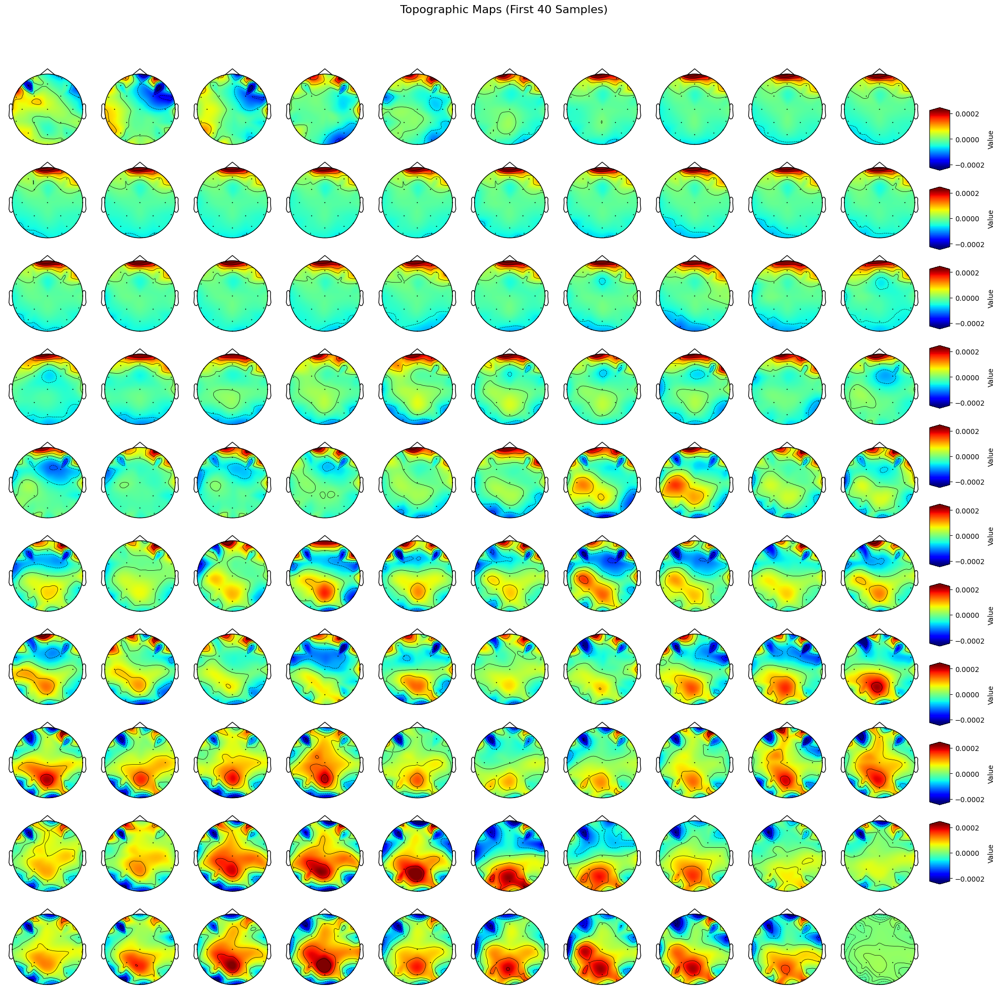

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import mne

# Read dataset and generate Topographic Maps to train the autoencoder with listOfTopographicMapsForAE
rawDataset, rawDatasetForMontageLocation = readDataset(verbose=False)

# Extract the values of those pixels at the 32 coordinates from an interpolated topographic map
channelNames = getChannelNames()

# List to store the topographic maps
listOfTopographicMapsForAE = []

# Prepare a grid for displaying the first 40 topographic maps
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
fig.suptitle('Topographic Maps (First 40 Samples)', fontsize=16)

# Keep track of the maximum and minimum values for consistent color bars
vmin, vmax = None, None

for idx, i in enumerate(range(StartingSamplePoint, StartingSamplePoint + 100)):
    # Get the sample and load its 32 values
    channelValuesForCurrentSample = list(rawDataset[i, :])

    # Create topographic map
    interpolatedTopographicMap, CordinateYellowRegion = createTopographicMapFromChannelValues(
        channelValuesForCurrentSample, interpolationMethod="cubic", verbose=False
    )

    # Set up MNE info object for 32 channels
    n_channels = 32
    sfreq = 1000  # Sampling frequency (arbitrary for topographic visualization)
    ch_names = channelNames[:n_channels]
    info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types='eeg')

    # Create an EvokedArray object for plotting
    data_for_mne = np.array(channelValuesForCurrentSample)[:n_channels]
    data_for_mne = np.expand_dims(data_for_mne, axis=1)  # Add the time dimension
    evoked = mne.EvokedArray(data_for_mne, info)

    # Get channel positions from the montage
    montage = mne.channels.make_standard_montage('biosemi32')
    ch_pos = montage.get_positions()['ch_pos']

    # Convert channel positions to a NumPy array
    pos = np.array([ch_pos[ch][:2] for ch in ch_names])  # Extract x, y positions for the desired channels

    # Plot the topographic map in the grid
    ax = axes.flat[idx]
    im, _ = mne.viz.plot_topomap(data_for_mne.flatten(), pos=pos, axes=ax, show=False, cmap='jet')  # Use 'pos' instead of 'ch_pos'

    # Hide axes for a cleaner grid display
    ax.axis('off')

    # Update vmin and vmax for consistent color bars across the row
    if vmin is None or vmax is None:
        vmin, vmax = im.get_clim()
    else:
        current_vmin, current_vmax = im.get_clim()
        vmin = min(vmin, current_vmin)
        vmax = max(vmax, current_vmax)

# Add a color bar at the end of each row
for row in range(10):
    cbar_ax = fig.add_axes([
        axes[row, -1].get_position().x1 + 0.02,  # x position (to the right of the last column)
        axes[row, 0].get_position().y0,          # y position (aligned with the row)
        0.02,                                    # width of the color bar
        axes[row, 0].get_position().height       # height of the color bar
    ])
    fig.colorbar(im, cax=cbar_ax, orientation='vertical', label='Value', extend='both')
    im.set_clim(vmin, vmax)  # Ensure consistent scale across the row

plt.tight_layout(rect=[0, 0, 0.92, 0.95])  # Adjust rect to leave space for color bars
plt.show()



### Random 20

Extracting EDF parameters from /content/drive/MyDrive/Masters Dataset/ds002778/sub-hc1/ses-hc/eeg/sub-hc1_ses-hc_task-rest_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 98303  =      0.000 ...   191.998 secs...
(41, 98304)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16897 samples (33.002 s)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Length of data: 24576


<ipython-input-20-643f2018edc2>:78: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 0.95])  # Adjust rect to leave space for color bars


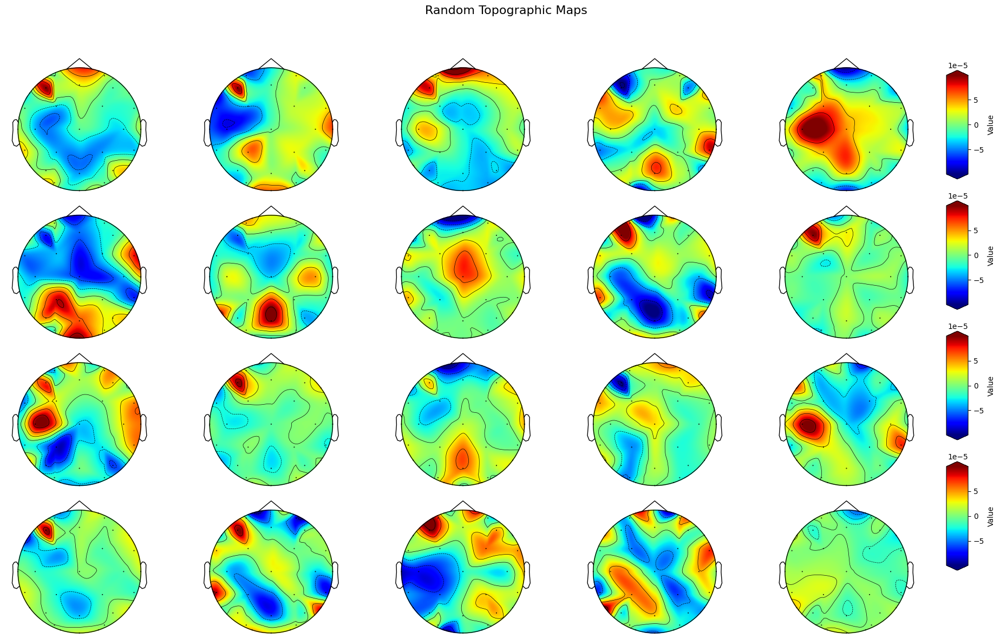

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
import mne

# Read dataset and generate Topographic Maps to train the autoencoder with listOfTopographicMapsForAE
rawDataset, rawDatasetForMontageLocation = readDataset(verbose=False)

# Extract the values of those pixels at the 32 coordinates from an interpolated topographic map
channelNames = getChannelNames()

# List to store the topographic maps
listOfTopographicMapsForAE = []

# Generate 20 random samples within the specified range
randomSampleIndices = random.sample(range(StartingSamplePoint, EndSamplePoint), 20)

# Prepare a grid for displaying 20 topographic maps
fig, axes = plt.subplots(4, 5, figsize=(20, 12))
fig.suptitle('Random Topographic Maps', fontsize=16)

# Keep track of the maximum and minimum values for consistent color bars
vmin, vmax = None, None

for idx, i in enumerate(randomSampleIndices):
    # Get a random sample and load its 32 values
    channelValuesForCurrentSample = list(rawDataset[i, :])

    # Create topographic map
    interpolatedTopographicMap, CordinateYellowRegion = createTopographicMapFromChannelValues(
        channelValuesForCurrentSample, interpolationMethod="cubic", verbose=False
    )

    # Set up MNE info object for 32 channels
    n_channels = 32
    sfreq = 1000  # Sampling frequency (arbitrary for topographic visualization)
    ch_names = channelNames[:n_channels]
    info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types='eeg')

    # Create an EvokedArray object for plotting
    data_for_mne = np.array(channelValuesForCurrentSample)[:n_channels]
    data_for_mne = np.expand_dims(data_for_mne, axis=1)  # Add the time dimension
    evoked = mne.EvokedArray(data_for_mne, info)

    # Get channel positions from the montage
    montage = mne.channels.make_standard_montage('biosemi32')
    ch_pos = montage.get_positions()['ch_pos']

    # Convert channel positions to a NumPy array
    pos = np.array([ch_pos[ch][:2] for ch in ch_names])  # Extract x, y positions for the desired channels

    # Plot the topographic map in the grid
    ax = axes.flat[idx]
    im, _ = mne.viz.plot_topomap(data_for_mne.flatten(), pos=pos, axes=ax, show=False, cmap='jet')  # Use 'pos' instead of 'ch_pos'

    # Hide axes for a cleaner grid display
    ax.axis('off')

    # Update vmin and vmax for consistent color bars across the row
    if vmin is None or vmax is None:
        vmin, vmax = im.get_clim()
    else:
        current_vmin, current_vmax = im.get_clim()
        vmin = min(vmin, current_vmin)
        vmax = max(vmax, current_vmax)

# Add a color bar at the end of each row
for row in range(4):
    cbar_ax = fig.add_axes([
        axes[row, -1].get_position().x1 + 0.02,  # x position (to the right of the last column)
        axes[row, 0].get_position().y0,          # y position (aligned with the row)
        0.02,                                    # width of the color bar
        axes[row, 0].get_position().height       # height of the color bar
    ])
    fig.colorbar(im, cax=cbar_ax, orientation='vertical', label='Value', extend='both')
    im.set_clim(vmin, vmax)  # Ensure consistent scale across the row

plt.tight_layout(rect=[0, 0, 0.92, 0.95])  # Adjust rect to leave space for color bars
plt.show()


### Histogram of Pixel Values

Extracting EDF parameters from /content/drive/MyDrive/Masters Dataset/ds002778/sub-hc1/ses-hc/eeg/sub-hc1_ses-hc_task-rest_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 98303  =      0.000 ...   191.998 secs...
(41, 98304)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16897 samples (33.002 s)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Length of data: 24576


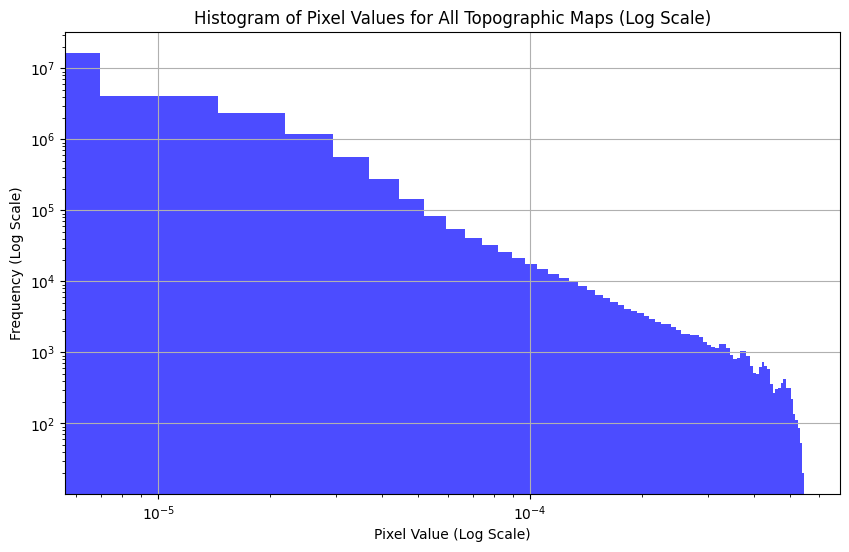

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Read dataset and generate Topographic Maps to train the autoencoder with listOfTopographicMapsForAE
rawDataset, rawDatasetForMontageLocation = readDataset(verbose=False)

# Extract the values of those pixels at the 32 coordinates from an interpolated topographic map
channelNames = getChannelNames()

listOfTopographicMapsForAE = []
for i in range(StartingSamplePoint, EndSamplePoint):
    # Get a random sample and load its 32 values
    channelValuesForCurrentSample = list(rawDataset[i, :])

    # Create topographic map
    interpolatedTopographicMap, CordinateYellowRegion = createTopographicMapFromChannelValues(channelValuesForCurrentSample, interpolationMethod="cubic", verbose=False)
    listOfTopographicMapsForAE.append(interpolatedTopographicMap)

# Convert list of topographic maps to a numpy array
listOfTopographicMapsForAE = np.array(listOfTopographicMapsForAE)

# Flatten all the pixel values from all topographic maps to create a histogram
flattened_pixel_values = listOfTopographicMapsForAE.flatten()

# Plot a histogram of the pixel values
plt.figure(figsize=(10, 6))
plt.hist(flattened_pixel_values, bins=100, color='blue', alpha=0.7)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Pixel Value (Log Scale)')
plt.ylabel('Frequency (Log Scale)')
plt.title('Histogram of Pixel Values for All Topographic Maps (Log Scale)')
plt.grid(True)
plt.show()

# Optionally save the numpy array for future use
# np.save('/content/drive/MyDrive/Masters Dataset/Maps/Standard' + str(person), listOfTopographicMapsForAE)


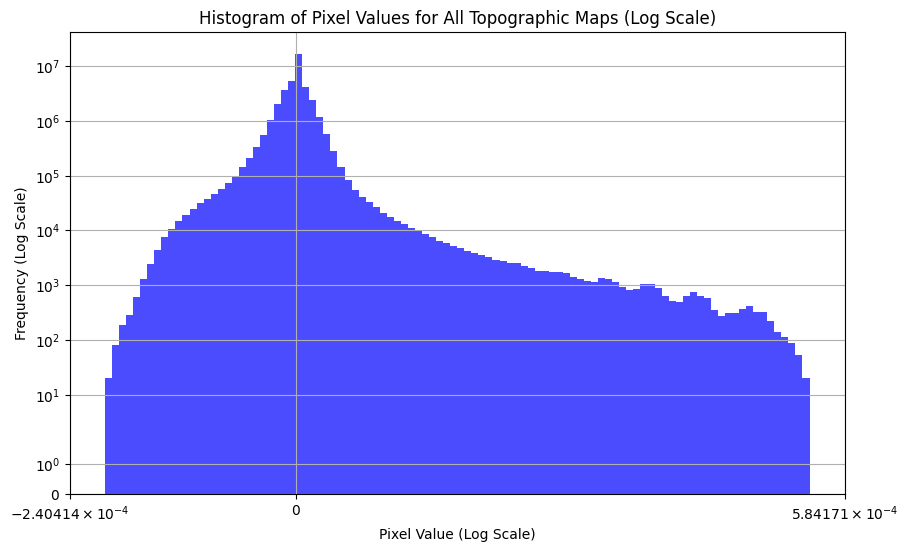

In [ ]:
# Plot a histogram of the pixel values
plt.figure(figsize=(10, 6))
plt.hist(flattened_pixel_values, bins=100, color='blue', alpha=0.7)
plt.xscale('symlog')
plt.yscale('symlog')
plt.xlabel('Pixel Value (Log Scale)')
plt.ylabel('Frequency (Log Scale)')
plt.title('Histogram of Pixel Values for All Topographic Maps (Log Scale)')
plt.grid(True)
plt.show()

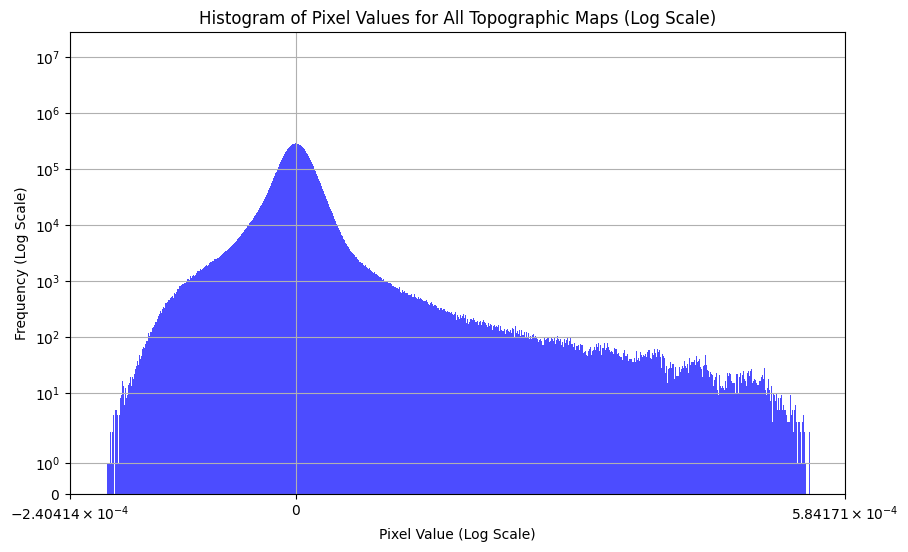

In [ ]:
# Plot a histogram of the pixel values
plt.figure(figsize=(10, 6))
plt.hist(flattened_pixel_values, bins=2000, color='blue', alpha=0.7)
plt.xscale('symlog')
plt.yscale('symlog')
plt.xlabel('Pixel Value (Log Scale)')
plt.ylabel('Frequency (Log Scale)')
plt.title('Histogram of Pixel Values for All Topographic Maps (Log Scale)')
plt.grid(True)
plt.show()

In [ ]:
from scipy.stats import shapiro, normaltest, mannwhitneyu, wilcoxon, kruskal, spearmanr

# Test for normality using the Shapiro-Wilk test
shapiro_test_stat, shapiro_p_value = shapiro(flattened_pixel_values)
print("Shapiro-Wilk Test:")
print(f"Test Statistic: {shapiro_test_stat}, p-value: {shapiro_p_value}")

# Test for normality using the D'Agostino and Pearson's test
dagostino_test_stat, dagostino_p_value = normaltest(flattened_pixel_values)
print("D'Agostino and Pearson's Test:")
print(f"Test Statistic: {dagostino_test_stat}, p-value: {dagostino_p_value}")

# Non-Parametric tests
# need two groups to compare, so I split the dataset into two halves
midpoint = len(flattened_pixel_values) // 2
sample1 = flattened_pixel_values[:midpoint]
sample2 = flattened_pixel_values[midpoint:]

# Mann-Whitney U Test (comparing two independent samples)
mannwhitney_stat, mannwhitney_p_value = mannwhitneyu(sample1, sample2, alternative='two-sided')
print("Mann-Whitney U Test:")
print(f"Test Statistic: {mannwhitney_stat}, p-value: {mannwhitney_p_value}")

# Wilcoxon Signed-Rank Test (comparing two related samples)
# Using only the first 1000 values to make samples of equal length
wilcoxon_stat, wilcoxon_p_value = wilcoxon(sample1[:1000], sample2[:1000])
print("Wilcoxon Signed-Rank Test:")
print(f"Test Statistic: {wilcoxon_stat}, p-value: {wilcoxon_p_value}")

# Kruskal-Wallis H Test (comparing more than two independent samples)
kruskal_stat, kruskal_p_value = kruskal(sample1, sample2)
print("Kruskal-Wallis H Test:")
print(f"Test Statistic: {kruskal_stat}, p-value: {kruskal_p_value}")

# Spearman Rank Correlation (measuring correlation between two variables)
spearman_corr, spearman_p_value = spearmanr(sample1, sample2)
print("Spearman Rank Correlation:")
print(f"Correlation Coefficient: {spearman_corr}, p-value: {spearman_p_value}")

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 39307200.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Test Statistic: 0.6839086379460585, p-value: 4.410007161373848e-185
D'Agostino and Pearson's Test:
Test Statistic: 36334578.72507025, p-value: 0.0
Mann-Whitney U Test:
Test Statistic: 192407870109575.5, p-value: 4.001903229708299e-94
Wilcoxon Signed-Rank Test:
Test Statistic: 187834.0, p-value: 3.3338705431097005e-05
Kruskal-Wallis H Test:
Test Statistic: 423.6073738208653, p-value: 4.001903262861534e-94
Spearman Rank Correlation:
Correlation Coefficient: 0.039999974857034104, p-value: 0.0


#4 Image Reconstruction model

In [ ]:

dimension=[40]
#dimension=[2]
for i in dimension:
    import numpy as np
    import pandas as pd
    from matplotlib import pyplot as plt
    import math, os
    import tensorflow as tf
    from tensorflow.keras.layers import ELU, PReLU, LeakyReLU
    from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Input, Reshape, Flatten,Lambda
    from tensorflow.keras.models import Model
    from keras.utils import plot_model
    import pdb
    from tensorflow.keras import backend as K
    from tensorflow.keras.datasets import mnist
    from tensorflow.keras.callbacks import  EarlyStopping
    from skimage import metrics
    from sklearn.metrics import mean_absolute_error
    from sklearn.model_selection import train_test_split
    from scipy import stats
    import csv

    #Set parameters
    z_dim = i
    epoch = 200
    batch_size = 32

    #raw=np.load('testdata.npy')
    raw=listOfTopographicMapsForAE
    raw.shape

    train_ratio = 0.7
    val_ratio = 0.15
    test_ratio = 0.15

    #Normalise the data
    dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
    dataNormReshape=dataNorm.reshape(-1,raw.shape[1],raw.shape[2],1)

    # First split: 70% training and 30% remaining (to be split into validation and test)
    data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - train_ratio), random_state=42, shuffle=True)

    # Second split: 15% validation and 15% testing from the remaining 30%
    data_val, data_test = train_test_split(data_remaining, test_size=test_ratio/(test_ratio + val_ratio), random_state=42, shuffle=True)
    #data_train.shape,data_test.shape,data_val.shape

    # Flatten the data to make it easier to compute Z-scores
    #data_train_flat = data_train.reshape(data_train.shape[0], -1)

    # Calculate Z-scores
    #z_scores = np.abs(stats.zscore(data_train_flat, axis=0))

    # Set a Z-score threshold (e.g., 3)
    #threshold = 3

    # Identify outliers
    #outliers = np.where(z_scores > threshold)

    # Filter out the outliers
    #filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
    #data_train_filtered = data_train[filtered_indices]


    #Design the encoder
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2],1))
    en_conv1 = Conv2D(filters = 32, kernel_size=4, strides=2, padding='same')(encoder_input)
    en_conv1 = LeakyReLU(0.1)(en_conv1)

    en_conv2 = Conv2D(filters = 64, kernel_size=4, strides=2, padding='same')(en_conv1)
    en_conv2 = LeakyReLU(0.1)(en_conv2)

    en_conv3 = Conv2D(filters = 128, kernel_size=4, strides=2, padding='same')(en_conv2)
    en_conv3 = LeakyReLU(0.1)(en_conv3)

    en_conv4 = Conv2D(filters = 256, kernel_size=4, strides=2, padding='same')(en_conv3)
    en_conv4 = LeakyReLU(0.1)(en_conv4)

    en_fc1= Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    #Compute latent using mean and variance
    @tf.keras.utils.register_keras_serializable()
    def compute_latent(x):
        mu, sigma = x
        batch = K.shape(mu)[0]
        dim = K.int_shape(mu)[1]
        eps = K.random_normal(shape=(batch,z_dim),mean=0., stddev=1.)
        return mu + K.exp(sigma)*eps
    latent_space = Lambda(compute_latent)([mu, sigma])

    #Build the encoder
    encoder = Model(encoder_input,[mu,sigma,latent_space], name='encoder')
    #plot_model(encoder, show_shapes=True)
    encoder.summary()

    #Design the decoder'
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(en_conv3.shape[1]*en_conv3.shape[2]*en_conv3.shape[3], activation='relu')(decoder_input )
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2],en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(filters=128, kernel_size=4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(filters=64, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv1)
    de_conv3 = Conv2DTranspose(filters=32, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv2)
    decoder_output = Conv2DTranspose(filters=1, kernel_size=4, strides=2, activation='sigmoid', padding='same')(de_conv2)

    decoder = Model(decoder_input, decoder_output, name='decoder')
    # plot_model(decoder, show_shapes=True)
    decoder.summary()

    #Build the autoencoder for training
    train_z = encoder(encoder_input)[2]
    train_xr = decoder(train_z)
    autoencoder = Model(encoder_input, train_xr)
    autoencoder.summary()

    ## MMD Functions
    def compute_kernel(x, y):
        x_size = K.shape(x)[0]
        y_size = K.shape(y)[0]
        dim = K.shape(x)[1]
        tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

    def compute_mmd(x, y):
        x_kernel = compute_kernel(x, x)
        y_kernel = compute_kernel(y, y)
        xy_kernel = compute_kernel(x, y)
        return K.mean(x_kernel) + K.mean(y_kernel) - 2 * K.mean(xy_kernel)

    @tf.keras.utils.register_keras_serializable()
    class CustomLossLayer(tf.keras.layers.Layer):
        def call(self, inputs):
            latent_space, train_z, train_xr, train_x = inputs
            loss_mmd = compute_mmd(latent_space, train_z)
            loss_nll = K.mean(K.square(train_xr - train_x))
            loss = loss_mmd + loss_nll
            self.add_loss(loss_mmd + loss_nll)
            return train_xr

        def compute_output_shape(self, input_shape):
            return input_shape[1]

    outputs = CustomLossLayer()([latent_space, train_z, train_xr, encoder_input])
    autoencoder = Model(encoder_input, outputs)
    autoencoder.compile(optimizer='adam')
    myCallBacks = EarlyStopping(monitor='loss', patience=10, mode='min')


    #Train the model
    history = autoencoder.fit(
    data_train,
    epochs=epoch,
    batch_size=batch_size,
    validation_data=(data_val, None),
    callbacks=[myCallBacks]
    )

    # Save the history and model
    np.save(f'/content/drive/MyDrive/Masters Dataset/New Results/autoencoder_dim{z_dim}_history.npy', history.history)
    autoencoder.save(f'/content/drive/MyDrive/Masters Dataset/New Results/autoencoder_dim{z_dim}.h5')



Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_117           │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_153 (Conv2D)       │ (None, 20, 20, 32)     │            544 │ input_layer_117[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_153           │ (None, 20, 20, 32)     │              0 │ conv2d_153[0][0]       │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_154 (Conv2D)       │ (None, 10, 10, 64)     │         32,832 │ leaky_re_lu_153[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_154           │ (None, 10, 10, 64)     │              0 │ conv2d_154[0][0]       │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_155 (Conv2D)       │ (None, 5, 5, 128)      │        131,200 │ leaky_re_lu_154[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_155           │ (None, 5, 5, 128)      │              0 │ conv2d_155[0][0]       │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_50 (Flatten)      │ (None, 3200)           │              0 │ leaky_re_lu_155[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_167 (Dense)         │ (None, 40)             │        128,040 │ flatten_50[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_168 (Dense)         │ (None, 40)             │        128,040 │ flatten_50[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_25 (Lambda)        │ (None, 40)             │              0 │ dense_167[0][0],       │
│                           │                        │                │ dense_168[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 420,656 (1.60 MB)

 Trainable params: 420,656 (1.60 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_118 (InputLayer)         │ (None, 40)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_169 (Dense)                    │ (None, 3200)                │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_67 (Reshape)                 │ (None, 5, 5, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_241                 │ (None, 10, 10, 128)         │         262,272 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_242                 │ (None, 20, 20, 64)          │         131,136 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_244                 │ (None, 40, 40, 1)           │           1,025 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 525,633 (2.01 MB)

 Trainable params: 525,633 (2.01 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_117 (InputLayer)         │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 40), (None, 40),    │         420,656 │
│                                      │ (None, 40)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         525,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 946,289 (3.61 MB)

 Trainable params: 946,289 (3.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 15s 16ms/step - loss: 0.0055 - val_loss: 2.2817e-04
Epoch 2/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.7271e-04 - val_loss: 6.1720e-05
Epoch 3/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 5.7296e-05 - val_loss: 3.5933e-05
Epoch 4/200
535/538 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8364e-05

KeyboardInterrupt: 

In [ ]:
# Save the history to a file
np.save(f'/content/drive/MyDrive/Masters Dataset/New Results/topocvae_dim{z_dim}_history.npy', history.history)
# Save model
model_cvae1 = '/content/drive/MyDrive/Masters Dataset/New Results/topocvae1.h5'
autoencoder.save(model_cvae1, save_format='h5')

#saving models
    #tf.keras.models.save_model(autoencoder,'Models/Model_p2/vae_model'+str(i))
    #tf.keras.models.save_model(encoder,'Models/Model_p2/encoder_model'+str(i))
    #tf.keras.models.save_model(decoder,'Models/Model_p2/decoder_model'+str(i))

    #load models
    #model= tf.keras.models.load_model('/content/drive/MyDrive/EEG_exp2/Models/mmd-vae_1V_25D',compile=True)
    #enc_model= tf.keras.models.load_model('/content/drive/MyDrive/EEG_Data/mmd-encoder_40v_25D',compile=True)


##Predicted Images

768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


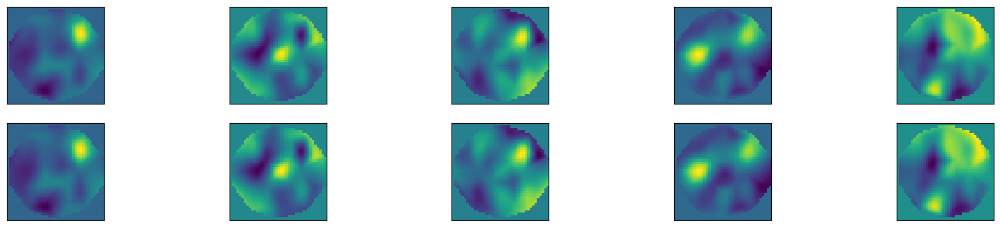

In [ ]:
# Evaluate the performance of autoencoder for training, validation, and test data
predicted_wholedataset = autoencoder.predict(dataNormReshape).reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])
predicted_train = autoencoder.predict(data_train).reshape(-1, data_train.shape[1], data_train.shape[2])
predicted_test = autoencoder.predict(data_test).reshape(-1, data_test.shape[1], data_test.shape[2])

actual_train = data_train.reshape(-1, data_train.shape[1], data_train.shape[2])
actual_test = data_test.reshape(-1, data_test.shape[1], data_test.shape[2])

# Visualize actual and predicted image
fig, axes = plt.subplots(nrows=2, ncols=5, sharex=True, sharey=True, figsize=(20, 4))
for images, row in zip([actual_test[100:105], predicted_test[100:105]], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((raw.shape[1], raw.shape[2])))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
plt.savefig('ActualPredicted5Images')

# Denormalize and compare topographic map from raw data with denormalized reconstructed topographic map
outputDenormalisedData = predicted_wholedataset * (raw.max() - raw.min()) + raw.min()
outputDenormalisedData = outputDenormalisedData.reshape(-1, outputDenormalisedData.shape[1], outputDenormalisedData.shape[2])

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 391ms/step


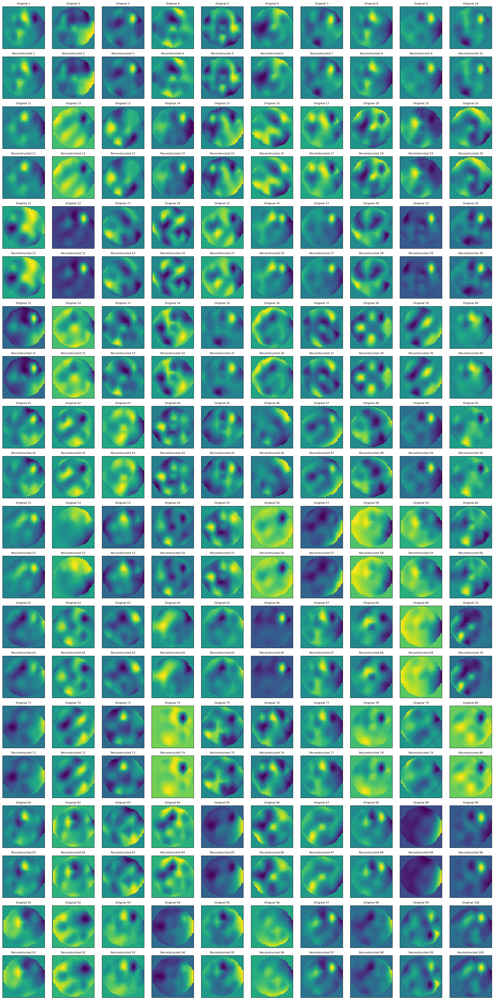

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of images to compare
num_images = 100

# Randomly pick indices from the training and test sets
train_indices = np.random.choice(len(data_train_filtered), num_images // 2, replace=False)
test_indices = np.random.choice(len(data_test), num_images // 2, replace=False)

# Combine the selected indices from training and test sets
selected_train_images = data_train_filtered[train_indices]
selected_test_images = data_test[test_indices]

# Combine the selected images into one dataset
selected_images = np.concatenate([selected_train_images, selected_test_images], axis=0)

# Predict the reconstructed images using the autoencoder
predicted_images = autoencoder.predict(selected_images).reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])

# Reshape the actual images for comparison
actual_images = selected_images.reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])

# Plot 100 original images vs. reconstructed images in a 10x10 grid
fig, axes = plt.subplots(nrows=20, ncols=10, sharex=True, sharey=True, figsize=(20, 40))

for i in range(num_images):
    # Original images
    ax = axes[2 * (i // 10), i % 10]
    ax.imshow(actual_images[i].squeeze(), cmap='viridis')  # Set the colormap to 'viridis'
    ax.set_title(f'Original {i+1}', fontsize=8)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Reconstructed images
    ax = axes[2 * (i // 10) + 1, i % 10]
    ax.imshow(predicted_images[i].squeeze(), cmap='viridis')  # Set the colormap to 'viridis'
    ax.set_title(f'Reconstructed {i+1}', fontsize=8)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.tight_layout()
plt.savefig('ActualVsReconstructed100Images.png')
plt.show()

# Denormalize and compare topographic map from raw data with denormalized reconstructed topographic map
outputDenormalisedData = predicted_images * (raw.max() - raw.min()) + raw.min()


## MEtrics Table

In [ ]:
from skimage.metrics import structural_similarity, mean_squared_error
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K
import csv
from datetime import datetime

# Define functions for SSIM, MSE, MAE, MAPE with appropriate data_range for SSIM
def SSIM(actual, pred, data_range):
    ssimErrAllPair = 0
    for i in range(actual.shape[0]):
        ssimErrAllPair += structural_similarity(actual[i], pred[i], data_range=data_range) / actual.shape[0]
    return ssimErrAllPair

def MSE(actual, pred):
    mseErrAllPair = 0
    for i in range(actual.shape[0]):
        mseErrAllPair += mean_squared_error(actual[i], pred[i]) / actual.shape[0]
    return mseErrAllPair

def MAE(actual, pred):
    MA_error_all = 0
    for i in range(actual.shape[0]):
        MA_error_all += mean_absolute_error(actual[i], pred[i]) / actual.shape[0]
    return MA_error_all

def MAPE(actual, pred):
    epsilon = 1e-10  # Small constant to avoid division by zero or very small values
    non_zero_indices = actual != 0  # Mask for non-zero actual values
    actual_non_zero = actual[non_zero_indices]
    pred_non_zero = pred[non_zero_indices]

    percentage_errors = np.abs((actual_non_zero - pred_non_zero) / actual_non_zero) * 100
    return np.mean(percentage_errors)

def MdAPE(actual, pred):
    epsilon = 1e-10  # Small constant to avoid division by zero or very small values
    non_zero_indices = actual != 0  # Mask for non-zero actual values
    actual_non_zero = actual[non_zero_indices]
    pred_non_zero = pred[non_zero_indices]

    percentage_errors = np.abs((actual_non_zero - pred_non_zero) / actual_non_zero) * 100
    return np.median(percentage_errors)


# Set dimensions for evaluation
dimensions = [15, 20, 25, 30]

train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

results = []
plt.figure(figsize=(14, 8))

# Define the custom loss layer
class CustomLossLayer(Layer):
    def call(self, inputs):
        train_z, train_xr, train_x = inputs
        loss_mmd = self.compute_mmd(train_z, train_z)
        loss_nll = K.mean(K.square(train_xr - train_x))
        self.add_loss(loss_mmd + loss_nll)
        return train_xr

    def compute_mmd(self, x, y):
        x_size = K.shape(x)[0]
        y_size = K.shape(y)[0]
        dim = K.shape(x)[1]
        tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

# Define the custom function
def compute_latent(x):
    mu, sigma = x
    batch = K.shape(mu)[0]
    dim = K.int_shape(mu)[1]
    eps = K.random_normal(shape=(batch, dim), mean=0., stddev=1.)
    return mu + K.exp(sigma) * eps

# Loop through dimensions and load models
for dim in dimensions:
    start_time = datetime.now()

    # Load pre-trained model with custom objects
    model_file_path1 = f'/content/drive/MyDrive/Masters Dataset/New Results/autoencoder_dim{dim}.h5'
    autoencoder = load_model(model_file_path1,
                             custom_objects={'compute_latent': compute_latent,
                                             'CustomLossLayer': CustomLossLayer},
                             compile=False)


    # Load the training history
    history_path = f'/content/drive/MyDrive/Masters Dataset/New Results/autoencoder_dim{dim}_history.npy'
    history = np.load(history_path, allow_pickle=True).item()

    # Get the number of epochs used
    num_epochs = len(history['loss'])

    # Predict on training and test data
    predicted_wholedataset = autoencoder.predict(dataNormReshape).reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])
    predicted_train = autoencoder.predict(data_train).reshape(-1, data_train.shape[1], data_train.shape[2])
    predicted_test = autoencoder.predict(data_test).reshape(-1, data_test.shape[1], data_test.shape[2])

    actual_train = data_train.reshape(-1, data_train.shape[1], data_train.shape[2])
    actual_test = data_test.reshape(-1, data_test.shape[1], data_test.shape[2])

    # Compute SSIM, MSE, MAE, MAPE
    data_range = 1.0  # Since images are normalized to [0, 1]

    # Ensure that actual_train and predicted_train are denormalized before calculating MAPE
    actual_train_denorm = actual_train * (raw.max() - raw.min()) + raw.min()
    predicted_train_denorm = predicted_train * (raw.max() - raw.min()) + raw.min()

    actual_test_denorm = actual_test * (raw.max() - raw.min()) + raw.min()
    predicted_test_denorm = predicted_test * (raw.max() - raw.min()) + raw.min()

    SSIM_train = SSIM(actual_train, predicted_train, data_range)
    MSE_train = MSE(actual_train, predicted_train)
    MAE_train = MAE(actual_train, predicted_train)
    MAPE_train = MAPE(actual_train_denorm, predicted_train_denorm)  # Only 2 arguments
    MdAPE_train= MdAPE(actual_train_denorm, predicted_train_denorm)

    SSIM_test = SSIM(actual_test, predicted_test, data_range)
    MSE_test = MSE(actual_test, predicted_test)
    MAE_test = MAE(actual_test, predicted_test)
    MAPE_test = MAPE(actual_test_denorm, predicted_test_denorm)  # Only 2 arguments
    MdApe_test = MdAPE(actual_test_denorm, predicted_test_denorm)

    # Store results
    results.append({
        'Dimension': dim,
        'Epochs': num_epochs,
        'Training SSIM': SSIM_train,
        'Training MSE': MSE_train,
        'Training MAE': MAE_train,
        'Training MAPE (%)': MAPE_train,
        'Training MdAPE (%)': MdAPE_train,
        'Testing SSIM': SSIM_test,
        'Testing MSE': MSE_test,
        'Testing MAE': MAE_test,
        'Testing MAPE (%)': MAPE_test,
        'Testing MdAPE (%)': MdApe_test
    })

# Save results to a CSV file
header = ['Dimension', 'Epochs', 'Training SSIM', 'Training MSE', 'Training MAE', 'Training MAPE (%)', 'Training MdAPE (%)',
          'Testing SSIM', 'Testing MSE', 'Testing MAE', 'Testing MAPE (%)', 'Testing MdAPE (%)']
with open('metrics_table.csv', 'w', newline='') as f:
    writer = csv.DictWriter(f, fieldnames=header)
    writer.writeheader()
    for result in results:
        writer.writerow(result)

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))
print("Execution finished")


768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Duration: 0:00:21.204838
Execution finished


<Figure size 1400x800 with 0 Axes>

## Read the Endcoder

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, Flatten, Lambda, LeakyReLU
import tensorflow.keras.backend as K

dimensions = [15, 20, 25, 30]  # Different latent space dimensions

for z_dim in dimensions:
    # Load the corresponding saved model
    accuracy_model = load_model(f'/content/drive/MyDrive/Masters Dataset/New Results/autoencoder_dim{z_dim}.h5')

    # Rebuild the encoder with the correct z_dim
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))

    # Encoder architecture remains the same as described earlier, with the correct z_dim
    en_conv1 = Conv2D(filters=32, kernel_size=4, strides=2, padding='same')(encoder_input)
    en_conv1 = LeakyReLU(0.1)(en_conv1)

    en_conv2 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(en_conv1)
    en_conv2 = LeakyReLU(0.1)(en_conv2)

    en_conv3 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(en_conv2)
    en_conv3 = LeakyReLU(0.1)(en_conv3)

    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    def compute_latent(x):
        mu, sigma = x
        batch = K.shape(mu)[0]
        dim = K.int_shape(mu)[1]
        eps = K.random_normal(shape=(batch, z_dim), mean=0., stddev=1.)
        return mu + K.exp(sigma) * eps

    latent_space = Lambda(compute_latent)([mu, sigma])

    # Build the encoder model
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

    # Load the weights into the encoder from the full model
    for layer in encoder.layers:
        try:
            layer.set_weights(accuracy_model.get_layer(layer.name).get_weights())
        except ValueError:
            pass

    # Now use the encoder to predict the latent space on your test data
    mu_train, sigma_train, latent_space_train = encoder.predict(data_train_filtered)

    # You can store or analyze the latent space output as needed
    # e.g., save latent space
    np.save(f'/content/drive/MyDrive/Masters Dataset/New Results/latent_space_train_dim{z_dim}.npy', latent_space_train)


486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, Flatten, Lambda, LeakyReLU
import tensorflow.keras.backend as K

dimensions = [2]  # Different latent space dimensions

for z_dim in dimensions:
    # Load the corresponding saved model
    accuracy_model = load_model(f'/content/drive/MyDrive/Dissertation/autoencoder_dim{z_dim}.h5')

    # Rebuild the encoder with the correct z_dim
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))

    # Encoder architecture remains the same as described earlier, with the correct z_dim
    en_conv1 = Conv2D(filters=32, kernel_size=4, strides=2, padding='same')(encoder_input)
    en_conv1 = LeakyReLU(0.1)(en_conv1)

    en_conv2 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(en_conv1)
    en_conv2 = LeakyReLU(0.1)(en_conv2)

    en_conv3 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(en_conv2)
    en_conv3 = LeakyReLU(0.1)(en_conv3)

    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    def compute_latent(x):
        mu, sigma = x
        batch = K.shape(mu)[0]
        dim = K.int_shape(mu)[1]
        eps = K.random_normal(shape=(batch, z_dim), mean=0., stddev=1.)
        return mu + K.exp(sigma) * eps

    latent_space = Lambda(compute_latent)([mu, sigma])

    # Build the encoder model
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

    # Load the weights into the encoder from the full model
    for layer in encoder.layers:
        try:
            layer.set_weights(accuracy_model.get_layer(layer.name).get_weights())
        except ValueError:
            pass

    # Now use the encoder to predict the latent space on your test data
    mu_train, sigma_train, latent_space_train = encoder.predict(data_train_filtered)

    # You can store or analyze the latent space output as needed
    # e.g., save latent space
    np.save(f'/content/drive/MyDrive/Dissertation/latent_space_train_dim{z_dim}.npy', latent_space_train)


In [ ]:
# Assuming `data_test` is your test dataset
mu_train, sigma_train, latent_space_train = encoder.predict(data_train_filtered)

# `latent_space_test` now contains the latent space representations for your test data
print("Latent Space Representation (Train Data):")
print(latent_space_train)


486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
Latent Space Representation (Train Data):
[[-1.4403588  -0.07462285 -2.520838   ... -0.37442243 -0.72319335
  -0.23265573]
 [ 2.4889445  -0.44761235  1.8336256  ...  0.8625295  -0.32408008
   1.025939  ]
 [-0.39582637 -0.7345219   0.6107634  ... -1.8916838   1.9959061
  -1.0488493 ]
 ...
 [ 0.77232265 -0.67882985 -0.36109555 ...  0.0901546   0.07356927
  -0.01632305]
 [-1.1242802  -0.49433115  0.4790232  ...  1.2453743   0.8891478
  -1.8179753 ]
 [-1.5958589  -0.25252527  0.14835219 ... -0.10719382  1.0482038
  -0.29790017]]


In [ ]:
import pandas as pd

# Convert the latent space array to a DataFrame
latent_space_df = pd.DataFrame(latent_space_train)

# Save the DataFrame to a CSV file
latent_space_df.to_csv('latent_space_output.csv', index=False)

print("Latent space output saved to 'latent_space_output.csv'")


Latent space output saved to 'latent_space_output.csv'


In [ ]:
import matplotlib.pyplot as plt

# Assuming latent_space_test is 2D
plt.scatter(latent_space_train[:, 0], latent_space_train[:, 1], c='blue', alpha=0.5)
plt.title("Latent Space Representation (Train Data)")
plt.xlabel("Latent Dimension 1")
plt.ylabel("Latent Dimension 2")
plt.show()


In [ ]:
from sklearn.manifold import TSNE

# Reduce dimensionality of latent space using t-SNE
latent_space_reduced = TSNE(n_components=2).fit_transform(latent_space_train)

plt.scatter(latent_space_reduced[:, 0], latent_space_reduced[:, 1], c='blue', alpha=0.5)
plt.title("Latent Space Representation (Reduced via t-SNE)")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming encoder_output is a pandas DataFrame or you convert it from another format
# For example, encoder_output = pd.DataFrame(your_output_array)
latent_space_df = pd.read_csv('latent_space_output.csv')
latent_space_df.head()
def plot_distributions(latent_space_df):
    # Set up a grid of subplots
    fig, axes = plt.subplots(6, 5, figsize=(15, 15))  # 6 rows, 5 columns for 30 dimensions

    for i, ax in enumerate(axes.flatten()):
        ax.hist(latent_space_df.iloc[:, i], bins=30, alpha=0.7, color='blue')
        ax.set_title(f'Dimension {i+1}')
        ax.set_xlabel('Value')
        ax.set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Call the function with your encoder output
plot_distributions(latent_space_df)


In [ ]:
import matplotlib.pyplot as plt

# Create a figure with subplots
fig, axs = plt.subplots(15, 2, figsize=(15, 50))  # 30 plots in a 15x2 grid
fig.suptitle('Scatter Plots for All 30 Dimensions', fontsize=20)

# Plot each dimension as a scatter plot
for i in range(30):
    row = i // 2
    col = i % 2
    axs[row, col].scatter(latent_space_df.index, latent_space_df.iloc[:, i], alpha=0.5)
    axs[row, col].set_title(f'Dimension {i+1}')
    axs[row, col].set_ylabel('Value')

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


In [ ]:
# Create pairwise scatter plots for the first few dimensions to avoid overcrowding the visualization.
import seaborn as sns

# Plot scatter plots for first few dimensions (for better visibility, choosing first 5 dimensions)
sns.pairplot(latent_space_df.iloc[:, :5], diag_kind='kde')
plt.suptitle('Pairwise Scatter Plots of First 5 Dimensions in the Latent Space', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plot
plt.show()


In [ ]:
# Plot pairwise scatter matrix for all 30 dimensions (this will result in a large figure)
pd.plotting.scatter_matrix(latent_space_df, figsize=(30, 30), diagonal='kde')

plt.suptitle('Pairwise Scatter Plots for All 30 Dimensions', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Assuming your latent space data is stored in 'latent_space_data'
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
latent_space_tsne = tsne.fit_transform(latent_space_data)

# Visualize the t-SNE result
plt.scatter(latent_space_tsne[:, 0], latent_space_tsne[:, 1], alpha=0.5)
plt.title('t-SNE Visualization of Latent Space')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()


In [ ]:
"""
# Use the decoder to reconstruct images from the latent space
reconstructed_data = decoder.predict(latent_space_test)

# Show an example of original vs reconstructed image
import matplotlib.pyplot as plt

n = 5  # number of examples to show
plt.figure(figsize=(10, 4))

for i in range(n):
    # Original
    plt.subplot(2, n, i + 1)
    plt.imshow(data_test[i].reshape(raw.shape[1], raw.shape[2]), cmap='gray')
    plt.title("Original")
    plt.axis('off')

    # Reconstructed
    plt.subplot(2, n, i + 1 + n)
    plt.imshow(reconstructed_data[i].reshape(raw.shape[1], raw.shape[2]), cmap='gray')
    plt.title("Reconstructed")
    plt.axis('off')

plt.show()
"""

In [ ]:
from sklearn.metrics import mean_squared_error

# Flatten original and reconstructed data for MSE calculation
original_flat = data_test.reshape(data_test.shape[0], -1)
reconstructed_flat = reconstructed_data.reshape(reconstructed_data.shape[0], -1)

# Compute MSE
mse = mean_squared_error(original_flat, reconstructed_flat)
print(f"Mean Squared Error: {mse}")


In [ ]:
import numpy as np

# Sample new latent vectors from the normal distribution
new_latent_vectors = np.random.normal(size=(5, z_dim))

# Generate new data by decoding the sampled latent vectors
new_generated_data = decoder.predict(new_latent_vectors)

# Display generated data
plt.figure(figsize=(10, 4))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(new_generated_data[i].reshape(raw.shape[1], raw.shape[2]), cmap='gray')
    plt.title(f"Generated {i + 1}")
    plt.axis('off')
plt.show()


###tests

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

#Assuming raw is the original data before normalization
def denormalize(data, raw_min, raw_max):
    return data * (raw_max - raw_min) + raw_min

actual_train_denorm = denormalize(actual_train, raw.min(), raw.max())
predicted_train_denorm = denormalize(predicted_train, raw.min(), raw.max())

# Calculate MAPE on denormalized data
MAPE_train = MAPE(actual_train_denorm, predicted_train_denorm)

# Assuming you have actual and predicted values for the training data
actual_train_denorm = denormalize(actual_train, raw.min(), raw.max())  # Denormalize if needed
predicted_train_denorm = denormalize(predicted_train, raw.min(), raw.max())

# Calculate percentage errors for each data point
percentage_errors = np.abs((actual_train_denorm - predicted_train_denorm) / actual_train_denorm) * 100

# Identify the indices of the top 10 data points with the highest percentage errors
outlier_indices = np.argsort(percentage_errors.flatten())[::-1][:10]

# Print the top 10 percentage errors and their corresponding actual and predicted values
for idx in outlier_indices:
    print(f'Index: {idx}, Actual: {actual_train_denorm.flatten()[idx]}, Predicted: {predicted_train_denorm.flatten()[idx]}, Error (%): {percentage_errors.flatten()[idx]}')

# Plot the actual vs. predicted values for the outliers
plt.figure(figsize=(10, 6))
plt.scatter(actual_train_denorm.flatten()[outlier_indices], predicted_train_denorm.flatten()[outlier_indices], color='red', label='Outliers')
plt.plot([actual_train_denorm.min(), actual_train_denorm.max()], [actual_train_denorm.min(), actual_train_denorm.max()], color='blue', label='Perfect Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.title('Actual vs. Predicted Values for Outliers')
plt.show()


In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(actual_train.flatten(), bins=50, color='blue', alpha=0.7, label='Actual Train')
plt.hist(predicted_train.flatten(), bins=50, color='red', alpha=0.5, label='Predicted Train')
plt.title('Normalized Training Data Distribution')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(actual_test.flatten(), bins=50, color='blue', alpha=0.7, label='Actual Test')
plt.hist(predicted_test.flatten(), bins=50, color='red', alpha=0.5, label='Predicted Test')
plt.title('Normalized Testing Data Distribution')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
high_mape_indices = np.argsort(MAPE(actual_train, predicted_train, raw.min(), raw.max()))[::-1][:10]

for idx in high_mape_indices:
    print(f'Index: {idx}, Actual: {actual_train.flatten()[idx]}, Predicted: {predicted_train.flatten()[idx]}, MAPE: {percentage_errors.flatten()[idx]}')


In [ ]:
MAPE_train_normalized = MAPE(actual_train, predicted_train, 0, 1)  # No denormalization
print(f'MAPE on Normalized Data: {MAPE_train_normalized}')


In [ ]:
!python --version

!pip install --upgrade tensorflow keras


Python 3.10.12
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 58.8 MB/s eta 0:00:00
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully uninstalled tensorboard-2.17.1
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled keras-3.5.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.17.1
    Uninstalling tensorflow-2.17.1:
      Successfully uninstalled tensorflow-2.17.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 wh

#6 Deep Clustering

In [ ]:
print(tf. __version__)

2.17.1


#Initial Cnn-VAE

(24567, 40, 40)


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 20, 20, 32)     │            544 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 20, 20, 32)     │            128 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyReLU) │ (None, 20, 20, 32)     │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 10, 10, 64)     │         32,832 │ leaky_re_lu_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 10, 10, 64)     │            256 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_5 (LeakyReLU) │ (None, 10, 10, 64)     │              0 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 5, 5, 128)      │        131,200 │ leaky_re_lu_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 5, 5, 128)      │            512 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_6 (LeakyReLU) │ (None, 5, 5, 128)      │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 3200)           │              0 │ leaky_re_lu_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 40)             │        128,040 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 40)             │        128,040 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 40)             │              0 │ dense_3[0][0],         │
│                           │                        │                │ dense_4[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 421,552 (1.61 MB)

 Trainable params: 421,104 (1.61 MB)

 Non-trainable params: 448 (1.75 KB)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 40)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 3200)                │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 5, 5, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 10, 10, 128)         │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_5 (Conv2DTranspose) │ (None, 20, 20, 64)          │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_7 (Conv2DTranspose) │ (None, 40, 40, 1)           │           1,025 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 525,633 (2.01 MB)

 Trainable params: 525,633 (2.01 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - loss: 0.3307 - loss_mmd: 0.0025 - loss_nll: 0.3282 - val_loss: 0.0455 - val_loss_mmd: 0.0065 - val_loss_nll: 0.0390
Epoch 2/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0223 - loss_mmd: 0.0016 - loss_nll: 0.0207 - val_loss: 0.0134 - val_loss_mmd: 0.0046 - val_loss_nll: 0.0088
Epoch 3/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0068 - loss_mmd: 0.0013 - loss_nll: 0.0056 - val_loss: 0.0100 - val_loss_mmd: 0.0062 - val_loss_nll: 0.0038
Epoch 4/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0049 - loss_mmd: 0.0012 - loss_nll: 0.0037 - val_loss: 0.0060 - val_loss_mmd: 0.0037 - val_loss_nll: 0.0023
Epoch 5/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0033 - loss_mmd: 0.0011 - loss_nll: 0.0022 - val_loss: 0.0085 - val_loss_mmd: 0.0069 - val_loss_nll: 0.0016
Epoch 6/200
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0031 - loss_mmd: 0.0011 - loss_nll: 0.0019 - val_loss: 0.0092 - val_loss_mmd: 0.

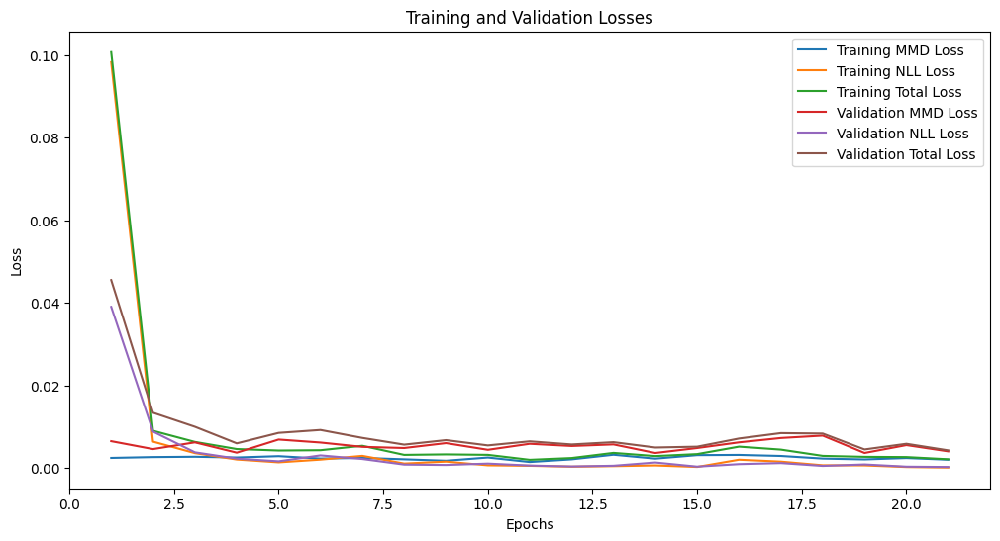

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import math, os
import tensorflow as tf
from tensorflow.keras.layers import ELU, PReLU, LeakyReLU
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Input, Reshape, Flatten, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.utils import plot_model
import pdb
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from scipy import stats
import csv

# Set dimension list for loop
dimension = [40]
# dimension = [2]
for i in dimension:
    # Set parameters
    z_dim = i
    total_epochs = 200
    batch_size = 32

    # Load your data
    # raw = np.load('testdata.npy')
    raw = listOfTopographicMapsForAE  # Replace with your actual data variable
    print(raw.shape)

    train_ratio = 0.7
    val_ratio = 0.15
    test_ratio = 0.15

    # Normalize the data
    dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
    dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

    # Split the data into training, validation, and test sets
    data_train, data_remaining = train_test_split(
        dataNormReshape, test_size=(1 - train_ratio), random_state=42, shuffle=True
    )
    data_val, data_test = train_test_split(
        data_remaining,
        test_size=test_ratio / (test_ratio + val_ratio),
        random_state=42,
        shuffle=True,
    )

    # Design the encoder
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))
    en_conv1 = Conv2D(filters=32, kernel_size=4, strides=2, padding='same',kernel_regularizer=l2(0.01))(encoder_input)
    en_conv1 = BatchNormalization()(en_conv1)
    en_conv1 = LeakyReLU(0.1)(en_conv1)

    en_conv2 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same',kernel_regularizer=l2(0.01))(en_conv1)
    en_conv2 = BatchNormalization()(en_conv2)
    en_conv2 = LeakyReLU(0.1)(en_conv2)

    en_conv3 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same', kernel_regularizer=l2(0.01))(en_conv2)
    en_conv3 = BatchNormalization()(en_conv3)
    en_conv3 = LeakyReLU(0.1)(en_conv3)

    en_conv4 = Conv2D(filters=256, kernel_size=4, strides=2, padding='same',kernel_regularizer=l2(0.01))(en_conv3)
    en_conv4 = BatchNormalization()(en_conv4)
    en_conv4 = LeakyReLU(0.1)(en_conv4)

    en_fc1 = Flatten()(en_conv3)  # Adjusted to match dimensions
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    # Compute latent using mean and variance
    @tf.keras.utils.register_keras_serializable()
    def compute_latent(x):
        mu, sigma = x
        batch = tf.shape(mu)[0]
        eps = tf.random.normal(shape=(batch, z_dim), mean=0.0, stddev=1.0)
        sigma_stable = tf.math.log(1 + tf.math.exp(sigma))  # Numerically stable sigma
        return mu + sigma_stable * eps

    latent_space = Lambda(compute_latent)([mu, sigma])

    # Build the encoder model
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')
    encoder.summary()

    # Design the decoder
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(
        en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu')(decoder_input)
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(
        filters=128, kernel_size=4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(
        filters=64, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv1)
    de_conv3 = Conv2DTranspose(
        filters=32, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv2)
    decoder_output = Conv2DTranspose(
        filters=1, kernel_size=4, strides=2, activation='sigmoid', padding='same')(de_conv2)

    decoder = Model(decoder_input, decoder_output, name='decoder')
    decoder.summary()

    ## MMD Functions
    def compute_kernel(x, y):
        x_size = tf.shape(x)[0]
        y_size = tf.shape(y)[0]
        dim = tf.shape(x)[1]
        x = tf.expand_dims(x, axis=1)  # Shape: (x_size, 1, dim)
        y = tf.expand_dims(y, axis=0)  # Shape: (1, y_size, dim)
        tiled_x = tf.tile(x, [1, y_size, 1])  # Shape: (x_size, y_size, dim)
        tiled_y = tf.tile(y, [x_size, 1, 1])  # Shape: (x_size, y_size, dim)
        return tf.exp(
            -tf.reduce_mean(tf.square(tiled_x - tiled_y), axis=2) / tf.cast(dim, 'float32')
        )

    def compute_mmd(x, y):
        x_kernel = compute_kernel(x, x)
        y_kernel = compute_kernel(y, y)
        xy_kernel = compute_kernel(x, y)
        return (
            tf.reduce_mean(x_kernel)
            + tf.reduce_mean(y_kernel)
            - 2 * tf.reduce_mean(xy_kernel)
        )

    # Custom model subclassing tf.keras.Model
    class CustomLossLayer(tf.keras.Model):
        def __init__(self, encoder, decoder):
            super(CustomLossLayer, self).__init__()
            self.encoder = encoder
            self.decoder = decoder
            self.total_epochs = total_epochs
            self.current_epoch = 0

        def train_step(self, data):
            x = data  # Since we have no labels

            with tf.GradientTape() as tape:
                # Forward pass
                mu, sigma, latent_space = self.encoder(x)
                # Sample train_z from prior distribution
                train_z = tf.random.normal(shape=(tf.shape(x)[0], z_dim), mean=0.0, stddev=1.0)
                xr = self.decoder(latent_space)

                # Custom loss
                loss_mmd = compute_mmd(latent_space, train_z)
                loss_nll = tf.reduce_mean(tf.square(xr - x))

                # Dynamic weight adjustment
                # Scaling factor for NLL
                scale_factor = 400.0

                # Initial weight bias toward NLL
                initial_ratio = 0.10
                w1 = 0.5
                w2 = 1 - w1

                mmd_loss = w1*loss_mmd
                nll_loss =  w2 * (scale_factor * loss_nll)
                total_loss = mmd_loss + nll_loss
                # Dynamically scale NLL
                #total_loss = w1 * loss_mmd + w2 * (scale_factor * loss_nll)

            # Compute gradients
            gradients = tape.gradient(total_loss, self.trainable_variables)
            # Apply gradients
            self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))

            # Log dynamic weights for debugging
            #tf.print("Epoch", self.current_epoch + 1, ": w1=", w1, ", w2=", w2, ", loss=", total_loss)
            # Return a dictionary mapping metric names to current value
            return {'loss': total_loss, 'loss_mmd': mmd_loss, 'loss_nll': nll_loss}

        def on_epoch_end(self, epoch, logs=None):
            # Update current epoch at the end of each epoch
            self.current_epoch += 1

        def test_step(self, data):
            x = data  # Validation data

            # Forward pass
            mu, sigma, latent_space = self.encoder(x)
            train_z = tf.random.normal(shape=(tf.shape(x)[0], z_dim), mean=0.0, stddev=1.0)
            xr = self.decoder(latent_space)

            # Compute losses
            loss_mmd = compute_mmd(latent_space, train_z)
            loss_nll = tf.reduce_mean(tf.square(xr - x))

            # Scaling factor for NLL
            scale_factor = 400.0

            # Initial weight bias toward NLL
            #initial_ratio = 0.80
            #w1 = (self.current_epoch / self.total_epochs) * (1 - initial_ratio)
            w1 = 0.5
            w2 = 1 - w1

            mmd_loss = w1*loss_mmd
            nll_loss =  w2 * (scale_factor * loss_nll)
            total_loss = mmd_loss + nll_loss
            # Dynamically scale NLL
            #total_loss = w1 * loss_mmd + w2 * (scale_factor * loss_nll)

            # Return metrics
            return {'loss': total_loss, 'loss_mmd': mmd_loss, 'loss_nll': nll_loss}

    # Instantiate the custom autoencoder model
    autoencoder = CustomLossLayer(encoder, decoder)
    # Compile the model
    autoencoder.compile(optimizer='adam')

    # Prepare to track the losses
    loss_mmd_list = []
    loss_nll_list = []
    loss_total_list = []

    # Custom callback to store losses
    class LossHistory(tf.keras.callbacks.Callback):
        def on_epoch_end(self, epoch, logs=None):
            loss_mmd_list.append(logs.get('loss_mmd'))
            loss_nll_list.append(logs.get('loss_nll'))
            loss_total_list.append(logs.get('loss'))

    # Define callbacks
    myCallBacks = [
        EarlyStopping(monitor='loss', patience=10, mode='min'),LossHistory(),]

    # Train the model
    history = autoencoder.fit(
        data_train,
        epochs=total_epochs,
        batch_size=batch_size,
        validation_data=data_val,  # No labels needed
        callbacks=myCallBacks,
    )

    # Plot the losses
    epochs_range = range(1, len(loss_mmd_list) + 1)

    plt.figure(figsize=(12, 6))
    plt.plot(epochs_range, loss_mmd_list, label='Training MMD Loss')
    plt.plot(epochs_range, loss_nll_list, label='Training NLL Loss')
    plt.plot(epochs_range, loss_total_list, label='Training Total Loss')

    # Get validation losses from history
    val_loss_mmd_list = history.history.get('val_loss_mmd')
    val_loss_nll_list = history.history.get('val_loss_nll')
    val_loss_total_list = history.history.get('val_loss')

    if val_loss_mmd_list is not None:
        plt.plot(epochs_range, val_loss_mmd_list, label='Validation MMD Loss')
        plt.plot(epochs_range, val_loss_nll_list, label='Validation NLL Loss')
        plt.plot(epochs_range, val_loss_total_list, label='Validation Total Loss')

    plt.title('Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Save the history and model
    save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
    model_name = f'autoencoder_dim{z_dim}'
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    autoencoder.save(f'{save_dir}/{model_name}.h5')
    autoencoder.save_weights(f'{save_dir}/{model_name}_weights.weights.h5')
    np.save(f'{save_dir}/{model_name}_history.npy', history.history)


## Predicted images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


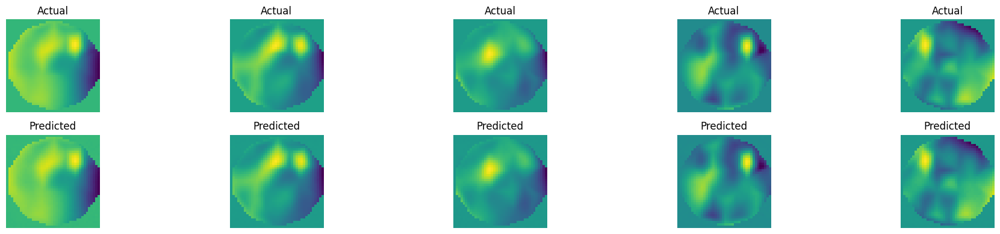

In [ ]:
# Select a subset of actual images from the test set
num_images = 5  # Number of images to display per row
actual_images = data_test[:num_images]

# Generate predicted images for the selected actual images
_, _, latent_vectors = encoder.predict(actual_images)
predicted_images = decoder.predict(latent_vectors)

# Visualize the actual and predicted images
fig, axes = plt.subplots(nrows=2, ncols=num_images, sharex=True, sharey=True, figsize=(20, 4))

# First row: actual images
for i, ax in enumerate(axes[0]):
    ax.imshow(actual_images[i].reshape((raw.shape[1], raw.shape[2])), cmap='viridis')
    ax.set_title("Actual")
    ax.axis('off')

# Second row: predicted images
for i, ax in enumerate(axes[1]):
    ax.imshow(predicted_images[i].reshape((raw.shape[1], raw.shape[2])), cmap='viridis')
    ax.set_title("Predicted")
    ax.axis('off')

plt.tight_layout()
plt.savefig('Actual_vs_Predicted_Comparison.png')
plt.show()

# Optional: Save denormalized predicted images for further evaluation
denormalized_predicted_images = (
    predicted_images * (raw.max() - raw.min())
) + raw.min()


###not needed


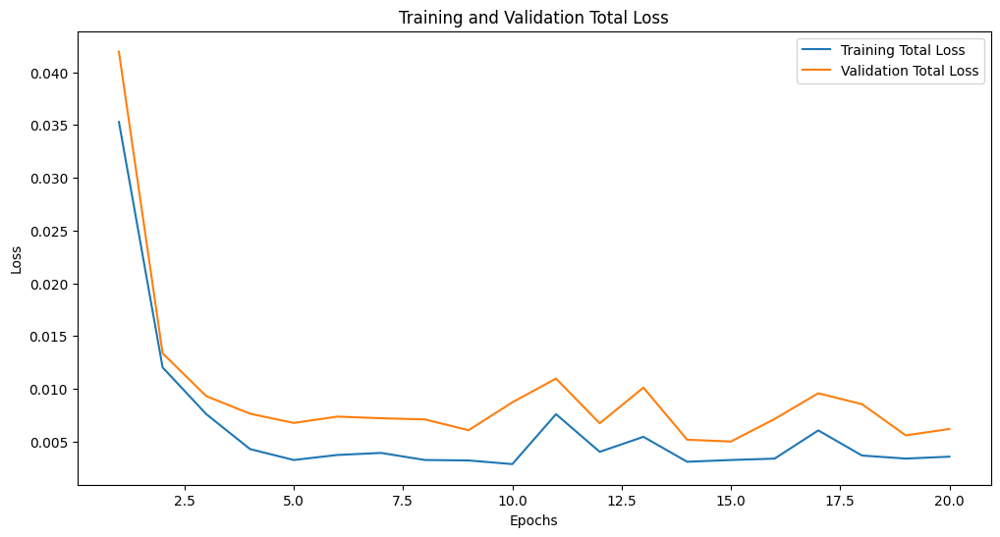

In [ ]:
# Plot the total losses
# Access total training and validation losses
total_loss_list = history.history['loss']
val_total_loss_list = history.history.get('val_loss')

epochs_range = range(1, len(total_loss_list) + 1)

plt.figure(figsize=(12, 6))
plt.plot(epochs_range, total_loss_list, label='Training Total Loss')
if val_total_loss_list is not None:
    plt.plot(epochs_range, val_total_loss_list, label='Validation Total Loss')

plt.title('Training and Validation Total Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
loss_mmd_list = history.history['loss_mmd']
loss_nll_list = history.history['loss_nll']

val_loss_mmd_list = history.history.get('val_loss_mmd')
val_loss_nll_list = history.history.get('val_loss_nll')


In [ ]:
print("MMD Loss History:", loss_tracker.mmd_losses)
print("NLL Loss History:", loss_tracker.nll_losses)


NameError: name 'loss_tracker' is not defined

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import math, os
import tensorflow as tf
from tensorflow.keras.layers import ELU, PReLU, LeakyReLU
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Input, Reshape, Flatten,Lambda
from tensorflow.keras.models import Model
from keras.utils import plot_model
import pdb
from tensorflow.keras import backend as K
from tensorflow.keras.datasets import mnist
from tensorflow.keras.callbacks import  EarlyStopping, Callback
from skimage import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from scipy import stats
import csv

epochs = 200
batch_size = 32

# Normalising the data and splitting
raw = listOfTopographicMapsForAE
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - 0.7), random_state=42, shuffle=True)
data_val, data_test = train_test_split(data_remaining, test_size=0.15/(0.15 + 0.15), random_state=42, shuffle=True)

# Set a Z-score threshold
#threshold = 3

# Filter outliers
#z_scores = np.abs(stats.zscore(data_train.reshape(data_train.shape[0], -1), axis=0))
#outliers = np.where(z_scores > threshold)
#threshold = 3
#filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
#data_train_filtered = data_train[filtered_indices]

dimensions = [40]
for z_dim in dimensions:
    # Define encoder
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))
    en_conv1 = Conv2D(32, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(encoder_input)
    en_conv2 = Conv2D(64, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(en_conv1)
    en_conv3 = Conv2D(128, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(en_conv2)
    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    # Compute latent using mean and variance
    @tf.keras.utils.register_keras_serializable()
    def compute_latent(x):
        mu, sigma = x
        batch = tf.shape(mu)[0]
        eps = tf.random.normal(shape=(batch, z_dim), mean=0., stddev=1.)
        return mu + tf.exp(sigma) * eps

    latent_space = Lambda(compute_latent, name='embedding')([mu, sigma])

    # Build the encoder
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

    # Define decoder
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu')(decoder_input)
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(128, 4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(64, 4, strides=2, activation='relu', padding='same')(de_conv1)
    decoder_output = Conv2DTranspose(1, 4, strides=2, activation='sigmoid', padding='same')(de_conv2)
    decoder = Model(decoder_input, decoder_output, name='decoder')

    # Build the autoencoder for training
    train_z = encoder(encoder_input)[2]
    train_xr = decoder(train_z)
    autoencoder = Model(encoder_input, train_xr)
    autoencoder.summary()

    def compute_kernel(x, y):
        x_size = tf.shape(x)[0]
        y_size = tf.shape(y)[0]
        dim = tf.shape(x)[1]
        x = tf.expand_dims(x, axis=1)  # Shape: (x_size, 1, dim)
        y = tf.expand_dims(y, axis=0)  # Shape: (1, y_size, dim)
        tiled_x = tf.tile(x, [1, y_size, 1])  # Shape: (x_size, y_size, dim)
        tiled_y = tf.tile(y, [x_size, 1, 1])  # Shape: (x_size, y_size, dim)
        return tf.exp(-tf.reduce_mean(tf.square(tiled_x - tiled_y), axis=2) / tf.cast(dim, 'float32'))

    def compute_mmd(x, y):
        x_kernel = compute_kernel(x, x)
        y_kernel = compute_kernel(y, y)
        xy_kernel = compute_kernel(x, y)
        return tf.reduce_mean(x_kernel) + tf.reduce_mean(y_kernel) - 2 * tf.reduce_mean(xy_kernel)

    #function for loss function
    def custom_loss(latent_space, train_z, train_xr, train_x):
        loss_mmd = compute_mmd(latent_space, train_z)
        'Then, also get the reconstructed loss'
        loss_nll = K.mean(K.square(train_xr - train_x))
        'Add them together, then you can get the final loss'
        loss = loss_nll + loss_mmd
        return loss

    outputs = custom_loss(latent_space, train_z, train_xr, encoder_input)
    autoencoder = Model(encoder_input, outputs)
    autoencoder.compile(optimizer='adam')
    myCallBacks = EarlyStopping(monitor='loss', patience=10, mode='min')

    # Custom callback to track individual losses
    class LossHistory(Callback):
        def on_train_begin(self, logs=None):
            self.mmd_losses = []
            self.nll_losses = []
        def on_epoch_end(self, epoch, logs=None):
            batch = data_train[np.random.randint(0, data_train.shape[0], batch_size)]
            batch = tf.convert_to_tensor(batch, dtype=tf.float32)
            mu, sigma, train_z = encoder(batch)
            train_xr = decoder(train_z)
            loss_mmd = compute_mmd(latent_space, train_z)
            loss_nll = tf.reduce_mean(tf.square(train_xr - batch))
            self.mmd_losses.append(loss_mmd.numpy())
            self.nll_losses.append(loss_nll.numpy())

    loss_history = LossHistory()

    # Train the model
    history = autoencoder.fit(
        data_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(data_val, None),
        callbacks=[myCallBacks, loss_history]
    )

    # Plot the loss values over each epoch
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Total Training Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Total Validation Loss')
    plt.plot(loss_history.mmd_losses, label='MMD Loss')
    plt.plot(loss_history.nll_losses, label='NLL Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    plt.show()

    # Save the history and model
    save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
    model_name = f'autoencoder_dim{z_dim}'
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    autoencoder.save(f'{save_dir}/{model_name}.h5')
    autoencoder.save_weights(f'{save_dir}/{model_name}_weights.weights.h5')
    np.save(f'{save_dir}/{model_name}_history.npy', history.history)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_80 (InputLayer)          │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 40), (None, 40),    │         420,656 │
│                                      │ (None, 40)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         525,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 946,289 (3.61 MB)

 Trainable params: 946,289 (3.61 MB)

 Non-trainable params: 0 (0.00 B)

ValueError: A KerasTensor cannot be used as input to a TensorFlow function. A KerasTensor is a symbolic placeholder for a shape and dtype, used when constructing Keras Functional models or Keras Functions. You can only use it as input to a Keras layer or a Keras operation (from the namespaces `keras.layers` and `keras.operations`). You are likely doing something like:

```
x = Input(...)
...
tf_fn(x)  # Invalid.
```

What you should do instead is wrap `tf_fn` in a layer:

```
class MyLayer(Layer):
    def call(self, x):
        return tf_fn(x)

x = MyLayer()(x)
```


In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import math, os
import tensorflow as tf
from tensorflow.keras.layers import ELU, PReLU, LeakyReLU
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Input, Reshape, Flatten,Lambda
from tensorflow.keras.models import Model
from keras.utils import plot_model
import pdb
from tensorflow.keras import backend as K
from tensorflow.keras.datasets import mnist
from tensorflow.keras.callbacks import  EarlyStopping, Callback
from skimage import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from scipy import stats
import csv

epochs = 200
batch_size = 32

# Normalising the data and splitting
raw = listOfTopographicMapsForAE
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - 0.7), random_state=42, shuffle=True)
data_val, data_test = train_test_split(data_remaining, test_size=0.15/(0.15 + 0.15), random_state=42, shuffle=True)

# Set a Z-score threshold
#threshold = 3

# Filter outliers
#z_scores = np.abs(stats.zscore(data_train.reshape(data_train.shape[0], -1), axis=0))
#outliers = np.where(z_scores > threshold)
#threshold = 3
#filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
#data_train_filtered = data_train[filtered_indices]

dimensions = [40]
for z_dim in dimensions:
    # Define encoder
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))
    en_conv1 = Conv2D(32, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(encoder_input)
    en_conv2 = Conv2D(64, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(en_conv1)
    en_conv3 = Conv2D(128, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(en_conv2)
    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    # Compute latent using mean and variance
    @tf.keras.utils.register_keras_serializable()
    def compute_latent(x):
        mu, sigma = x
        batch = tf.shape(mu)[0]
        eps = tf.random.normal(shape=(batch, z_dim), mean=0., stddev=1.)
        return mu + tf.exp(sigma) * eps

    latent_space = Lambda(compute_latent, name='embedding')([mu, sigma])

    # Build the encoder
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

    # Define decoder
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu')(decoder_input)
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(128, 4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(64, 4, strides=2, activation='relu', padding='same')(de_conv1)
    decoder_output = Conv2DTranspose(1, 4, strides=2, activation='sigmoid', padding='same')(de_conv2)
    decoder = Model(decoder_input, decoder_output, name='decoder')

    # Build the autoencoder for training
    train_z = encoder(encoder_input)[2]
    train_xr = decoder(train_z)
    autoencoder = Model(encoder_input, train_xr)
    autoencoder.summary()

    def compute_kernel(x, y):
        x_size = tf.shape(x)[0]
        y_size = tf.shape(y)[0]
        dim = tf.shape(x)[1]
        tiled_x = tf.tile(tf.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = tf.tile(tf.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-tf.reduce_mean(tf.square(tiled_x - tiled_y), axis=2) / tf.cast(dim, 'float32'))

    def compute_mmd(x, y):
        x_kernel = compute_kernel(x, x)
        y_kernel = compute_kernel(y, y)
        xy_kernel = compute_kernel(x, y)
        return tf.reduce_mean(x_kernel) + tf.reduce_mean(y_kernel) - 2 * tf.reduce_mean(xy_kernel)

    @tf.keras.utils.register_keras_serializable()
    class CustomLossLayer(tf.keras.layers.Layer):
        def compute_output_shape(self, input_shape):
            return input_shape[1]
        def call(self, inputs):
            train_z, train_xr, train_x = inputs
            batch_size = tf.shape(train_z)[0]
            latent_dim = tf.shape(train_z)[1]
            reference_samples = tf.random.normal(shape=(batch_size, latent_dim), mean=0., stddev=1.0)
            loss_mmd = compute_mmd(reference_samples, train_z)
            loss_nll = tf.reduce_mean(tf.square(train_xr - train_x))
            self.add_loss(loss_mmd)
            self.add_loss(loss_nll)
            return train_xr

    outputs = CustomLossLayer()([train_z, train_xr, encoder_input])
    autoencoder = Model(encoder_input, outputs)
    autoencoder.compile(optimizer='adam')
    myCallBacks = EarlyStopping(monitor='loss', patience=10, mode='min')

    # Custom callback to track individual losses
    class LossHistory(Callback):
        def on_train_begin(self, logs=None):
            self.mmd_losses = []
            self.nll_losses = []
        def on_epoch_end(self, epoch, logs=None):
            batch = data_train[np.random.randint(0, data_train.shape[0], batch_size)]
            batch = tf.convert_to_tensor(batch, dtype=tf.float32)
            mu, sigma, train_z = encoder(batch)
            train_xr = decoder(train_z)
            latent_dim = tf.shape(train_z)[1]
            reference_samples = tf.random.normal(shape=(batch_size, latent_dim), mean=0., stddev=1.0)
            loss_mmd = compute_mmd(reference_samples, train_z)
            loss_nll = tf.reduce_mean(tf.square(train_xr - batch))
            self.mmd_losses.append(loss_mmd.numpy())
            self.nll_losses.append(loss_nll.numpy())

    loss_history = LossHistory()

    # Train the model
    history = autoencoder.fit(
        data_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(data_val, None),
        callbacks=[myCallBacks, loss_history]
    )

    # Plot the loss values over each epoch
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Total Training Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Total Validation Loss')
    plt.plot(loss_history.mmd_losses, label='MMD Loss')
    plt.plot(loss_history.nll_losses, label='NLL Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    plt.show()

    # Save the history and model
    save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
    model_name = f'autoencoder_dim{z_dim}'
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    autoencoder.save(f'{save_dir}/{model_name}.h5')
    autoencoder.save_weights(f'{save_dir}/{model_name}_weights.weights.h5')
    np.save(f'{save_dir}/{model_name}_history.npy', history.history)


Model: "functional_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_87 (InputLayer)          │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 40), (None, 40),    │         420,656 │
│                                      │ (None, 40)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         525,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 946,289 (3.61 MB)

 Trainable params: 946,289 (3.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200


KeyboardInterrupt: 

###test

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import math, os
import tensorflow as tf
from tensorflow.keras.layers import ELU, PReLU, LeakyReLU
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Input, Reshape, Flatten,Lambda
from tensorflow.keras.models import Model
from keras.utils import plot_model
import pdb
from tensorflow.keras import backend as K
from tensorflow.keras.datasets import mnist
from tensorflow.keras.callbacks import  EarlyStopping, Callback
from skimage import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from scipy import stats
import csv

epochs = 200
batch_size = 32

# Normalising the data and splitting
raw = listOfTopographicMapsForAE
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - 0.7), random_state=42, shuffle=True)
data_val, data_test = train_test_split(data_remaining, test_size=0.15/(0.15 + 0.15), random_state=42, shuffle=True)

# Set a Z-score threshold
#threshold = 3

# Filter outliers
#z_scores = np.abs(stats.zscore(data_train.reshape(data_train.shape[0], -1), axis=0))
#outliers = np.where(z_scores > threshold)
#threshold = 3
#filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
#data_train_filtered = data_train[filtered_indices]

class CustomLossLayer(Layer):
    def __init__(self, **kwargs):
        super(CustomLossLayer, self).__init__(**kwargs)

    def compute_kernel(self, x, y):
        x_size = tf.shape(x)[0]
        y_size = tf.shape(y)[0]
        dim = tf.shape(x)[1]
        tiled_x = tf.tile(tf.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = tf.tile(tf.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return tf.exp(-tf.reduce_mean(tf.square(tiled_x - tiled_y), axis=2) / tf.cast(dim, 'float32'))

    def compute_mmd(self, x, y):
        x_kernel = self.compute_kernel(x, x)
        y_kernel = self.compute_kernel(y, y)
        xy_kernel = self.compute_kernel(x, y)
        return tf.reduce_mean(x_kernel) + tf.reduce_mean(y_kernel) - 2 * tf.reduce_mean(xy_kernel)

    def call(self, inputs):
        latent_space, train_z, train_xr, train_x = inputs  # Assuming these are your inputs
        loss_mmd = self.compute_mmd(latent_space, train_z)
        loss_nll = K.mean(K.square(train_xr - train_x))
        # Ensure loss_mmd is not None before adding it to the losses
        if loss_mmd is not None:
            self.add_loss(loss_mmd)
        self.add_loss(loss_nll)  # Add reconstruction loss to the model's losses
        return train_xr  # Return the reconstructed output

class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.mmd_losses = []
        self.nll_losses = []
        self.total_losses = []
    def on_epoch_end(self, epoch, logs={}):
        # Calculate total loss using your custom_loss function
        batch = data_train[np.random.randint(0, data_train.shape[0], batch_size)]
        batch = tf.convert_to_tensor(batch, dtype=tf.float32)

        mu, sigma, latent_space_batch = encoder(batch)
        train_xr_batch = decoder(latent_space_batch)

        total_loss = custom_loss(latent_space_batch, latent_space_batch, train_xr_batch, batch).numpy()
        self.total_losses.append(total_loss)  # Store total loss

        # Calculate MMD loss using mmd_layer
        loss_mmd = CustomLossLayer.compute_mmd(latent_space_batch, latent_space_batch).numpy()
        self.mmd_losses.append(loss_mmd)

        loss_nll = np.mean(np.square(train_xr_batch.numpy() - batch.numpy()))  # NumPy calculation here
        self.nll_losses.append(loss_nll)

        # Calculate reconstruction loss (total loss - MMD loss)
        total_loss = loss_mmd + loss_nll
        self.total_losses.append(total_loss)

dimensions = [40]
for z_dim in dimensions:
    # Define encoder
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))
    en_conv1 = Conv2D(32, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(encoder_input)
    en_conv2 = Conv2D(64, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(en_conv1)
    en_conv3 = Conv2D(128, 4, strides=2, padding='same', activation=LeakyReLU(0.1))(en_conv2)
    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    # Compute latent using mean and variance
    @tf.keras.utils.register_keras_serializable()
    def compute_latent(x):
        mu, sigma = x
        batch = tf.shape(mu)[0]
        eps = tf.random.normal(shape=(batch, z_dim), mean=0., stddev=1.)
        return mu + tf.exp(sigma) * eps

    latent_space = Lambda(compute_latent, name='embedding')([mu, sigma])

    # Build the encoder
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

    # Define decoder
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu')(decoder_input)
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(128, 4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(64, 4, strides=2, activation='relu', padding='same')(de_conv1)
    decoder_output = Conv2DTranspose(1, 4, strides=2, activation='sigmoid', padding='same')(de_conv2)
    decoder = Model(decoder_input, decoder_output, name='decoder')

    # Build the autoencoder for training
    train_z = encoder(encoder_input)[2]
    train_xr = decoder(train_z)
    autoencoder = Model(encoder_input, train_xr)
    autoencoder.summary()

    custom_loss_layer = CustomLossLayer()
    outputs = custom_loss_layer([latent_space, train_z, train_xr, encoder_input])
    autoencoder.compile(optimizer='adam',  loss=lambda y_true, y_pred: y_pred)
    myCallBacks = EarlyStopping(monitor='loss', patience=10, mode='min')

    loss_history = LossHistory()

    # Train the model
    history = autoencoder.fit(
        data_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(data_val, None),
        callbacks=[myCallBacks, loss_history]
    )

    # Plot the loss values over each epoch
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Total Training Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Total Validation Loss')
    plt.plot(loss_history.mmd_losses, label='MMD Loss')
    plt.plot(loss_history.nll_losses, label='NLL Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs Epochs')
    plt.show()

    # Save the history and model
    save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
    model_name = f'autoencoder_dim{z_dim}'
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    autoencoder.save(f'{save_dir}/{model_name}.h5')
    autoencoder.save_weights(f'{save_dir}/{model_name}_weights.weights.h5')
    np.save(f'{save_dir}/{model_name}_history.npy', history.history)


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_100 (InputLayer)         │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 40), (None, 40),    │         420,656 │
│                                      │ (None, 40)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         525,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 946,289 (3.61 MB)

 Trainable params: 946,289 (3.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200


ValueError: None values not supported.

#DCEC with joint training

In [ ]:
from sklearn.model_selection import train_test_split

# Load your data
# raw = np.load('testdata.npy')
raw = listOfTopographicMapsForAE  # Replace with your actual data variable
print(raw.shape)

train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Normalize the data
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

# Split the data into training, validation, and test sets
data_train, data_remaining = train_test_split(
    dataNormReshape, test_size=(1 - train_ratio), random_state=42, shuffle=True
)
data_val, data_test = train_test_split(
    data_remaining,
    test_size=test_ratio / (test_ratio + val_ratio),
    random_state=42,
    shuffle=True,
)

(24567, 40, 40)


## V1

In [ ]:
from sklearn.cluster import KMeans
import tensorflow as tf
from tensorflow.keras.layers import Layer, InputSpec
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K
from tensorflow.keras.callbacks import  EarlyStopping
import numpy as np
import os

# Define ClusteringLayer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(name='clusters', shape=(self.n_clusters, input_dim), initializer='glorot_uniform')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q


#Add custom loss layer
## MMD Functions
def compute_kernel(x, y):
    x_size = K.shape(x)[0]
    y_size = K.shape(y)[0]
    dim = K.shape(x)[1]
    tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
    tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
    return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

def compute_mmd(x, y):
    x_kernel = compute_kernel(x, x)
    y_kernel = compute_kernel(y, y)
    xy_kernel = compute_kernel(x, y)
    return K.mean(x_kernel) + K.mean(y_kernel) - 2 * K.mean(xy_kernel)

# MMD Functions
@tf.keras.utils.register_keras_serializable()
class CustomLossLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(CustomLossLayer, self).__init__(**kwargs)
        self.loss_mmd = None  # Initialize to None
        self.loss_nll = None  # Initialize to None

    def call(self, inputs):
        latent_space, train_z, train_xr, train_x = inputs
        #Compute MMD
        self.loss_mmd = compute_mmd(latent_space, train_z)
        #Compute NLL
        self.loss_nll = K.mean(K.square(train_xr - train_x))
        #Add both losses
        self.add_loss(self.loss_mmd + self.loss_nll)
        return train_xr

# Define DCEC with Custom Loss Layer
class DCEC:
    def __init__(self, z_dim, encoder, decoder, n_clusters=10, alpha=1.0):
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.z_dim = z_dim
        self.encoder = encoder
        self.decoder = decoder

        # Extract the encoder input
        encoder_input = self.encoder.input

        # Define compute_latent function
        def compute_latent(x):
            mu, sigma = x
            batch = K.shape(mu)[0]
            eps = K.random_normal(shape=(batch, self.z_dim), mean=0., stddev=1.)
            return mu + K.exp(sigma) * eps

        # Compute latent space
        mu = Dense(z_dim, name='mu_layer')(en_fc1)
        sigma = Dense(z_dim, name='sigma_layer')(en_fc1)  # Assuming a layer named 'sigma_layer' for sigma
        latent_space = Lambda(compute_latent, name='embedding')([mu, sigma])

        # Build the autoencoder for training
        train_z = self.encoder(encoder_input)[2]  # Get the latent representation
        train_xr = self.decoder(train_z)  # Reconstruct the input

        # Clustering layer on top of the latent space
        clustering_layer = ClusteringLayer(self.n_clusters, name='clustering')(train_z)

        # Use custom loss layer to combine latent, reconstruction, and input
        self.custom_loss_layer = CustomLossLayer(name='custom_loss_layer')
        reconstruction_output = self.custom_loss_layer([latent_space, train_z, train_xr, encoder_input])

        # Define the complete model with clustering and reconstruction
        self.model = Model(inputs=encoder_input, outputs=[clustering_layer, reconstruction_output])

    def pretrain(self, x, batch_size=32, epochs=200, optimizer='adam', save_dir='/content/drive/MyDrive/Masters Dataset/DCEC'):
        # Pretraining the autoencoder with the custom loss
        print('...Pretraining autoencoder with custom loss...')
        # Use encoder and decoder to build an autoencoder with CustomLossLayer
        latent = self.encoder.get_layer(name='embedding').output
        reconstruction = self.decoder(latent)
        reconstruction_output = self.custom_loss_layer([latent, reconstruction, self.encoder.input])
        autoencoder = Model(self.encoder.input, reconstruction)

        # Adding the early stopping callback
        early_stopping = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

        autoencoder.compile(optimizer=optimizer, loss='mse')  # CustomLossLayer handles the loss internally
        autoencoder.fit(x, x, batch_size=batch_size, epochs=epochs, callbacks=[early_stopping])
        autoencoder.save(save_dir + f'/pretrained_autoencoder_dim{self.z_dim}.h5')
        print(f'Pretrained weights saved to {save_dir}/pretrained_autoencoder_dim{self.z_dim}.h5')

    def compile(self, optimizer='adam'):
        # Compile the model using Kullback-Leibler divergence for clustering and the custom loss for reconstruction
        self.model.compile(optimizer=optimizer, loss=['kld', None], loss_weights=[1, 1])

    def fit(self, x, y=None, batch_size=32, maxiter=200, tol=1e-3, update_interval=100, patience=10):
        print('...Initializing cluster centers using k-means...')
        kmeans = KMeans(n_clusters=self.n_clusters, n_init=20)
        y_pred = kmeans.fit_predict(self.encoder.predict(x)[-1])
        self.model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

        # Compile the model
        self.compile()

        # Dictionary to keep track of losses
        history = {
            'kld_loss': [],
            'mmd_loss': [],
            'nll_loss': []
        }

        # Early stopping for joint training
        early_stopping = EarlyStopping(monitor='loss', patience=patience, restore_best_weights=True)

        # Training loop
        for ite in range(int(maxiter)):
            # Update the target distribution
            if ite % update_interval == 0:
                q, _ = self.model.predict(x, verbose=0)
                p = self.target_distribution(q)

            # Train on batch
            idx = np.random.randint(0, x.shape[0], batch_size)
            loss_values = self.model.train_on_batch(x=x[idx], y=[p[idx], x[idx]])

            # Manually compute the MMD and NLL loss from the custom loss layer
            latent_batch = self.encoder.predict(x[idx])[-1]
            reconstruction_batch = self.decoder.predict(latent_batch)
            mmd_loss_value = compute_mmd(latent_batch, latent_batch)
            nll_loss_value = np.mean(np.square(reconstruction_batch - x[idx]))

            # Record losses
            history['kld_loss'].append(loss_values[1])  # Index 1 is the clustering (KLD) loss
            history['mmd_loss'].append(K.eval(mmd_loss_value))  # Convert Tensor to scalar
            history['nll_loss'].append(nll_loss_value)

            # Early stopping condition
            if len(history['kld_loss']) > patience and all(
                    history['kld_loss'][-patience:] >= min(history['kld_loss'][:-patience])):
                print(f"Early stopping at iteration {ite} due to no improvement in loss")
                break

            if ite % update_interval == 0:
                print(f'Iteration {ite}, kld_loss: {loss_values[1]}, mmd_loss: {history["mmd_loss"][-1]}, nll_loss: {history["nll_loss"][-1]}')

        # Save the history to be used for plots
        self.history = history
        return history


    @staticmethod
    def target_distribution(q):
        weight = q ** 2 / q.sum(0)
        return (weight.T / weight.sum(1)).T

# Train DCEC for different dimensions and number of clusters
dimensions = [40]
K_values = range(2, 21)

for z_dim in dimensions:
    # Load pretrained encoder and decoder for each z_dim
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))
    en_conv1 = Conv2D(filters=32, kernel_size=4, strides=2, padding='same')(encoder_input)
    en_conv1 = LeakyReLU(0.1)(en_conv1)

    en_conv2 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(en_conv1)
    en_conv2 = LeakyReLU(0.1)(en_conv2)

    en_conv3 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(en_conv2)
    en_conv3 = LeakyReLU(0.1)(en_conv3)

    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    # Latent space
    def compute_latent(x):
        mu, sigma = x
        batch = K.shape(mu)[0]
        eps = K.random_normal(shape=(batch, z_dim), mean=0., stddev=1.0)
        return mu + K.exp(sigma) * eps

    latent_space = Lambda(compute_latent, name='embedding')([mu, sigma])

    # Build the encoder
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

    # Design the decoder
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu')(decoder_input)
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(filters=128, kernel_size=4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(filters=64, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv1)
    de_conv3 = Conv2DTranspose(filters=32, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv2)
    decoder_output = Conv2DTranspose(filters=1, kernel_size=4, strides=2, activation='sigmoid', padding='same')(de_conv2)

    decoder = Model(decoder_input, decoder_output, name='decoder')

    for k in K_values:
        print(f'Training DCEC with z_dim={z_dim} and n_clusters={k}...')
        dcec = DCEC(z_dim=z_dim, encoder=encoder, decoder=decoder, n_clusters=k)
        dcec.pretrain(data_train, batch_size=32, epochs=200)
        history = dcec.fit(data_train, maxiter=200)

        # Save the model, weights, and training history
        save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
        model_name = f'DCEC_zdim_{z_dim}_nclusters_{k}'
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        dcec.model.save(f'{save_dir}/{model_name}.h5')
        dcec.model.save_weights(f'{save_dir}/{model_name}_weights.weights.h5')

        # Assuming training history is available
        if history:
            np.save(f'{save_dir}/{model_name}_history.npy', history)
        # Save cluster centroids
        cluster_layer = dcec.model.get_layer(name='clustering')
        cluster_centroids = cluster_layer.get_weights()[0] if cluster_layer is not None else None
        if cluster_centroids is not None:
            np.save(f'{save_dir}/{model_name}_cluster_centroids.npy', cluster_centroids)


Training DCEC with z_dim=40 and n_clusters=2...
...Pretraining autoencoder with custom loss...


ValueError: Exception encountered when calling CustomLossLayer.call().

[1mCould not automatically infer the output shape / dtype of 'custom_loss_layer' (of type CustomLossLayer). Either the `CustomLossLayer.call()` method is incorrect, or you need to implement the `CustomLossLayer.compute_output_spec() / compute_output_shape()` method. Error encountered:

not enough values to unpack (expected 4, got 3)[0m

Arguments received by CustomLossLayer.call():
  • args=(['<KerasTensor shape=(None, 40), dtype=float32, sparse=False, name=keras_tensor_2958>', '<KerasTensor shape=(None, 40, 40, 1), dtype=float32, sparse=False, name=keras_tensor_2978>', '<KerasTensor shape=(None, 40, 40, 1), dtype=float32, sparse=False, name=keras_tensor_2945>'],)
  • kwargs=<class 'inspect._empty'>

In [ ]:
# Import statements
from sklearn.cluster import KMeans
import tensorflow as tf
from tensorflow.keras.layers import Layer, Input, Conv2D, LeakyReLU, Flatten, Dense, Lambda, Reshape, Conv2DTranspose
from tensorflow.keras.models import Model

class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(name='clusters', shape=(self.n_clusters, input_dim), initializer='glorot_uniform')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# Instantiate and test
clustering_layer = ClusteringLayer(n_clusters=10)
print(hasattr(clustering_layer, 'save_weights'))  # Should output: True

# Build the layer
dummy_input = tf.random.normal((1, 64))
clustering_layer(dummy_input)

# Save weights
clustering_layer.save_weights('clustering.weights.h5')


False


AttributeError: 'ClusteringLayer' object has no attribute 'save_weights'

##V2

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Layer, InputSpec, Input, Conv2D, LeakyReLU, Flatten, Dense, Lambda, Reshape, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K
from sklearn.cluster import KMeans
import os

save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
model_name = f'DCEC_zdim_{z_dim}_nclusters_{k}'

# Define ClusteringLayer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(
            name='clusters',
            shape=(self.n_clusters, input_dim),
            initializer='glorot_uniform'
        )
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (
            1.0
            + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha)
        )
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# MMD Functions
def compute_kernel(x, y):
    x_size = tf.shape(x)[0]
    y_size = tf.shape(y)[0]
    dim = tf.shape(x)[1]
    x = tf.expand_dims(x, axis=1)  # Shape: (x_size, 1, dim)
    y = tf.expand_dims(y, axis=0)  # Shape: (1, y_size, dim)
    tiled_x = tf.tile(x, [1, y_size, 1])  # Shape: (x_size, y_size, dim)
    tiled_y = tf.tile(y, [x_size, 1, 1])  # Shape: (x_size, y_size, dim)
    return tf.exp(
        -tf.reduce_mean(tf.square(tiled_x - tiled_y), axis=2) / tf.cast(dim, 'float32')
    )

def compute_mmd(x, y):
    x_kernel = compute_kernel(x, x)
    y_kernel = compute_kernel(y, y)
    xy_kernel = compute_kernel(x, y)
    return (
        tf.reduce_mean(x_kernel)
        + tf.reduce_mean(y_kernel)
        - 2 * tf.reduce_mean(xy_kernel)
    )

# Define the CustomLossLayer
# Custom model subclassing tf.keras.Model
class CustomLossLayer(tf.keras.Model):
    def __init__(self, encoder, decoder, total_epochs):
        super(CustomLossLayer, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.total_epochs = total_epochs
        self.current_epoch = 0

    def train_step(self, data):
        x = data  # Since we have no labels

        with tf.GradientTape() as tape:
            # Forward pass
            mu, sigma, latent_space = self.encoder(x)
            # Sample train_z from prior distribution
            train_z = tf.random.normal(shape=(tf.shape(x)[0], z_dim), mean=0.0, stddev=1.0)
            xr = self.decoder(latent_space)

            # Custom loss
            loss_mmd = compute_mmd(latent_space, train_z)
            loss_nll = tf.reduce_mean(tf.square(xr - x))

            # Dynamic weight adjustment
            # Scaling factor for NLL
            scale_factor = 400.0

            # Initial weight bias toward NLL
            initial_ratio = 0.10
            w1 = 0.5
            w2 = 1 - w1

            mmd_loss = w1*loss_mmd
            nll_loss =  w2 * (scale_factor * loss_nll)
            total_loss = mmd_loss + nll_loss
            # Dynamically scale NLL
            #total_loss = w1 * loss_mmd + w2 * (scale_factor * loss_nll)

        # Compute gradients
        gradients = tape.gradient(total_loss, self.trainable_variables)
        # Apply gradients
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))

        # Log dynamic weights for debugging
        #tf.print("Epoch", self.current_epoch + 1, ": w1=", w1, ", w2=", w2, ", loss=", total_loss)
        # Return a dictionary mapping metric names to current value
        return {'loss': total_loss, 'loss_mmd': mmd_loss, 'loss_nll': nll_loss}

    def on_epoch_end(self, epoch, logs=None):
        # Update current epoch at the end of each epoch
        self.current_epoch += 1

    def test_step(self, data):
        x = data  # Validation data

        # Forward pass
        mu, sigma, latent_space = self.encoder(x)
        train_z = tf.random.normal(shape=(tf.shape(x)[0], z_dim), mean=0.0, stddev=1.0)
        xr = self.decoder(latent_space)

        # Compute losses
        loss_mmd = compute_mmd(latent_space, train_z)
        loss_nll = tf.reduce_mean(tf.square(xr - x))

        # Scaling factor for NLL
        scale_factor = 400.0

        # Initial weight bias toward NLL
        #initial_ratio = 0.80
        #w1 = (self.current_epoch / self.total_epochs) * (1 - initial_ratio)
        w1 = 0.5
        w2 = 1 - w1

        mmd_loss = w1*loss_mmd
        nll_loss =  w2 * (scale_factor * loss_nll)
        total_loss = mmd_loss + nll_loss
        # Dynamically scale NLL
        #total_loss = w1 * loss_mmd + w2 * (scale_factor * loss_nll)
        return {'loss': total_loss, 'loss_mmd': mmd_loss, 'loss_nll': nll_loss}

# Define DCEC class
class DCEC:
    def __init__(self, input_shape, z_dim=40, n_clusters=20, alpha=1.0):
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.z_dim = z_dim

        # Build the encoder
        encoder_input = Input(shape=input_shape)
        en_conv1 = Conv2D(filters=32, kernel_size=4, strides=2, padding='same')(encoder_input)
        en_conv1 = LeakyReLU(0.1)(en_conv1)

        en_conv2 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(en_conv1)
        en_conv2 = LeakyReLU(0.1)(en_conv2)

        en_conv3 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(en_conv2)
        en_conv3 = LeakyReLU(0.1)(en_conv3)

        en_fc1 = Flatten()(en_conv3)
        mu = Dense(z_dim)(en_fc1)
        sigma = Dense(z_dim)(en_fc1)

        def compute_latent(x):
            mu, sigma = x
            batch = tf.shape(mu)[0]
            eps = tf.random.normal(shape=(batch, self.z_dim), mean=0., stddev=1.)
            return mu + tf.exp(sigma) * eps

        latent_space = Lambda(compute_latent, name='latent_space')([mu, sigma])

        self.encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

        # Build the decoder
        decoder_input = Input(shape=(z_dim,))
        de_fc2 = Dense(
            en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu'
        )(decoder_input)
        de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
        de_conv1 = Conv2DTranspose(
            filters=128, kernel_size=4, strides=2, activation='relu', padding='same'
        )(de_fc2)
        de_conv2 = Conv2DTranspose(
            filters=64, kernel_size=4, strides=2, activation='relu', padding='same'
        )(de_conv1)
        de_conv3 = Conv2DTranspose(
            filters=32, kernel_size=4, strides=2, activation='relu', padding='same'
        )(de_conv2)
        decoder_output = Conv2DTranspose(
            filters=1, kernel_size=4, strides=2, activation='sigmoid', padding='same'
        )(de_conv2)

        self.decoder = Model(decoder_input, decoder_output, name='decoder')

        # Build the model
        self.optimizer = tf.keras.optimizers.Adam()
        self.clustering_layer = ClusteringLayer(self.n_clusters, name='clustering')
        self.current_epoch = 0

    def pretrain(self, x, batch_size=32, epochs=200, optimizer='adam', save_dir='save_dir'):
        print('...Pretraining autoencoder...')
        # Build autoencoder model for pretraining
        autoencoder = CustomLossLayer(self.encoder, self.decoder, total_epochs = epochs)
        autoencoder.compile(optimizer=optimizer)

        # Early stopping callback
        early_stopping = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

        # Pretrain
        history = autoencoder.fit(x, epochs=epochs, batch_size=batch_size, callbacks=[early_stopping], verbose=1)

        # Save weights and history
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        autoencoder.save_weights(f'{save_dir}/pretrained_autoencoder_weights.weights.h5')
        np.save(f'{save_dir}/pretrain_history.npy', dict(history.history))
        print(f'Pretrained weights are saved to {save_dir}/pretrained_autoencoder_weights.weights.h5')

        # Load weights into the encoder and decoder
        self.encoder.set_weights(autoencoder.encoder.get_weights())
        self.decoder.set_weights(autoencoder.decoder.get_weights())

    def target_distribution(self, q):
        # Compute the weight numerator: q ** 2
        weight_numerator = tf.square(q)
        # Compute the weight denominator: sum over samples for each cluster
        weight_denominator = tf.reduce_sum(q, axis=0, keepdims=True)
        # Compute weight: weight_numerator / weight_denominator
        weight = weight_numerator / weight_denominator
        # Compute the normalized weight: divide by sum over clusters for each sample
        weight_sum = tf.reduce_sum(weight, axis=1, keepdims=True)
        p = weight / weight_sum
        return p

    def fit(self, x, y=None, batch_size=32, maxiter=200, tol=1e-2, update_interval=100, save_dir='save_dir', patience=10):
        print('...Initializing cluster centers with k-means...')
        # Get latent representations
        _, _, latent_space = self.encoder.predict(x)
        # Build the clustering layer by calling it once
        _ = self.clustering_layer(latent_space)
        # Run KMeans
        kmeans = KMeans(n_clusters=self.n_clusters, n_init=20)
        y_pred = kmeans.fit_predict(latent_space)
        # Set cluster centers
        initial_cluster_weights = [kmeans.cluster_centers_] # Storing the initial cluster weights for safety
        self.clustering_layer.set_weights(initial_cluster_weights)

        # Initialize variables
        index_array = np.arange(x.shape[0])
        index = 0
        losses = []

        # Ensure x is a float32 tensor
        if not isinstance(x, tf.Tensor):
            x = tf.convert_to_tensor(x, dtype=tf.float32)
        p = None  # Initialize p

        # Training loop
        for ite in range(int(maxiter)):
            if ite % update_interval == 0:
                # Update target distribution p
                _, _, latent_space = self.encoder.predict(x)
                q = self.clustering_layer(latent_space)
                p = self.target_distribution(q)
                '''
                # Evaluate clustering performance if y is provided
                if y is not None:
                    y_pred = q.argmax(1)
                    acc = np.round(cluster_acc(y, y_pred), 5)
                    nmi = np.round(metrics.normalized_mutual_info_score(y, y_pred), 5)
                    ari = np.round(metrics.adjusted_rand_score(y, y_pred), 5)
                    print(f'Iter {ite}: Acc={acc}, nmi={nmi}, ari={ari}')
                '''
            # Sample a batch of data
            if (index + 1) * batch_size > x.shape[0]:
                idx = index_array[index * batch_size :]
                index = 0
            else:
                idx = index_array[index * batch_size : (index + 1) * batch_size]
                index += 1

            # Convert idx to a TensorFlow tensor
            idx_tensor = tf.convert_to_tensor(idx, dtype=tf.int32)

            # Use tf.gather to index x and p
            x_batch = tf.gather(x, idx_tensor)
            p_batch = tf.gather(p, idx_tensor)

            # Cast x_batch to float32 to ensure data type consistency
            x_batch = tf.cast(x_batch, dtype=tf.float32)

            with tf.GradientTape() as tape:
                # Forward pass
                mu, sigma, latent = self.encoder(x_batch)
                xr = self.decoder(latent)
                q_batch = self.clustering_layer(latent)

                # Sample from prior
                train_z = tf.random.normal(shape=(tf.shape(x_batch)[0], self.z_dim), mean=0.0, stddev=1.0)

                # Compute losses
                loss_mmd = compute_mmd(latent, train_z)
                loss_nll = tf.reduce_mean(tf.square(xr - x_batch))

                #Apply weights
                # Dynamic weight adjustment
                scale_factor = 400.0
                w1, w2 = 0.5, 0.5  # Dynamic weights can be updated here
                mmd_loss = w1 * loss_mmd
                nll_loss = w2 * (scale_factor * loss_nll)
                reconstruction_loss = loss_mmd + loss_nll

                # Clustering loss
                loss_clustering = tf.reduce_mean(tf.keras.losses.KLD(p_batch, q_batch))

                #losses = {'reconstruction_loss': [], 'clustering_loss': [], 'mmd_loss': [], 'nll_loss': []}
                #losses['reconstruction_loss'].append(reconstruction_loss.numpy())
                #losses['clustering_loss'].append(loss_clustering.numpy())
                #losses['mmd_loss'].append(loss_mmd.numpy())
                #losses['nll_loss'].append(loss_nll.numpy())

            # Compute and apply gradients
            variables = self.encoder.trainable_variables + self.decoder.trainable_variables + self.clustering_layer.trainable_variables
            gradients = tape.gradient(reconstruction_loss, variables)
            self.optimizer.apply_gradients(zip(gradients, variables))
            self.current_epoch += 1

            # Store losses
            if ite == 0:
                self.losses = {'reconstruction_loss': [], 'clustering_loss': [], 'mmd_loss': [], 'nll_loss': []}
            self.losses['reconstruction_loss'].append(reconstruction_loss.numpy())
            self.losses['clustering_loss'].append(loss_clustering.numpy())
            self.losses['mmd_loss'].append(mmd_loss.numpy())
            self.losses['nll_loss'].append(nll_loss.numpy())

            print(f"Iter {ite}, Reconstruction Loss: {reconstruction_loss.numpy():.4f}, Clustering Loss: {loss_clustering.numpy():.4f}, "
              f"MMD Loss: {mmd_loss.numpy():.4f}, NLL Loss: {nll_loss.numpy():.4f}")

        # Save final model weights and training history
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        self.encoder.save_weights(f'{save_dir}/dcec_encoder_weights.weights.h5')
        self.decoder.save_weights(f'{save_dir}/dcec_decoder_weights.weights.h5')
        #self.clustering_layer.save_weights(f'{save_dir}/dcec_clustering_weights.weights.h5')
        np.save(f'{save_dir}/{model_name}dcec_training_history.npy', self.losses)

        # Verify saved losses
        saved_losses = np.load(f'{save_dir}/dcec_training_history.npy', allow_pickle=True).item()
        print("Saved Losses:", saved_losses)

        # Save cluster centroids
        cluster_centroids = self.clustering_layer.get_weights()[0]
        np.save(f'{save_dir}/{model_name}_dcec_cluster_centroids.npy', cluster_centroids)

        #Save loss history
        #np.save(f'{save_dir}/{model_name}_training_history.npy', losses)

        # Store losses in self for access after training
        self.losses = losses

        print(f'Model weights, training history, and cluster centroids saved to {save_dir}')

input_shape = (raw.shape[1], raw.shape[2], 1)
dimensions = [40]
K_values = range(2, 21)

for z_dim in dimensions:
    for k in K_values:
        print(f'Training DCEC with z_dim={z_dim} and n_clusters={k}...')

        # Initialize DCEC model with the current 'k'
        dcec = DCEC(input_shape=input_shape, z_dim=z_dim, n_clusters=k, alpha=1.0)

        # Pretrain the autoencoder
        dcec.pretrain(data_train, batch_size=32, epochs=200, save_dir='save_dir')

        # Fit the DCEC model
        history = dcec.fit(data_train, maxiter=200, batch_size=32, update_interval=100, save_dir='save_dir', patience=10)

        # Save the model, weights, and training history
        save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
        model_name = f'DCEC_zdim_{z_dim}_nclusters_{k}'
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

        # Save encoder and decoder models
        dcec.encoder.save(f'{save_dir}/{model_name}_encoder.h5')
        dcec.decoder.save(f'{save_dir}/{model_name}_decoder.h5')

        # Save clustering layer weights
        np.save(f'{save_dir}/{model_name}_clustering_weights.npy', dcec.clustering_layer.get_weights())

        # Save training history
        np.save(f'{save_dir}/{model_name}_dcec_training_history.npy', history.history)

        # Save cluster centroids
        cluster_centroids = dcec.clustering_layer.get_weights()[0]
        np.save(f'{save_dir}/{model_name}_cluster_centroids.npy', cluster_centroids)

        print(f'Model saved for z_dim={z_dim} and n_clusters={k}')


NameError: name 'z_dim' is not defined

In [ ]:
import pandas as pd

history_df = pd.DataFrame(history.history)
history_df.to_csv(f'/content/drive/MyDrive/Masters Dataset/New Results/dcec_dim{z_dim}_history.csv', index=False)


In [ ]:
# Load and verify
loaded_losses = np.load(f'{save_dir}/{model_name}dcec_training_history.npy', allow_pickle=True).item()
print(loaded_losses)


### loss graphs

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

def plot_saved_losses(save_dir, z_dim, K_values):
    """
    Load and plot saved training losses for different cluster values (K).

    Args:
        save_dir (str): Directory where training histories are saved.
        z_dim (int): The dimensionality of the latent space (z_dim).
        K_values (range): The range of cluster values (K) to plot.
    """
    # Calculate the grid dimensions for subplots
    num_plots = len(K_values)
    num_cols = 2  # Number of columns in the grid
    num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows

    # Create the subplots grid
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))
    axs = axs.flatten()  # Flatten the array of axes for easier iteration

    for i, k in enumerate(K_values):
        # Construct the file path for the current K's history
        model_name = f'DCEC_zdim_{z_dim}_nclusters_{k}'
        history_file_path = os.path.join(save_dir, f'{model_name}_training_history.npy')

        # Check if the file exists before loading
        if os.path.exists(history_file_path):
            # Load the history file
            losses = np.load(history_file_path, allow_pickle=True).item()

            # Extract loss values
            reconstruction_loss = losses['reconstruction_loss']
            clustering_loss = losses['clustering_loss']
            mmd_loss = losses['mmd_loss']
            nll_loss = losses['nll_loss']

            # Plot the losses
            axs[i].plot(reconstruction_loss, label='Reconstruction Loss')
            axs[i].plot(clustering_loss, label='Clustering Loss')
            axs[i].plot(mmd_loss, label='MMD Loss')
            axs[i].plot(nll_loss, label='NLL Loss')

            axs[i].set_title(f'Losses for K = {k}')
            axs[i].set_xlabel('Iterations')
            axs[i].set_ylabel('Loss Value')
            axs[i].legend()
            axs[i].grid(True)
        else:
            axs[i].text(0.5, 0.5, 'No data', ha='center', va='center', fontsize=12)
            axs[i].set_title(f'K = {k}')
            axs[i].set_xticks([])
            axs[i].set_yticks([])

    # Hide any unused subplots
    for j in range(len(K_values), len(axs)):
        fig.delaxes(axs[j])

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()


In [ ]:
print("Reconstruction Losses:", self.losses['reconstruction_loss'])
print("Clustering Losses:", self.losses['clustering_loss'])
print("MMD Losses:", self.losses['mmd_loss'])
print("NLL Losses:", self.losses['nll_loss'])


NameError: name 'self' is not defined

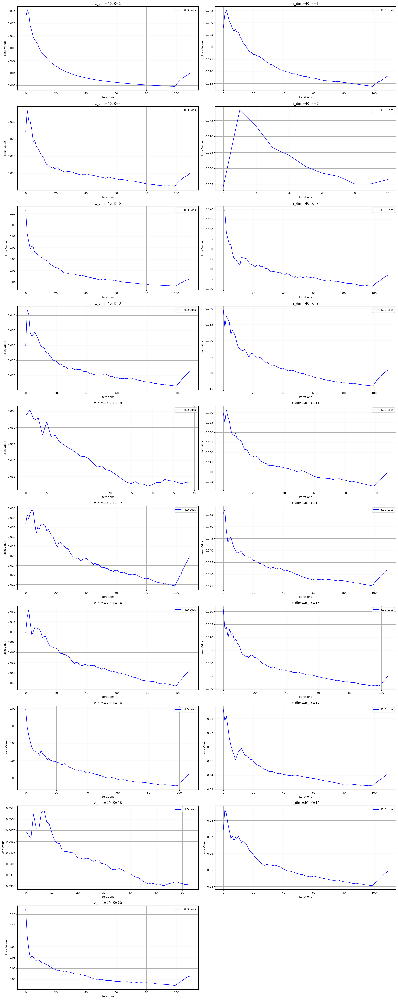

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the directory where the histories are saved and the values for z_dim and K
save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
z_dim = 40
K_values = range(2, 21)

# Calculate the number of rows and columns for the grid
num_plots = len(K_values)
num_cols = 2  # You can adjust this based on how wide you want the grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows needed

# Create the subplots grid
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))
axs = axs.flatten()  # Flatten the array of axes for easier iteration

# Loop through each K value and plot the respective losses in the grid
for i, k in enumerate(K_values):
    # Load the history for the current K
    history_file_path = f'{save_dir}/DCEC_zdim_{z_dim}_nclusters_{k}_history.npy'
    try:
        history = np.load(history_file_path, allow_pickle=True).item()
    except FileNotFoundError:
        print(f'History file for z_dim={z_dim}, K={k} not found. Skipping.')
        continue

    # Extract the losses
    kld_loss = history['kld_loss']


    # Plotting the losses
    axs[i].plot(kld_loss, label='KLD Loss', color='blue')
    axs[i].set_xlabel('Iterations')
    axs[i].set_ylabel('Loss Value')
    axs[i].set_title(f'z_dim={z_dim}, K={k}')
    axs[i].legend()
    axs[i].grid(True)

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout to ensure proper spacing
plt.tight_layout()
plt.show()


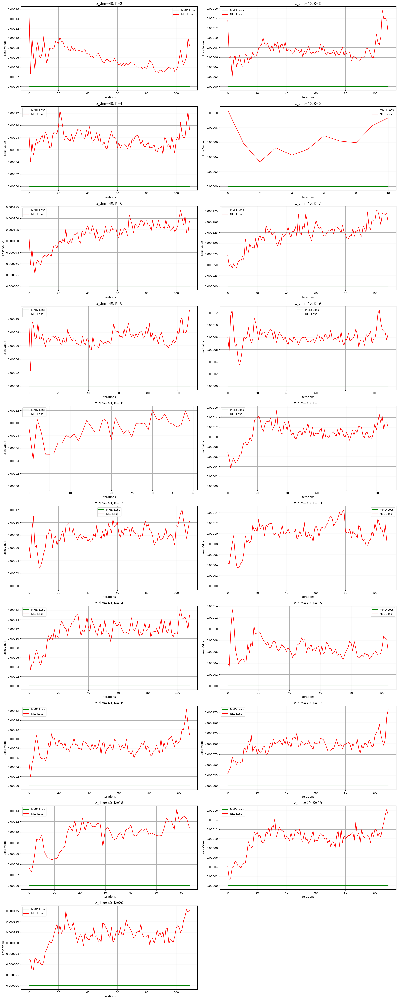

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the directory where the histories are saved and the values for z_dim and K
save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
z_dim = 40
K_values = range(2, 21)

# Calculate the number of rows and columns for the grid
num_plots = len(K_values)
num_cols = 2  # You can adjust this based on how wide you want the grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows needed

# Create the subplots grid
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))
axs = axs.flatten()  # Flatten the array of axes for easier iteration

# Loop through each K value and plot the respective losses in the grid
for i, k in enumerate(K_values):
    # Load the history for the current K
    history_file_path = f'{save_dir}/DCEC_zdim_{z_dim}_nclusters_{k}_history.npy'
    try:
        history = np.load(history_file_path, allow_pickle=True).item()
    except FileNotFoundError:
        print(f'History file for z_dim={z_dim}, K={k} not found. Skipping.')
        continue

    # Extract the losses
    mmd_loss = history['mmd_loss']
    nll_loss = history['nll_loss']

    # Plotting the losses
    axs[i].plot(mmd_loss, label='MMD Loss', color='green')
    axs[i].plot(nll_loss, label='NLL Loss', color='red')
    axs[i].set_xlabel('Iterations')
    axs[i].set_ylabel('Loss Value')
    axs[i].set_title(f'z_dim={z_dim}, K={k}')
    axs[i].legend()
    axs[i].grid(True)

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout to ensure proper spacing
plt.tight_layout()
plt.show()


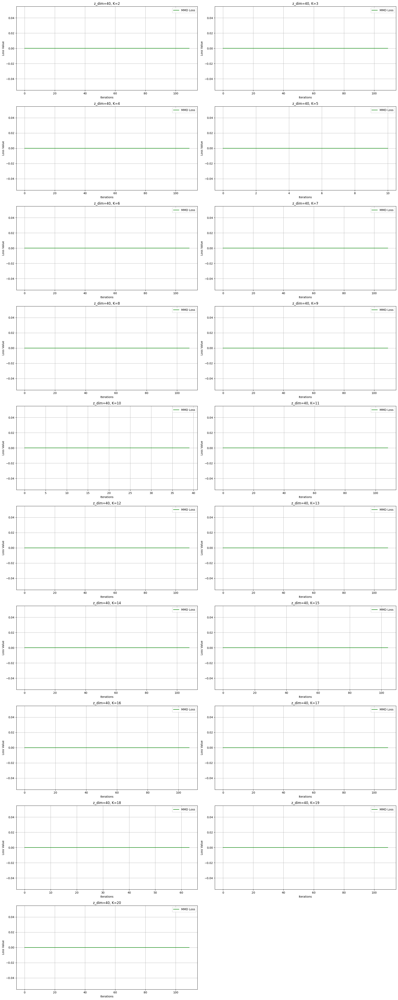

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the directory where the histories are saved and the values for z_dim and K
save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
z_dim = 40
K_values = range(2, 21)

# Calculate the number of rows and columns for the grid
num_plots = len(K_values)
num_cols = 2  # You can adjust this based on how wide you want the grid
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate the number of rows needed

# Create the subplots grid
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))
axs = axs.flatten()  # Flatten the array of axes for easier iteration

# Loop through each K value and plot the respective losses in the grid
for i, k in enumerate(K_values):
    # Load the history for the current K
    history_file_path = f'{save_dir}/DCEC_zdim_{z_dim}_nclusters_{k}_history.npy'
    try:
        history = np.load(history_file_path, allow_pickle=True).item()
    except FileNotFoundError:
        print(f'History file for z_dim={z_dim}, K={k} not found. Skipping.')
        continue

    # Extract the losses
    mmd_loss = history['mmd_loss']

    # Plotting the losses
    axs[i].plot(mmd_loss, label='MMD Loss', color='green')
    axs[i].set_xlabel('Iterations')
    axs[i].set_ylabel('Loss Value')
    axs[i].set_title(f'z_dim={z_dim}, K={k}')
    axs[i].legend()
    axs[i].grid(True)

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout to ensure proper spacing
plt.tight_layout()
plt.show()


In [ ]:
# Print the absolute values of the MMD losses
print("Absolute MMD Loss Values over Iterations:")
for i, mmd_value in enumerate(history['mmd_loss']):
    print(f"Iteration {i}, Absolute MMD Loss: {abs(mmd_value)}")


In [ ]:
# Evaluate the performance of autoencoder for training, validation, and test data
predicted_wholedataset = dcec.predict(dataNormReshape).reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])
predicted_train = dcec.predict(data_train).reshape(-1, data_train.shape[1], data_train.shape[2])
predicted_test = dcec.predict(data_test).reshape(-1, data_test.shape[1], data_test.shape[2])

actual_train = data_train.reshape(-1, data_train.shape[1], data_train.shape[2])
actual_test = data_test.reshape(-1, data_test.shape[1], data_test.shape[2])

# Visualize actual and predicted image
fig, axes = plt.subplots(nrows=2, ncols=5, sharex=True, sharey=True, figsize=(20, 4))
for images, row in zip([actual_test[100:105], predicted_test[100:105]], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((raw.shape[1], raw.shape[2])))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
plt.savefig('ActualPredicted5Images')

# Denormalize and compare topographic map from raw data with denormalized reconstructed topographic map
outputDenormalisedData = predicted_wholedataset * (raw.max() - raw.min()) + raw.min()
outputDenormalisedData = outputDenormalisedData.reshape(-1, outputDenormalisedData.shape[1], outputDenormalisedData.shape[2])

AttributeError: 'DCEC' object has no attribute 'predict'

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Number of images to compare
num_images = 100

data_train_filtered = data_train_filtered

# Randomly pick indices from the training and test sets
train_indices = np.random.choice(len(data_train_filtered), num_images // 2, replace=False)
test_indices = np.random.choice(len(data_test), num_images // 2, replace=False)

# Combine the selected indices from training and test sets
selected_train_images = data_train_filtered[train_indices]
selected_test_images = data_test[test_indices]

# Combine the selected images into one dataset
selected_images = np.concatenate([selected_train_images, selected_test_images], axis=0)

# Predict the reconstructed images using the vae_deep_clustering
predicted_images = vae_deep_clustering.predict(selected_images).reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])

# Reshape the actual images for comparison
actual_images = selected_images.reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])

# Plot 100 original images vs. reconstructed images in a 10x10 grid
fig, axes = plt.subplots(nrows=20, ncols=10, sharex=True, sharey=True, figsize=(20, 40))

for i in range(num_images):
    # Original images
    ax = axes[2 * (i // 10), i % 10]
    ax.imshow(actual_images[i].squeeze(), cmap='viridis')  # Set the colormap to 'viridis'
    ax.set_title(f'Original {i+1}', fontsize=8)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Reconstructed images
    ax = axes[2 * (i // 10) + 1, i % 10]
    ax.imshow(predicted_images[i].squeeze(), cmap='viridis')  # Set the colormap to 'viridis'
    ax.set_title(f'Reconstructed {i+1}', fontsize=8)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.tight_layout()
plt.savefig('ActualVsReconstructed100Images.png')
plt.show()

# Denormalize and compare topographic map from raw data with denormalized reconstructed topographic map
outputDenormalisedData = predicted_images * (raw.max() - raw.min()) + raw.min()


NameError: name 'data_train_filtered' is not defined

## Model Metrics Table


In [ ]:
from skimage import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from scipy import stats
#raw=np.load('testdata.npy')
raw=listOfTopographicMapsForAE
raw.shape

train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

#Normalise the data
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape=dataNorm.reshape(-1,raw.shape[1],raw.shape[2],1)

# First split: 70% training and 30% remaining (to be split into validation and test)
data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - train_ratio), random_state=42, shuffle=True)

# Second split: 15% validation and 15% testing from the remaining 30%
data_val, data_test = train_test_split(data_remaining, test_size=test_ratio/(test_ratio + val_ratio), random_state=42, shuffle=True)
#data_train.shape,data_test.shape,data_val.shape

# Flatten the data to make it easier to compute Z-scores
data_train_flat = data_train.reshape(data_train.shape[0], -1)

# Calculate Z-scores
z_scores = np.abs(stats.zscore(data_train_flat, axis=0))

# Set a Z-score threshold (e.g., 3)
threshold = 3

# Identify outliers
outliers = np.where(z_scores > threshold)

# Filter out the outliers
filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
data_train_filtered = data_train[filtered_indices]


In [ ]:
from skimage.metrics import structural_similarity, mean_squared_error
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from scipy import stats
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K
from tensorflow.keras.utils import custom_object_scope
import csv
from datetime import datetime

# Define functions for SSIM, MSE, MAE, MAPE, MdAPE with appropriate data_range for SSIM
def SSIM(actual, pred, data_range):
    ssimErrAllPair = 0
    for i in range(actual.shape[0]):
        ssimErrAllPair += structural_similarity(actual[i], pred[i], data_range=data_range) / actual.shape[0]
    return ssimErrAllPair

def MSE(actual, pred):
    mseErrAllPair = 0
    for i in range(actual.shape[0]):
        mseErrAllPair += mean_squared_error(actual[i], pred[i]) / actual.shape[0]
    return mseErrAllPair

def MAE(actual, pred):
    MA_error_all = 0
    for i in range(actual.shape[0]):
        MA_error_all += mean_absolute_error(actual[i], pred[i]) / actual.shape[0]
    return MA_error_all

def MAPE(actual, pred):
    epsilon = 1e-10  # Small constant to avoid division by zero or very small values
    non_zero_indices = actual != 0  # Mask for non-zero actual values
    actual_non_zero = actual[non_zero_indices]
    pred_non_zero = pred[non_zero_indices]

    percentage_errors = np.abs((actual_non_zero - pred_non_zero) / actual_non_zero) * 100
    return np.mean(percentage_errors)

def MdAPE(actual, pred):
    epsilon = 1e-10  # Small constant to avoid division by zero or very small values
    non_zero_indices = actual != 0  # Mask for non-zero actual values
    actual_non_zero = actual[non_zero_indices]
    pred_non_zero = pred[non_zero_indices]

    percentage_errors = np.abs((actual_non_zero - pred_non_zero) / actual_non_zero) * 100
    return np.median(percentage_errors)

# Set dimensions for evaluation
dimensions = [40]
K_values = range(2, 21)

train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Load and preprocess the data
raw = listOfTopographicMapsForAE
raw.shape

# Normalize the data
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

# Split the data
data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - train_ratio), random_state=42, shuffle=True)
data_val, data_test = train_test_split(data_remaining, test_size=test_ratio/(test_ratio + val_ratio), random_state=42, shuffle=True)

# Flatten the data to compute Z-scores
data_train_flat = data_train.reshape(data_train.shape[0], -1)

# Calculate Z-scores and filter outliers
z_scores = np.abs(stats.zscore(data_train_flat, axis=0))
threshold = 3
outliers = np.where(z_scores > threshold)
filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
data_train_filtered = data_train[filtered_indices]

results = []
plt.figure(figsize=(14, 8))

# Define ClusteringLayer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(name='clusters', shape=(self.n_clusters, input_dim), initializer='glorot_uniform')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# Define the custom loss layer
@tf.keras.utils.register_keras_serializable()  # Registering the custom layer for model saving and loading
class CustomLossLayer(Layer):
    def call(self, inputs):
        train_z, train_xr, train_x = inputs
        loss_mmd = self.compute_mmd(train_z, train_z)
        loss_nll = K.mean(K.square(train_xr - train_x))
        self.add_loss(loss_mmd + loss_nll)
        return train_xr

    def compute_mmd(self, x, y):
        x_size = K.shape(x)[0]
        y_size = K.shape(y)[0]
        dim = K.shape(x)[1]
        tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

# Define the custom function
@tf.keras.utils.register_keras_serializable()  # Registering the custom function for model saving and loading
def compute_latent(x):
    mu, sigma = x
    batch = K.shape(mu)[0]
    dim = K.int_shape(mu)[1]
    eps = K.random_normal(shape=(batch, dim), mean=0., stddev=1.)
    return mu + K.exp(sigma) * eps

# Loop through dimensions and load models
for dim in dimensions:
    for k in K_values:
        start_time = datetime.now()

        # Load pre-trained model with custom objects
        model_file_path1 = f'/content/drive/MyDrive/Masters Dataset/DCEC/DCEC_zdim_{dim}_nclusters_{k}.h5'
        with custom_object_scope({'ClusteringLayer': ClusteringLayer, 'CustomLossLayer': CustomLossLayer, 'compute_latent': compute_latent}):
            dcec = load_model(model_file_path1, compile=False)

        # Predict on training and test data
        predicted_wholedataset = dcec.predict(dataNormReshape)[1].reshape(-1, dataNormReshape.shape[1], dataNormReshape.shape[2])
        predicted_train = dcec.predict(data_train)[1].reshape(-1, data_train.shape[1], data_train.shape[2])
        predicted_test = dcec.predict(data_test)[1].reshape(-1, data_test.shape[1], data_test.shape[2])

        actual_train = data_train.reshape(-1, data_train.shape[1], data_train.shape[2])
        actual_test = data_test.reshape(-1, data_test.shape[1], data_test.shape[2])

        # Compute SSIM, MSE, MAE, MAPE
        data_range = 1.0  # Since images are normalized to [0, 1]

        # Ensure that actual_train and predicted_train are denormalized before calculating MAPE
        actual_train_denorm = actual_train * (raw.max() - raw.min()) + raw.min()
        predicted_train_denorm = predicted_train * (raw.max() - raw.min()) + raw.min()

        actual_test_denorm = actual_test * (raw.max() - raw.min()) + raw.min()
        predicted_test_denorm = predicted_test * (raw.max() - raw.min()) + raw.min()

        SSIM_train = SSIM(actual_train, predicted_train, data_range)
        MSE_train = MSE(actual_train, predicted_train)
        MAE_train = MAE(actual_train, predicted_train)
        MAPE_train = MAPE(actual_train_denorm, predicted_train_denorm)
        MdAPE_train = MdAPE(actual_train_denorm, predicted_train_denorm)

        SSIM_test = SSIM(actual_test, predicted_test, data_range)
        MSE_test = MSE(actual_test, predicted_test)
        MAE_test = MAE(actual_test, predicted_test)
        MAPE_test = MAPE(actual_test_denorm, predicted_test_denorm)
        MdAPE_test = MdAPE(actual_test_denorm, predicted_test_denorm)

        # Store results
        results.append({
            'Dimension': dim,
            'Cluster': k,
            'Training SSIM': SSIM_train,
            'Training MSE': MSE_train,
            'Training MAE': MAE_train,
            'Training MAPE (%)': MAPE_train,
            'Training MdAPE (%)': MdAPE_train,
            'Testing SSIM': SSIM_test,
            'Testing MSE': MSE_test,
            'Testing MAE': MAE_test,
            'Testing MAPE (%)': MAPE_test,
            'Testing MdAPE (%)': MdAPE_test
        })

# Save results to a CSV file
header = ['Dimension', 'Cluster', 'Training SSIM', 'Training MSE', 'Training MAE', 'Training MAPE (%)', 'Training MdAPE (%)',
          'Testing SSIM', 'Testing MSE', 'Testing MAE', 'Testing MAPE (%)', 'Testing MdAPE (%)']
with open('/content/drive/MyDrive/Masters Dataset/DCEC/metrics_table.csv', 'w', newline='') as f:
    writer = csv.DictWriter(f, fieldnames=header)
    writer.writeheader()
    for result in results:
        writer.writerow(result)

end_time = datetime.now()
print('Duration: {}'.format(end_time - start_time))
print("Execution finished")


768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
538/538 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
768/768 ━━━━━━━

<Figure size 1400x800 with 0 Axes>

##Get Encoder output

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, Flatten, Lambda, LeakyReLU
import tensorflow.keras.backend as K

dimensions = [40]  # Different latent space dimensions
K_values = range(2, 21)

# Define ClusteringLayer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(name='clusters', shape=(self.n_clusters, input_dim), initializer='glorot_uniform')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# Define the custom loss layer
@tf.keras.utils.register_keras_serializable()  # Registering the custom layer for model saving and loading
class CustomLossLayer(Layer):
    def call(self, inputs):
        train_z, train_xr, train_x = inputs
        loss_mmd = self.compute_mmd(train_z, train_z)
        loss_nll = K.mean(K.square(train_xr - train_x))
        self.add_loss(loss_mmd + loss_nll)
        return train_xr

    def compute_mmd(self, x, y):
        x_size = K.shape(x)[0]
        y_size = K.shape(y)[0]
        dim = K.shape(x)[1]
        tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

# Define the custom function
@tf.keras.utils.register_keras_serializable()  # Registering the custom function for model saving and loading
def compute_latent(x):
    mu, sigma = x
    batch = K.shape(mu)[0]
    dim = K.int_shape(mu)[1]
    eps = K.random_normal(shape=(batch, dim), mean=0., stddev=1.)
    return mu + K.exp(sigma) * eps

for z_dim in dimensions:
  for k in K_values:
    start_time = datetime.now()
    # Load the corresponding saved model
    # Load pre-trained model with custom objects
    model_file_path1 = f'/content/drive/MyDrive/Masters Dataset/DCEC/DCEC_zdim_{dim}_nclusters_{k}.h5'
    with custom_object_scope({'ClusteringLayer': ClusteringLayer, 'CustomLossLayer': CustomLossLayer, 'compute_latent': compute_latent}):
        dcec_load_model = load_model(model_file_path1, compile=False)
    # Rebuild the encoder with the correct z_dim
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))

    # Encoder architecture remains the same as described earlier, with the correct z_dim
    en_conv1 = Conv2D(filters=32, kernel_size=4, strides=2, padding='same')(encoder_input)
    en_conv1 = LeakyReLU(0.1)(en_conv1)

    en_conv2 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(en_conv1)
    en_conv2 = LeakyReLU(0.1)(en_conv2)

    en_conv3 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(en_conv2)
    en_conv3 = LeakyReLU(0.1)(en_conv3)

    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    def compute_latent(x):
        mu, sigma = x
        batch = K.shape(mu)[0]
        dim = K.int_shape(mu)[1]
        eps = K.random_normal(shape=(batch, z_dim), mean=0., stddev=1.)
        return mu + K.exp(sigma) * eps

    latent_space = Lambda(compute_latent)([mu, sigma])

    # Build the encoder model
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')

    # Load the weights into the encoder from the full model
    for layer in encoder.layers:
        try:
            layer.set_weights(dcec_load_model.get_layer(layer.name).get_weights())
        except ValueError:
            pass

    # Now use the encoder to predict the latent space on your test data
    mu_train, sigma_train, latent_space_train = encoder.predict(data_train_filtered)

    # You can store or analyze the latent space output as needed
    # e.g., save latent space
    np.save(f'/content/drive/MyDrive/Masters Dataset/DCEC/dcec_latent_space_train_dim{z_dim}_nclusters_{k}.npy', latent_space_train)


486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step


## Clustering Metrics

In [ ]:
!pip install scikit-learn-extra

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 55.0 MB/s eta 0:00:00


In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cdist
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K
from tensorflow.keras.utils import custom_object_scope
import csv
from datetime import datetime

# Function to calculate Dunn Index
def dunn_index(X, labels):
    unique_clusters = np.unique(labels)
    intra_distances = []
    inter_distances = []

    for cluster in unique_clusters:
        cluster_points = X[labels == cluster]
        if len(cluster_points) > 1:
            intra_distances.append(np.max(pairwise_distances(cluster_points)))
        else:
            intra_distances.append(0)  # Single-point clusters have no intra-cluster distance

    for i in range(len(unique_clusters)):
        for j in range(i + 1, len(unique_clusters)):
            cluster_i_points = X[labels == unique_clusters[i]]
            cluster_j_points = X[labels == unique_clusters[j]]
            inter_distances.append(np.min(cdist(cluster_i_points, cluster_j_points)))

    return np.min(inter_distances) / np.max(intra_distances)

# Function to calculate R-Squared Index
def r_squared_index(X, labels):
    overall_mean = np.mean(X, axis=0)
    total_ss = np.sum((X - overall_mean) ** 2)

    within_ss = 0
    unique_clusters = np.unique(labels)
    for cluster in unique_clusters:
        cluster_points = X[labels == cluster]
        cluster_mean = np.mean(cluster_points, axis=0)
        within_ss += np.sum((cluster_points - cluster_mean) ** 2)

    return 1 - (within_ss / total_ss)

# Function to calculate Hubert-Levin C-Index
def c_index(X, labels):
    distances = pairwise_distances(X)
    unique_clusters = np.unique(labels)
    intra_cluster_distances = []

    # Calculate sum of intra-cluster distances
    for cluster in unique_clusters:
        cluster_points = np.where(labels == cluster)[0]
        for i in range(len(cluster_points)):
            for j in range(i + 1, len(cluster_points)):
                intra_cluster_distances.append(distances[cluster_points[i], cluster_points[j]])

    intra_cluster_distances = np.array(intra_cluster_distances)
    intra_sum = np.sum(intra_cluster_distances)

    intra_min = np.sum(np.partition(distances.ravel(), len(intra_cluster_distances))[:len(intra_cluster_distances)])
    intra_max = np.sum(np.partition(distances.ravel(), -len(intra_cluster_distances))[-len(intra_cluster_distances):])

    return (intra_sum - intra_min) / (intra_max - intra_min)

# Set dimensions for evaluation
dimensions = [40]
K_values = range(2, 21)

# Define ClusteringLayer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(name='clusters', shape=(self.n_clusters, input_dim), initializer='glorot_uniform')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# Define the custom loss layer
@tf.keras.utils.register_keras_serializable()  # Registering the custom layer for model saving and loading
class CustomLossLayer(Layer):
    def call(self, inputs):
        train_z, train_xr, train_x = inputs
        loss_mmd = self.compute_mmd(train_z, train_z)
        loss_nll = K.mean(K.square(train_xr - train_x))
        self.add_loss(loss_mmd + loss_nll)
        return train_xr

    def compute_mmd(self, x, y):
        x_size = K.shape(x)[0]
        y_size = K.shape(y)[0]
        dim = K.shape(x)[1]
        tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

# Define the custom function
@tf.keras.utils.register_keras_serializable()  # Registering the custom function for model saving and loading
def compute_latent(x):
    mu, sigma = x
    batch = K.shape(mu)[0]
    dim = K.int_shape(mu)[1]
    eps = K.random_normal(shape=(batch, dim), mean=0., stddev=1.)
    return mu + K.exp(sigma) * eps

results = []

# Clustering Evaluation Metrics
for dim in dimensions:
    for k in K_values:
        start_time = datetime.now()

        # Load pre-trained model with custom objects
        model_file_path1 = f'/content/drive/MyDrive/Masters Dataset/DCEC/DCEC_zdim_{dim}_nclusters_{k}.h5'
        with custom_object_scope({'ClusteringLayer': ClusteringLayer, 'CustomLossLayer': CustomLossLayer, 'compute_latent': compute_latent}):
            dcec = load_model(model_file_path1, compile=False)

        # Predict on entire dataset for clustering metrics
        latent_features = dcec.predict(dataNormReshape)[0]
        labels = np.argmax(latent_features, axis=1)

        # Calculate clustering metrics
        silhouette_idx = silhouette_score(latent_features, labels)
        ch_idx = calinski_harabasz_score(latent_features, labels)
        db_idx = davies_bouldin_score(latent_features, labels)

        dunn_idx = dunn_index(latent_features, labels)
        r_squared_idx = r_squared_index(latent_features, labels)
        hubert_levin_idx = c_index(latent_features, labels)

        # Store results
        results.append({
            'Dimension': dim,
            'Cluster': k,
            'Silhouette Index': silhouette_idx,
            'Calinski-Harabasz Index': ch_idx,
            'Davies-Bouldin Index': db_idx,
            'Dunn Index': dunn_idx,
            'R-Squared Index': r_squared_idx,
            'Hubert-Levin C-Index': hubert_levin_idx
        })

# Convert the results to a DataFrame for easy viewing
results_df = pd.DataFrame(results)
print(results_df)

768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
768/768 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
    Dimension  Cluster  Silhouette Index  Calinski-Harabasz Index  \
0          40        2          0.740979            144185.825123   
1          40        3          0.660091             76131.851784   
2          40 

### Ranked Table

In [ ]:
import pandas as pd

# Load the clustering evaluation results from the CSV file
csv_file_path = '/content/drive/MyDrive/Masters Dataset/DCEC/clustering_metrics_table.csv'
df = pd.read_csv(csv_file_path)

# Rank the results based on each of the metrics
ranked_df = df.copy()
metrics_to_rank = ['Silhouette Index', 'Calinski-Harabasz Index', 'Davies-Bouldin Index', 'Dunn Index', 'R-Squared Index', 'Hubert-Levin C-Index']

# Assign rankings to each metric (higher values are better, except for Davies-Bouldin Index and C-Index)
for metric in metrics_to_rank:
    if metric in ['Davies-Bouldin Index', 'Hubert-Levin C-Index']:
        ranked_df[f'{metric} Rank'] = ranked_df[metric].rank(ascending=True)
    else:
        ranked_df[f'{metric} Rank'] = ranked_df[metric].rank(ascending=False)

# Save the ranked table to a new CSV file
ranked_csv_file_path = '/content/drive/MyDrive/Masters Dataset/DCEC/ranked_clustering_metrics_table.csv'
ranked_df.to_csv(ranked_csv_file_path, index=False)

# Display the ranked DataFrame
print(ranked_df.head())


   Dimension  Cluster  Silhouette Index  Calinski-Harabasz Index  \
0         40        2          0.741054            144235.009194   
1         40        3          0.660015             76048.543362   
2         40        4          0.507080             39435.297255   
3         40        5          0.489632             39132.485159   
4         40        6          0.485382             30229.336052   

   Davies-Bouldin Index  Dunn Index  R-Squared Index  Hubert-Levin C-Index  \
0              0.349209    0.000113         0.854472              0.131422   
1              0.472653    0.001531         0.860953              0.127103   
2              0.640755    0.001028         0.828073              0.122767   
3              0.628703    0.002395         0.864367              0.095223   
4              0.718417    0.002686         0.860217              0.099620   

   Silhouette Index Rank  Calinski-Harabasz Index Rank  \
0                    1.0                           1.0   
1     

In [ ]:
# Rank each index (ascending or descending depending on the metric)
results_df['Silhouette Rank'] = results_df['Silhouette Index'].rank(ascending=False)
results_df['Dunn Rank'] = results_df['Dunn Index'].rank(ascending=False)
results_df['R-Squared Rank'] = results_df['R-Squared Index'].rank(ascending=False)
results_df['Hubert-Levin C-Rank'] = results_df['Hubert-Levin C-Index'].rank(ascending=True)
results_df['Davies-Bouldin Rank'] =results_df['Davies-Bouldin Index'].rank(ascending=True)
results_df['Calinski-Harabasz Rank'] = results_df['Calinski-Harabasz Index'].rank(ascending=False)

# Calculate the total rank (lower is better)
results_df['Total Rank'] = results_df[['Silhouette Rank', 'Dunn Rank', 'R-Squared Rank', 'Hubert-Levin C-Rank', 'Davies-Bouldin Rank', 'Calinski-Harabasz Rank']].sum(axis=1)

# Calculate the average and standard deviation of ranks
rank_columns = ['Silhouette Rank', 'Dunn Rank', 'R-Squared Rank', 'Hubert-Levin C-Index', 'Davies-Bouldin Rank', 'Calinski-Harabasz Rank']
results_df['Average Rank'] = results_df[rank_columns].mean(axis=1).round(3)
results_df['Rank Std Dev'] = results_df[rank_columns].std(axis=1).round(3)

# Sort by total rank to determine the best clustering
results_sorted = results_df.sort_values('Total Rank')

# Print the sorted DataFrame with rankings
print(results_sorted[['Cluster', 'Total Rank', 'Average Rank', 'Rank Std Dev']])

# Save the ranked table to a new CSV file
avg_ranked_csv_file_path = '/content/drive/MyDrive/Masters Dataset/DCEC/avg_ranked_clustering_metrics_table.csv'
results_sorted.to_csv(avg_ranked_csv_file_path, index=False)

# Display the ranked DataFrame
print(results_sorted.head())

    Cluster  Total Rank  Average Rank  Rank Std Dev
3         5        47.0         6.016         5.672
18       20        50.0         8.014         6.143
12       14        52.0         7.848         4.504
5         7        52.0         7.182         5.857
1         3        53.0         5.854         6.919
9        11        54.0         7.016         3.864
4         6        56.0         7.017         5.378
0         2        57.0         6.355         8.691
8        10        59.0         9.348         4.974
17       19        60.0         9.348         8.505
2         4        61.0         7.354         7.688
7         9        63.0         8.017         6.425
11       13        63.0         8.849         5.238
6         8        64.0         8.017         5.411
14       16        65.0         9.849         6.527
16       18        66.0        10.847         7.550
13       15        68.0        10.182         8.354
10       12        72.0         9.850         6.339
15       17 

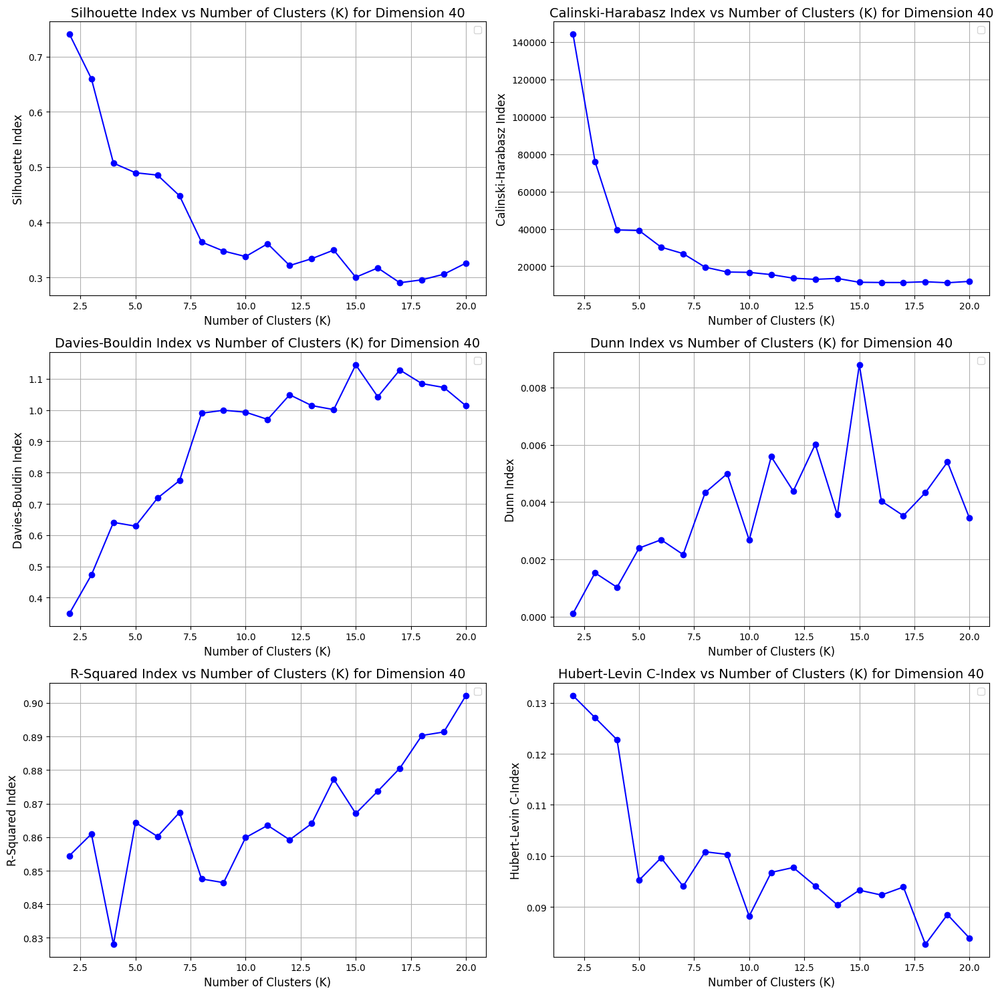

In [ ]:
import matplotlib.pyplot as plt

# Load the ranked clustering evaluation results from the CSV file
csv_file_path = '/content/drive/MyDrive/Masters Dataset/DCEC/ranked_clustering_metrics_table.csv'
ranked_df = pd.read_csv(csv_file_path)

# List of metrics for plotting
metrics = ['Silhouette Index', 'Calinski-Harabasz Index', 'Davies-Bouldin Index', 'Dunn Index', 'R-Squared Index', 'Hubert-Levin C-Index']

# Unique dimensions
dimensions = ranked_df['Dimension'].unique()

# Loop through each dimension and plot the metrics
for dim in dimensions:
    # Filter the data for the current dimension
    current_df = ranked_df[ranked_df['Dimension'] == dim]

    # Plot all metrics in a single grid layout for the current dimension
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))  # 3 rows and 2 columns for 6 metrics

    # Flatten the axes for easier iteration
    axs = axs.flatten()

    # Plot each metric in a grid
    for i, metric in enumerate(metrics):
        axs[i].plot(current_df['Cluster'], current_df[metric], marker='o', linestyle='-', color='b')

        # If there is an elbow method optimal cluster value for the current dimension, you can highlight it
        optimal_k = 27  # Replace this with your own logic to determine optimal_k if it changes per dimension
        if optimal_k in current_df['Cluster'].values:
            axs[i].axvline(x=optimal_k, color='r', linestyle='--', label='Elbow Method Optimal Cluster')
            axs[i].scatter(optimal_k, current_df[current_df['Cluster'] == optimal_k][metric].values[0], color='red', s=100, zorder=5)

        axs[i].set_title(f'{metric} vs Number of Clusters (K) for Dimension {dim}', fontsize=14)
        axs[i].set_xlabel('Number of Clusters (K)', fontsize=12)
        axs[i].set_ylabel(metric, fontsize=12)
        axs[i].grid(True)

        # Add the legend to each subplot
        axs[i].legend()

    # Adjust layout to ensure everything fits
    plt.tight_layout()
    plt.show()


##Get Decoder

In [ ]:
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input, Dense, Conv2DTranspose, Reshape, LeakyReLU
from tensorflow.keras.utils import custom_object_scope
import os
import numpy as np
import tensorflow.keras.backend as K

# Define ClusteringLayer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(name='clusters', shape=(self.n_clusters, input_dim), initializer='glorot_uniform')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q
'''
# Define the custom loss layer
@tf.keras.utils.register_keras_serializable()  # Registering the custom layer for model saving and loading
class CustomLossLayer(Layer):
    def call(self, inputs):
        train_z, train_xr, train_x = inputs
        loss_mmd = self.compute_mmd(train_z, train_z)
        loss_nll = K.mean(K.square(train_xr - train_x))
        self.add_loss(loss_mmd + loss_nll)
        return train_xr

    def compute_mmd(self, x, y):
        x_size = K.shape(x)[0]
        y_size = K.shape(y)[0]
        dim = K.shape(x)[1]
        tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))
'''
# Define the custom function
@tf.keras.utils.register_keras_serializable()  # Registering the custom function for model saving and loading
def compute_latent(x):
    mu, sigma = x
    batch = K.shape(mu)[0]
    dim = K.int_shape(mu)[1]
    eps = K.random_normal(shape=(batch, dim), mean=0., stddev=1.)
    return mu + K.exp(sigma) * eps


# Decoder architecture definition
def build_decoder(z_dim, raw_shape):
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu')(decoder_input)
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(filters=128, kernel_size=4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(filters=64, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv1)
    de_conv3 = Conv2DTranspose(filters=32, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv2)
    decoder_output = Conv2DTranspose(filters=1, kernel_size=4, strides=2, activation='sigmoid', padding='same')(de_conv2)

    decoder = Model(decoder_input, decoder_output, name='decoder')
    return decoder

# Iterate over dimensions and k values to save decoders
dimensions = [40]  # Latent space dimensions
K_values = range(2, 21)  # Cluster values
raw_shape = dataNormReshape  # Input shape (replace with your raw input dimensions)

base_model_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'

for z_dim in dimensions:
    for k in K_values:
        model_file_path1 = f'{base_model_dir}/DCEC_zdim_{z_dim}_nclusters_{k}.h5'
        decoder_save_path = f'{base_model_dir}/DECODER_zdim_{z_dim}_nclusters_{k}.h5'

        if os.path.exists(model_file_path1):
            print(f"Processing model: dim={z_dim}, k={k}")

            # Load the saved model
            with custom_object_scope({'ClusteringLayer': ClusteringLayer, 'compute_latent': compute_latent}):
                dcec_load_model = load_model(model_file_path1, compile=False)

            # Build the decoder
            decoder = build_decoder(z_dim, raw_shape)

            # Load the weights into the decoder
            for layer in decoder.layers:
                try:
                    layer.set_weights(dcec_load_model.get_layer(layer.name).get_weights())
                except ValueError:
                    pass

            # Save the decoder
            decoder.save(decoder_save_path)
            print(f"Saved decoder for z_dim={z_dim}, k={k} at {decoder_save_path}")
        else:
            print(f"Model file not found: {model_file_path1}")


Processing model: dim=40, k=2


ValueError: Unknown layer: 'Custom>CustomLossLayer'. Please ensure you are using a `keras.utils.custom_object_scope` and that this object is included in the scope. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

##Generate topographic maps

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Layer, InputSpec
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import custom_object_scope
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.measure import block_reduce
import mne

# Define ClusteringLayer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(name='clusters', shape=(self.n_clusters, input_dim), initializer='glorot_uniform')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
        return q

# Define the custom loss layer
@tf.keras.utils.register_keras_serializable()  # Registering the custom layer for model saving and loading
class CustomLossLayer(Layer):
    def call(self, inputs):
        train_z, train_xr, train_x = inputs
        loss_mmd = self.compute_mmd(train_z, train_z)
        loss_nll = K.mean(K.square(train_xr - train_x))
        self.add_loss(loss_mmd + loss_nll)
        return train_xr

    def compute_mmd(self, x, y):
        x_size = K.shape(x)[0]
        y_size = K.shape(y)[0]
        dim = K.shape(x)[1]
        tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
        tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
        return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

# Define the custom function
@tf.keras.utils.register_keras_serializable()  # Registering the custom function for model saving and loading
def compute_latent(x):
    mu, sigma = x
    batch = K.shape(mu)[0]
    dim = K.int_shape(mu)[1]
    eps = K.random_normal(shape=(batch, dim), mean=0., stddev=1.)
    return mu + K.exp(sigma) * eps

# Set up directories
base_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
output_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
os.makedirs(output_dir, exist_ok=True)

# Define parameters
dimensions = [40]  # Latent space dimensions
K_values = range(2, 21)  # Number of clusters
n_channels = 32  # EEG channels
batch_size = 20  # Batch size for processing clusters

# Set up MNE montage and info for EEG plotting
montage = mne.channels.make_standard_montage('biosemi32')  # Standard EEG montage
sfreq = 128  # Sampling frequency
ch_names = montage.ch_names[:n_channels]
ch_pos = montage.get_positions()['ch_pos']
info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types='eeg')
info.set_montage(montage)

# Define global min and max values
GLOBAL_MIN = -0.00020293263910059028
GLOBAL_MAX = 0.0005466895437634965

combined_dir = os.path.join(output_dir, "combined_maps")
os.makedirs(combined_dir, exist_ok=True)

# Loop through each model (z_dim, k)
for z_dim in dimensions:
    for k in K_values:
        model_name = f'DCEC_zdim_{z_dim}_nclusters_{k}'

        # Paths for saved data
        decoder_path = os.path.join(base_dir, f'DECODER_zdim_{z_dim}_nclusters_{k}.h5')  # Decoder model file
        centroids_path = os.path.join(base_dir, f'DCEC_zdim_{z_dim}_nclusters_{k}_cluster_centroids.npy')  # Adjust as needed

        # Check if all required files exist
        if not (os.path.exists(decoder_path) and os.path.exists(centroids_path)):
            print(f"Missing files for z_dim={z_dim}, k={k}. Skipping...")
            continue

        print(f"Processing z_dim={z_dim}, k={k}...")

        # Load decoder, latent space, and centroids
        with custom_object_scope({'ClusteringLayer': ClusteringLayer, 'CustomLossLayer': CustomLossLayer}):
            decoder = load_model(decoder_path, compile=False)
        cluster_centroids = np.load(centroids_path)

        # Generate topographic maps for centroids
        topographic_maps_centroids = decoder.predict(cluster_centroids)

        # Create a figure with subplots for each cluster
        # Create a figure with subplots for each cluster
        fig, axes = plt.subplots(1, k, figsize=(k * 3, 3))  # Adjust figure size dynamically based on k
        fig.suptitle(f"Topographic Maps for z_dim={z_dim}, k={k}", fontsize=16)

        # Adjust the spacing between subplots
        plt.subplots_adjust(wspace=0.5, hspace=0.5)

        for cluster_idx, output_matrix in enumerate(topographic_maps_centroids):
            # Flatten and process the matrix
            flattened_map = output_matrix.flatten()
            if flattened_map.size != n_channels:
                flattened_map = block_reduce(flattened_map, block_size=(int(flattened_map.size // n_channels),), func=np.mean)

            rescaled_map = (flattened_map - flattened_map.min()) / (flattened_map.max() - flattened_map.min() + 1e-10)
            data_for_mne = rescaled_map[:n_channels]
            data_for_mne = np.expand_dims(data_for_mne, axis=1)  # Add the time dimension
            evoked = mne.EvokedArray(data_for_mne, info)

            # Call plot_topomap and assign the result to im_map
            im_map, _ = mne.viz.plot_topomap(  # Assign the result to im_map
                data_for_mne.flatten(),
                pos=evoked.info,
                axes=axes[cluster_idx],
                show=False,
                cmap="jet",
            )
            axes[cluster_idx].set_title(f"Map {cluster_idx + 1}", fontsize=10)

        cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])  # Add shared colorbar
        cbar = fig.colorbar(im_map, cax=cbar_ax)
        cbar.set_label("Value", fontsize=12)
        cbar.set_ticks([0, 0.5, 1])
        cbar.set_ticklabels([f"{GLOBAL_MIN:.8f}", f"{(GLOBAL_MIN + GLOBAL_MAX) / 2:.8f}", f"{GLOBAL_MAX:.8f}"])

        # Save the figure for later combination
        image_path = os.path.join(combined_dir, f"z_dim_{z_dim}_k_{k}.png")
        plt.savefig(image_path)
        plt.close(fig)  # Close the figure to save memory



Processing z_dim=40, k=2...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Processing z_dim=40, k=3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
Processing z_dim=40, k=4...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
Processing z_dim=40, k=5...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
Processing z_dim=40, k=6...


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
Processing z_dim=40, k=7...


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
Processing z_dim=40, k=8...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
Processing z_dim=40, k=9...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
Processing z_dim=40, k=10...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
Processing z_dim=40, k=11...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
Processing z_dim=40, k=12...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
Processing z_dim=40, k=13...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
Processing z_dim=40, k=14...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
Processing z_dim=40, k=15...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step
Processing z_dim=40, k=16...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
Processing z_dim=40, k=17...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
Processing z_dim=40, k=18...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
Processing z_dim=40, k=19...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
Processing z_dim=40, k=20...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


In [ ]:
from PIL import Image
import os

# Directory where the individual images are saved
combined_dir = "/content/drive/MyDrive/Masters Dataset/DCEC/combined_maps"  # Replace with your actual directory
output_image_path = "/content/drive/MyDrive/Masters Dataset/DCEC/final_combined_topographic_maps.png"

# Get the list of image files sorted by k (ascending order)
image_files = sorted(
    [os.path.join(combined_dir, f) for f in os.listdir(combined_dir) if f.endswith(".png")],
    key=lambda x: int(x.split("_k_")[1].split(".png")[0])  # Extract k from filenames
)

# Open all images
images = [Image.open(img) for img in image_files]

# Determine the dimensions for consistent image size (based on k=20)
max_width = max(img.width for img in images)
max_height = max(img.height for img in images)

# Resize all images to the max dimensions while keeping aspect ratio
standardized_images = []
for img in images:
    img_aspect = img.width / img.height
    max_aspect = max_width / max_height

    # Adjust dimensions to maintain aspect ratio
    if img_aspect > max_aspect:
        new_width = max_width
        new_height = int(max_width / img_aspect)
    else:
        new_height = max_height
        new_width = int(max_height * img_aspect)

    # Resize the image
    resized_img = img.resize((new_width, new_height), Image.Resampling.LANCZOS)

    # Add padding to match max dimensions
    padded_img = Image.new("RGB", (max_width, max_height), (255, 255, 255))  # White background
    padded_img.paste(resized_img, ((max_width - new_width) // 2, (max_height - new_height) // 2))
    standardized_images.append(padded_img)

# Calculate the total height for vertical stacking
total_height = sum(img.height for img in standardized_images)

# Create a blank image with the total width and height
combined_image = Image.new("RGB", (max_width, total_height))

# Paste each image into the combined image
y_offset = 0
for img in standardized_images:
    combined_image.paste(img, (0, y_offset))
    y_offset += img.height

# Save the final combined image
combined_image.save(output_image_path)
print(f"Final combined image saved at {output_image_path}")

Final combined image saved at /content/drive/MyDrive/Masters Dataset/DCEC/final_combined_topographic_maps.png


In [ ]:
# Loop through each model (z_dim, k)
for z_dim in dimensions:
    for k in K_values:
        model_name = f'DCEC_zdim_{z_dim}_nclusters_{k}'

        # Paths for saved data
        decoder_path = os.path.join(base_dir, f'DECODER_zdim_{z_dim}_nclusters_{k}.h5')  # Decoder model file
        centroids_path = os.path.join(base_dir, f'{model_name}_cluster_centroids.npy')

        # Check if files exist
        if not (os.path.exists(decoder_path) and os.path.exists(centroids_path)):
            print(f"Missing files for z_dim={z_dim}, k={k}. Skipping...")
            continue

        print(f"Processing z_dim={z_dim}, k={k}...")

        # Load decoder and centroids
        with custom_object_scope({'ClusteringLayer': ClusteringLayer, 'CustomLossLayer': CustomLossLayer}):
            decoder = load_model(decoder_path, compile=False)
        cluster_centroids = np.load(centroids_path)

        # Run centroids through the decoder
        decoded_outputs = decoder.predict(cluster_centroids)

        # Print the decoder outputs
        print(f"Decoder outputs for z_dim={z_dim}, k={k}:")
        print(decoded_outputs)

        # Save the outputs to a file for inspection
        output_path = os.path.join(output_dir, f"decoder_outputs_zdim_{z_dim}_k_{k}.npy")
        np.save(output_path, decoded_outputs)
        print(f"Decoder outputs saved to: {output_path}")


Streaming output truncated to the last 5000 lines.
   [0.49984735]
   [0.5000589 ]
   [0.49990156]]

  ...

  [[0.500042  ]
   [0.5000509 ]
   [0.4998516 ]
   ...
   [0.50030947]
   [0.5000769 ]
   [0.50005454]]

  [[0.500172  ]
   [0.4999783 ]
   [0.5001652 ]
   ...
   [0.4997427 ]
   [0.5000165 ]
   [0.49991086]]

  [[0.50000846]
   [0.4998047 ]
   [0.4999392 ]
   ...
   [0.50009006]
   [0.4999954 ]
   [0.5000592 ]]]


 [[[0.5001533 ]
   [0.49980065]
   [0.49974823]
   ...
   [0.49978307]
   [0.5001339 ]
   [0.4998727 ]]

  [[0.49990216]
   [0.4999773 ]
   [0.49956754]
   ...
   [0.49974132]
   [0.49972692]
   [0.5001411 ]]

  [[0.5001817 ]
   [0.500102  ]
   [0.5001792 ]
   ...
   [0.49935222]
   [0.50004935]
   [0.50007623]]

  ...

  [[0.5001303 ]
   [0.5002236 ]
   [0.50064033]
   ...
   [0.5001343 ]
   [0.49971893]
   [0.50005823]]

  [[0.5003379 ]
   [0.49974918]
   [0.5005635 ]
   ...
   [0.50011206]
   [0.50016814]
   [0.4998147 ]]

  [[0.49996805]
   [0.500077  ]
   [0.49988

In [ ]:
for cluster_idx, output_matrix in enumerate(topographic_maps_centroids):
    # Flatten and reduce the matrix to 32 values (for 32 EEG channels)
    flattened_map = output_matrix.flatten()
    if flattened_map.size != n_channels:
        flattened_map = block_reduce(flattened_map, block_size=(int(flattened_map.size // n_channels),), func=np.mean)

    # Normalize to global min-max
    rescaled_map = (flattened_map - GLOBAL_MIN) / (GLOBAL_MAX - GLOBAL_MIN + 1e-10)

    # Print debug information
    print(f"Cluster {cluster_idx + 1} - Rescaled map values:")
    print(rescaled_map)
    print(f"Cluster {cluster_idx + 1} - Min: {rescaled_map.min()}, Max: {rescaled_map.max()}")

    # Prepare the data for MNE
    data_for_mne = rescaled_map[:n_channels]
    data_for_mne = np.expand_dims(data_for_mne, axis=1)  # Add the time dimension

    # Create an EvokedArray for plotting
    evoked = mne.EvokedArray(data_for_mne, info)

    # Plot topographic map in the current subplot
    mne.viz.plot_topomap(data_for_mne.flatten(), pos=evoked.info, axes=axes[cluster_idx], show=False, cmap='jet')
    axes[cluster_idx].set_title(f"Cluster {cluster_idx + 1}")


Cluster 1 - Rescaled map values:
[667.20844 667.07007 667.1441  667.26416 666.95044 667.2462  667.06213
 667.0115  667.1623  667.2217  666.9705  667.2072  667.183   667.00757
 667.22577 667.2357  667.14777 667.0611  667.21155 667.0296  666.95135
 667.3396  667.11395 666.90576 667.4183  667.2647  666.9496  667.30615
 667.22003 667.1469  667.3918  667.251  ]
Cluster 1 - Min: 666.90576171875, Max: 667.4182739257812
Cluster 2 - Rescaled map values:
[667.2332  667.17694 667.1804  667.2777  667.0925  667.1713  667.2364
 667.1016  667.25775 667.30457 667.15015 667.2817  667.24725 667.1286
 667.25946 667.22656 667.23004 667.1868  667.23047 667.22656 667.17554
 667.30115 667.1919  667.13275 667.3411  667.22455 667.15753 667.27026
 667.2576  667.22925 667.28326 667.28125]
Cluster 2 - Min: 667.092529296875, Max: 667.3411254882812
Cluster 3 - Rescaled map values:
[667.2342  667.2009  667.2166  667.3049  667.1657  667.2446  667.2281
 667.1348  667.2768  667.2796  667.14984 667.27124 667.24786 667.2

In [ ]:
print(f"Cluster {cluster_idx + 1} - Rescaled map (forced global range):")
print(rescaled_map)
print(f"Cluster {cluster_idx + 1} - Min: {rescaled_map.min()}, Max: {rescaled_map.max()}")


Cluster 9 - Rescaled map (forced global range):
[0.41890427 0.2713211  0.2875402  0.79269576 0.19548866 0.45542413
 0.7967774  0.1276047  0.7278193  0.5020407  0.25155738 0.609452
 0.31578937 0.7828139  0.46960244 0.20042959 0.7830288  0.3037593
 0.3121374  0.9999997  0.05145004 0.6867882  0.6214821  0.
 0.62534887 0.5168634  0.33340484 0.64683115 0.3035445  0.6272823
 0.64704597 0.48421037]
Cluster 9 - Min: 0.0, Max: 0.9999997019767761


#topo map test

In [ ]:
for cluster_idx, output_matrix in enumerate(topographic_maps_centroids):
    # Assume the decoder output is already in a usable format for topographic visualization
    data_for_mne = np.array(output_matrix[:n_channels])[:n_channels]  # First 32 channels
    data_for_mne = np.expand_dims(data_for_mne, axis=1)  # Add the time dimension

    # Plot the topographic map directly
    evoked = mne.EvokedArray(data_for_mne, info)
    fig, ax = plt.subplots(figsize=(6, 6))
    mne.viz.plot_topomap(data_for_mne.flatten(), pos=evoked.info, axes=ax, show=False, cmap="jet")
    plt.title(f"Cluster {cluster_idx + 1}")
    plt.show()


ValueError: Data must be a 2D array of shape (n_channels, n_samples), got shape (32, 1, 40, 1)

## Attempt 2


In [ ]:
# Install necessary packages (if any missing)
# !pip install tensorflow scikit-learn matplotlib

# Import necessary libraries
from time import time
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Dense, Conv2D, Conv2DTranspose, Flatten, Reshape, Lambda, Layer
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import CSVLogger
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, normalized_mutual_info_score, adjusted_rand_score
from sklearn.cluster import KMeans
from scipy import stats
import os


save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'
base_save_dir = '/content/drive/MyDrive/Masters Dataset/DCEC'


# Load and preprocess your data
# Replace 'listOfTopographicMapsForAE' with your actual data
raw = listOfTopographicMapsForAE  # Your data variable here

# Normalize the data
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

# Split the data
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15
data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - train_ratio), random_state=42, shuffle=True)
data_val, data_test = train_test_split(data_remaining, test_size=test_ratio / (test_ratio + val_ratio), random_state=42, shuffle=True)

# Remove outliers from training data
data_train_flat = data_train.reshape(data_train.shape[0], -1)
z_scores = np.abs(stats.zscore(data_train_flat, axis=0))
threshold = 3
outliers = np.where(z_scores > threshold)
filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
data_train_filtered = data_train[filtered_indices]

# Use filtered training data
x = data_train_filtered
y = None  # If labels are not available

# Define MMD Functions
def compute_kernel(x, y):
    x_size = tf.shape(x)[0]
    y_size = tf.shape(y)[0]
    dim = tf.shape(x)[1]
    tiled_x = tf.tile(tf.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
    tiled_y = tf.tile(tf.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
    return tf.exp(-tf.reduce_mean(tf.square(tiled_x - tiled_y), axis=2) / tf.cast(dim, 'float32'))

def compute_mmd(x, y):
    x_kernel = compute_kernel(x, x)
    y_kernel = compute_kernel(y, y)
    xy_kernel = compute_kernel(x, y)
    return tf.reduce_mean(x_kernel) + tf.reduce_mean(y_kernel) - 2 * tf.reduce_mean(xy_kernel)

# Define Custom Loss Layer
@tf.keras.utils.register_keras_serializable()
class CustomLossLayer(tf.keras.layers.Layer):
    def call(self, inputs):
        z, x_reconstructed, x_input = inputs
        # Sample from the prior distribution
        prior_z = tf.random.normal(tf.shape(z))
        # Compute MMD between z and prior_z
        loss_mmd = compute_mmd(z, prior_z)
        loss_nll = tf.reduce_mean(tf.square(x_reconstructed - x_input))
        self.add_loss(loss_mmd + loss_nll)
        return x_reconstructed

    def compute_output_shape(self, input_shape):
        return input_shape[1]

# Define the VAE Model
def create_conv_variational_autoencoder(input_shape, latent_dim):
    # Encoder
    inputs = Input(shape=input_shape)
    x = Conv2D(32, 3, activation='relu', padding='same')(inputs)
    x = Conv2D(64, 3, activation='relu', padding='same')(x)
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)

    # Mean and log variance for the latent space
    mu = Dense(latent_dim, name='mu')(x)
    log_sigma = Dense(latent_dim, name='log_sigma')(x)

    # Sampling function
    def sampling(args):
        mu, log_sigma = args
        epsilon = K.random_normal(shape=K.shape(mu), mean=0., stddev=1.)
        return mu + K.exp(log_sigma / 2) * epsilon

    # Latent space
    z = Lambda(sampling, output_shape=(latent_dim,), name='z')([mu, log_sigma])

    # Decoder
    x = Dense(128, activation='relu')(z)
    x = Dense(np.prod(input_shape), activation='relu')(x)
    x = Reshape(input_shape)(x)
    x = Conv2DTranspose(64, 3, activation='relu', padding='same')(x)
    x = Conv2DTranspose(32, 3, activation='relu', padding='same')(x)
    outputs = Conv2DTranspose(input_shape[2], 3, activation='sigmoid', padding='same', name='decoder_output')(x)

    # Define the VAE model
    vae = Model(inputs, outputs, name='vae')
    # Define the encoder model to output mu, log_sigma, and z
    encoder = Model(inputs, [mu, log_sigma, z], name='encoder')

    return vae, encoder

# Define Clustering Layer
class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights

    def build(self, input_shape):
        input_dim = input_shape[1]
        self.clusters = self.add_weight(shape=(self.n_clusters, input_dim),
                                        initializer='glorot_uniform',
                                        name='clusters')
        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        super(ClusteringLayer, self).build(input_shape)

    def call(self, inputs):
        q = 1.0 / (1.0 + (tf.reduce_sum(tf.square(tf.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = q / tf.reduce_sum(q, axis=1, keepdims=True)
        return q

    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.n_clusters)

# Define DCEC Class
class DCEC(object):
    def __init__(self, input_shape, latent_dim, n_clusters=10, alpha=1.0):
        super(DCEC, self).__init__()

        self.n_clusters = n_clusters
        self.input_shape = input_shape
        self.alpha = alpha
        self.latent_dim = latent_dim
        self.pretrained = False
        self.y_pred = []

        # Initialize the convolutional variational autoencoder (CVAE)
        self.vae, self.encoder = create_conv_variational_autoencoder(input_shape, latent_dim)

        # Get the latent space 'z' from the encoder
        inputs = self.vae.input
        mu, log_sigma, z = self.encoder(inputs)

        # Clustering layer on top of the latent space 'z'
        clustering_layer = ClusteringLayer(self.n_clusters, name='clustering')(z)

        # Custom loss layer
        custom_loss_layer = CustomLossLayer(name='custom_loss')([z, self.vae.output, self.vae.input])

        # Define the model with inputs and outputs
        self.model = Model(inputs=inputs,outputs=[clustering_layer, custom_loss_layer])

        # Define the pretraining model (used during pretraining)
        self.pretrain_model = Model(inputs=inputs, outputs=custom_loss_layer)

    def pretrain(self, x, batch_size=256, epochs=200, optimizer='adam', save_dir='results/temp'):
        print('...Pretraining...')
        self.pretrain_model.compile(optimizer=optimizer)
        csv_logger = CSVLogger(os.path.join(save_dir, 'pretrain_log.csv'))

        # Begin pretraining
        t0 = time()
        self.pretrain_model.fit(x, x, batch_size=batch_size, epochs=epochs, callbacks=[csv_logger])
        print('Pretraining time: ', time() - t0)

        # Save the pretrained weights
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        self.pretrain_model.save_weights(os.path.join(save_dir, 'pretrain_model_weights.weights.h5'))
        print('Pretrained weights are saved to %s/pretrain_vae_weights.h5' % save_dir)
        self.pretrained = True


    def target_distribution(self, q):
        weight = q ** 2 / tf.reduce_sum(q, axis=0)
        return tf.transpose(tf.transpose(weight) / tf.reduce_sum(weight, axis=1))

    def compile(self, optimizer='adam'):
        self.model.compile(optimizer=optimizer, loss=['kld', None], loss_weights=[1, 0])

    def fit(self, x, y=None, batch_size=256, maxiter=200, tol=1e-3,
        update_interval=140, save_dir='./results/temp', vae_weights=None):
        print('Update interval', update_interval)
        save_interval = x.shape[0] // batch_size * 5
        print('Save interval', save_interval)

        # Step 1: Pretrain the VAE if necessary
        if not self.pretrained and vae_weights is None:
            print('...Pretraining VAE using default hyper-parameters:')
            print('   optimizer=\'adam\';   epochs=200')
            self.pretrain(x, batch_size=batch_size, save_dir=save_dir)
            self.pretrained = True
        elif vae_weights is not None:
            self.vae.load_weights(vae_weights)
            print('VAE weights loaded successfully.')

        # Initialize cluster centers using k-means
        t1 = time()
        print('Initializing cluster centers with k-means.')
        z = self.encoder.predict(x)[2]  # Get 'z' from encoder outputs
        kmeans = KMeans(n_clusters=self.n_clusters, n_init=20)
        y_pred = kmeans.fit_predict(z)
        y_pred_last = np.copy(y_pred)
        self.model.get_layer(name='clustering').set_weights([kmeans.cluster_centers_])

        # Step 3: deep clustering
        # logging file
        import csv, os
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        logfile = open(save_dir + '/dcec_log.csv', 'w')
        logwriter = csv.DictWriter(logfile, fieldnames=['iter', 'acc', 'nmi', 'ari', 'L', 'Lc', 'Lr'])
        logwriter.writeheader()

        t2 = time()
        loss = [0, 0, 0]

        # Prepare to save history
        self.history = {'iter': [], 'loss': []}

        index = 0
        for ite in range(int(maxiter)):
            if ite % update_interval == 0:
                q, _ = self.model.predict(x, verbose=0)
                p = self.target_distribution(q)  # Update the auxiliary target distribution p

                # Evaluate the clustering performance if ground truth is available
                self.y_pred = q.argmax(1)
                if y is not None:
                    acc = np.round(metrics.acc(y, self.y_pred), 5)
                    nmi = np.round(metrics.nmi(y, self.y_pred), 5)
                    ari = np.round(metrics.ari(y, self.y_pred), 5)
                    print('Iter', ite, ': Acc', acc, ', nmi', nmi, ', ari', ari)

                # Check stop criterion
                delta_label = np.sum(self.y_pred != y_pred_last).astype(np.float32) / self.y_pred.shape[0]
                y_pred_last = np.copy(self.y_pred)
                if ite > 0 and delta_label < tol:
                    print('delta_label ', delta_label, '< tol ', tol)
                    print('Reached tolerance threshold. Stopping training.')
                    break

                # Record history
                # Evaluate the model loss on the entire dataset
                dummy_target = tf.zeros(shape=(x.shape[0], *self.input_shape), dtype=x.dtype)
                loss = self.model.evaluate(x=x, y=[p, dummy_target], verbose=0)
                self.history['iter'].append(ite)
                self.history['loss'].append(loss)

            # Train on batch
            if (index + 1) * batch_size > x.shape[0]:
                idx = np.arange(index * batch_size, x.shape[0])
                loss = self.model.train_on_batch(x=x[idx], y=[p[idx], None])
                index = 0
            else:
                idx = np.arange(index * batch_size, (index + 1) * batch_size)
                loss = self.model.train_on_batch(x=x[idx], y=[p[idx], None])
                index += 1

            # Save intermediate model
            if ite % save_interval == 0:
                # Save model weights
                model_path = os.path.join(save_dir, f'dcec_model_{ite}.h5')
                self.model.save_weights(model_path)
                print(f'Saved model weights at iteration {ite} to {model_path}')

    def predict(self, x):
        q, _ = self.model.predict(x, verbose=0)
        return q.argmax(1)


# Create the base directory if it doesn't exist
if not os.path.exists(base_save_dir):
    os.makedirs(base_save_dir)

# Define dimensions and cluster numbers to iterate over
dimensions = [25, 30, 35, 40]
K_values = range(3, 21)

for latent_dim in dimensions:
    for n_clusters in K_values:
        print(f'Training model with latent_dim={latent_dim}, n_clusters={n_clusters}')

        # Initialize the DCEC model with current parameters
        dcec = DCEC(input_shape=x.shape[1:], latent_dim=latent_dim, n_clusters=n_clusters)

        # Compile the model
        dcec.compile(optimizer='adam')

        # Define save directory
        save_dir = os.path.join(base_save_dir, f'dim_{latent_dim}_clusters_{n_clusters}')

        # Create the directory if it doesn't exist
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

        # Train the model
        dcec.fit(x, y=None, tol=0.001, maxiter=200,
                 update_interval=100,
                 save_dir=save_dir,
                  vae_weights=None)

        # Save the model and weights
        model_save_path = os.path.join(save_dir, 'dcec_model.h5')
        dcec.model.save(model_save_path)

        weights_save_path = os.path.join(save_dir, 'dcec_weights.h5')
        dcec.model.save_weights(weights_save_path)

        # Save cluster centroids
        cluster_centers = dcec.model.get_layer(name='clustering').get_weights()[0]
        centroids_save_path = os.path.join(save_dir, 'cluster_centroids.npy')
        np.save(centroids_save_path, cluster_centers)

        # Save training history
        history_save_path = os.path.join(save_dir, 'training_history.npy')
        np.save(history_save_path, dcec.history)

        print(f'Model, weights, centroids, and history saved to {save_dir}')


Training model with latent_dim=25, n_clusters=3
Update interval 140
Save interval 300
...Pretraining VAE using default hyper-parameters:
   optimizer='adam';   epochs=200
...Pretraining...
Epoch 1/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.0289
Epoch 2/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0016
Epoch 3/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0013
Epoch 4/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011
Epoch 5/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011
Epoch 6/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011
Epoch 7/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0011
Epoch 8/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0010
Epoch 9/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0010
Epoch 10/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 9.9070e-04
Epoch 11/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0010
Epoch 12/200
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0010

TypeError: Only integers, slices (`:`), ellipsis (`...`), tf.newaxis (`None`) and scalar tf.int32/tf.int64 tensors are valid indices, got array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181,
       182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194,
       195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207,
       208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220,
       221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233,
       234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246,
       247, 248, 249, 250, 251, 252, 253, 254, 255])

## Attempt 1

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import math, os
import tensorflow as tf
from tensorflow.keras.layers import ELU, PReLU, LeakyReLU
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Dense, Input, Reshape, Flatten, Lambda, Layer, InputSpec
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.cluster import KMeans
from scipy import stats
from sklearn.model_selection import train_test_split

dimension = [25, 30, 35, 40]
K_values = range(3, 21)  # K from 3 to 20 inclusive

# Load and preprocess your data (outside the loops to avoid redundancy)
raw = listOfTopographicMapsForAE  # Replace with your actual data
# Normalize the data
dataNorm = (raw - raw.min()) / (raw.max() - raw.min())
dataNormReshape = dataNorm.reshape(-1, raw.shape[1], raw.shape[2], 1)

# Split the data
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15
data_train, data_remaining = train_test_split(dataNormReshape, test_size=(1 - train_ratio), random_state=42, shuffle=True)
data_val, data_test = train_test_split(data_remaining, test_size=test_ratio / (test_ratio + val_ratio), random_state=42, shuffle=True)

# Remove outliers
data_train_flat = data_train.reshape(data_train.shape[0], -1)
z_scores = np.abs(stats.zscore(data_train_flat, axis=0))
threshold = 3
outliers = np.where(z_scores > threshold)
filtered_indices = [i for i in range(data_train.shape[0]) if i not in outliers[0]]
data_train_filtered = data_train[filtered_indices]

for z_dim in dimension:
    epoch = 200
    batch_size = 32

    # Design the encoder
    encoder_input = Input(shape=(raw.shape[1], raw.shape[2], 1))
    en_conv1 = Conv2D(filters=32, kernel_size=4, strides=2, padding='same')(encoder_input)
    en_conv1 = LeakyReLU(0.1)(en_conv1)

    en_conv2 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(en_conv1)
    en_conv2 = LeakyReLU(0.1)(en_conv2)

    en_conv3 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(en_conv2)
    en_conv3 = LeakyReLU(0.1)(en_conv3)

    en_conv4 = Conv2D(filters=256, kernel_size=4, strides=2, padding='same')(en_conv3)
    en_conv4 = LeakyReLU(0.1)(en_conv4)

    en_fc1 = Flatten()(en_conv3)
    mu = Dense(z_dim)(en_fc1)
    sigma = Dense(z_dim)(en_fc1)

    # Compute latent using mean and variance
    @tf.keras.utils.register_keras_serializable()
    def compute_latent(x):
        mu, sigma = x
        batch = K.shape(mu)[0]
        dim = K.int_shape(mu)[1]
        eps = K.random_normal(shape=(batch, z_dim), mean=0., stddev=1.)
        return mu + K.exp(sigma) * eps

    latent_space = Lambda(compute_latent)([mu, sigma])

    # Build the encoder
    encoder = Model(encoder_input, [mu, sigma, latent_space], name='encoder')
    encoder.summary()

    # Design the decoder
    decoder_input = Input(shape=(z_dim,))
    de_fc2 = Dense(en_conv3.shape[1] * en_conv3.shape[2] * en_conv3.shape[3], activation='relu')(decoder_input)
    de_fc2 = Reshape((en_conv3.shape[1], en_conv3.shape[2], en_conv3.shape[3]))(de_fc2)
    de_conv1 = Conv2DTranspose(filters=128, kernel_size=4, strides=2, activation='relu', padding='same')(de_fc2)
    de_conv2 = Conv2DTranspose(filters=64, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv1)
    de_conv3 = Conv2DTranspose(filters=32, kernel_size=4, strides=2, activation='relu', padding='same')(de_conv2)
    decoder_output = Conv2DTranspose(filters=1, kernel_size=4, strides=2, activation='sigmoid', padding='same')(de_conv2)

    decoder = Model(decoder_input, decoder_output, name='decoder')
    decoder.summary()

    # Build the autoencoder for pre-training
    train_z = encoder(encoder_input)[2]
    train_xr = decoder(train_z)
    autoencoder = Model(encoder_input, train_xr)
    autoencoder.summary()

    # Compile and pre-train the autoencoder
    autoencoder.compile(optimizer='adam', loss='mse')
    myCallBacks = EarlyStopping(monitor='loss', patience=10, mode='min')
    history = autoencoder.fit(
        data_train_filtered,
        data_train_filtered,
        epochs=epoch,
        batch_size=batch_size,
        validation_data=(data_val, data_val),
        callbacks=[myCallBacks]
    )

    # Save the encoder and decoder
    encoder.save(f'/content/drive/MyDrive/Masters Dataset/New Results/encoder_dim{z_dim}.h5')
    decoder.save(f'/content/drive/MyDrive/Masters Dataset/New Results/decoder_dim{z_dim}.h5')

    # Compute latent representations
    train_mu, train_sigma, train_z_values = encoder.predict(data_train_filtered)
    val_mu, val_sigma, val_z = encoder.predict(data_val)

    for n_clusters in K_values:
        print(f"Training with z_dim={z_dim}, n_clusters={n_clusters}")

        # Perform K-means clustering to initialize cluster centers
        kmeans = KMeans(n_clusters=n_clusters, n_init=20)
        y_pred = kmeans.fit_predict(train_z_values)
        cluster_centers = kmeans.cluster_centers_

        # Define the ClusteringLayer
        class ClusteringLayer(Layer):
            def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
                super(ClusteringLayer, self).__init__(**kwargs)
                self.n_clusters = n_clusters
                self.alpha = alpha
                self.initial_weights = weights
                self.input_spec = InputSpec(ndim=2)

            def build(self, input_shape):
                assert len(input_shape) == 2
                input_dim = input_shape[1]
                self.input_spec = InputSpec(dtype=K.floatx(), shape=(None, input_dim))
                self.clusters = self.add_weight(shape=(self.n_clusters, input_dim),
                                                initializer='glorot_uniform',
                                                name='clusters')
                if self.initial_weights is not None:
                    self.set_weights(self.initial_weights)
                    del self.initial_weights
                super(ClusteringLayer, self).build(input_shape)

            def call(self, inputs, **kwargs):
                # Compute the Student's t-distribution
                q = 1.0 / (1.0 + (K.sum(K.square(K.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
                q **= (self.alpha + 1.0) / 2.0
                q = K.transpose(K.transpose(q) / K.sum(q, axis=1))
                return q

            def compute_output_shape(self, input_shape):
                return (input_shape[0], self.n_clusters)

            def get_config(self):
                config = super(ClusteringLayer, self).get_config()
                config.update({
                    'n_clusters': self.n_clusters,
                    'alpha': self.alpha,
                })
                return config

            @classmethod
            def from_config(cls, config):
                return cls(**config)

        # Build the clustering layer
        #clustering_output = ClusteringLayer(n_clusters, weights=[cluster_centers], name='clustering')(train_z)

        # Define the target distribution function
        def target_distribution(q):
            weight = q ** 2 / K.sum(q, axis=0)
            return K.transpose(K.transpose(weight) / K.sum(weight, axis=1))

        ## MMD Functions
        def compute_kernel(x, y):
            x_size = K.shape(x)[0]
            y_size = K.shape(y)[0]
            dim = K.shape(x)[1]
            tiled_x = K.tile(K.reshape(x, [x_size, 1, dim]), [1, y_size, 1])
            tiled_y = K.tile(K.reshape(y, [1, y_size, dim]), [x_size, 1, 1])
            return K.exp(-K.mean(K.square(tiled_x - tiled_y), axis=2) / K.cast(dim, 'float32'))

        def compute_mmd(x, y):
            x_kernel = compute_kernel(x, x)
            y_kernel = compute_kernel(y, y)
            xy_kernel = compute_kernel(x, y)
            return K.mean(x_kernel) + K.mean(y_kernel) - 2 * K.mean(xy_kernel)

        # Modify the CustomLossLayer to include clustering loss
        @tf.keras.utils.register_keras_serializable()
        class CustomLossLayer(tf.keras.layers.Layer):
            def __init__(self, n_clusters, cluster_centers, **kwargs):
                super(CustomLossLayer, self).__init__(**kwargs)
                self.n_clusters = n_clusters
                self.cluster_centers = np.array(cluster_centers)
                self.clustering_layer = ClusteringLayer(n_clusters, weights=[cluster_centers], name='clustering')

            def call(self, inputs):
                train_z_input, train_xr_input, train_x_input = inputs
                loss_mmd = compute_mmd(train_z_input, train_z_input)
                loss_nll = K.mean(K.square(train_xr_input - train_x_input))
                # Compute clustering output
                q = self.clustering_layer(train_z_input)
                # Compute clustering loss
                p = target_distribution(q)
                loss_clustering = K.sum(p * K.log(p / (q + K.epsilon())), axis=-1)
                loss_clustering = K.mean(loss_clustering)
                self.add_loss(loss_mmd + loss_nll + 0.1 * loss_clustering)
                return train_xr_input

            def compute_output_shape(self, input_shape):
                return input_shape[1]  # Assuming train_xr is at index 1 in inputs

            def get_config(self):
                config = super(CustomLossLayer, self).get_config()
                config.update({
                    'n_clusters': self.n_clusters,
                    'cluster_centers': self.cluster_centers.tolist(),  # Convert to list for serialization
                })
                return config

            @classmethod
            def from_config(cls, config):
                # Convert cluster_centers back to NumPy array
                config['cluster_centers'] = np.array(config['cluster_centers'])
                return cls(**config)

        # Build the final model
        custom_loss_layer = CustomLossLayer(n_clusters=n_clusters, cluster_centers=cluster_centers, name='custom_loss_layer')
        outputs = custom_loss_layer([train_z, train_xr, encoder_input])
        dcec = Model(inputs=encoder_input, outputs=outputs)
        dcec.compile(optimizer='adam')
        dcec.summary()

        # Train the model
        history = dcec.fit(
            data_train_filtered,
            epochs=epoch,
            batch_size=batch_size,
            validation_data=(data_val, None),
            callbacks=[myCallBacks]
        )

        # Access the cluster centers
        custom_loss_layer_instance = dcec.get_layer('custom_loss_layer')
        clustering_layer = custom_loss_layer_instance.clustering_layer
        trained_cluster_centers = clustering_layer.get_weights()[0]
        # Save the cluster centers
        np.save(f'/content/drive/MyDrive/Masters Dataset/New Results/cluster_centers_dim{z_dim}_K{n_clusters}.npy', trained_cluster_centers)

        # Save the model
        dcec.save(f'/content/drive/MyDrive/Masters Dataset/New Results/dcec_dim{z_dim}_K{n_clusters}.h5')

        # Save the encoder and decoder after clustering training
        encoder.save(f'/content/drive/MyDrive/Masters Dataset/New Results/encoder_final_dim{z_dim}_K{n_clusters}.h5')
        decoder.save(f'/content/drive/MyDrive/Masters Dataset/New Results/decoder_final_dim{z_dim}_K{n_clusters}.h5')

        # Save the training history**
        history_df = pd.DataFrame(history.history)
        history_df.to_csv(f'/content/drive/MyDrive/Masters Dataset/New Results/dcec_dim{z_dim}_K{n_clusters}_history.csv', index=False)

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 20, 20, 32)     │            544 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyReLU) │ (None, 20, 20, 32)     │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 10, 10, 64)     │         32,832 │ leaky_re_lu_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_5 (LeakyReLU) │ (None, 10, 10, 64)     │              0 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 5, 5, 128)      │        131,200 │ leaky_re_lu_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_6 (LeakyReLU) │ (None, 5, 5, 128)      │              0 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 3200)           │              0 │ leaky_re_lu_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 15)             │         48,015 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 15)             │         48,015 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 15)             │              0 │ dense_3[0][0],         │
│                           │                        │                │ dense_4[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 260,606 (1017.99 KB)

 Trainable params: 260,606 (1017.99 KB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 15)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 3200)                │          51,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 5, 5, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 10, 10, 128)         │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_5 (Conv2DTranspose) │ (None, 20, 20, 64)          │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_7 (Conv2DTranspose) │ (None, 40, 40, 1)           │           1,025 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 445,633 (1.70 MB)

 Trainable params: 445,633 (1.70 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 15), (None, 15),    │         260,606 │
│                                      │ (None, 15)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         445,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 706,239 (2.69 MB)

 Trainable params: 706,239 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0053 - val_loss: 5.5953e-04
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5516e-04 - val_loss: 2.8876e-04
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.2491e-05 - val_loss: 2.1194e-04
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4792e-05 - val_loss: 1.8544e-04
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7731e-05 - val_loss: 1.8276e-04
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4017e-05 - val_loss: 1.6433e-04
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2707e-05 - val_loss: 1.5282e-04
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9922e-05 - val_loss: 1.4561e-04
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8904e-05 - val_loss: 1.3497e-04
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8065e-05 - val_loss: 1.2934e-04
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/ste

486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Training with z_dim=15, n_clusters=3


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             45 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,284 (2.69 MB)

 Trainable params: 706,284 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 8.7897e-05 - val_loss: 5.1152e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5125e-05 - val_loss: 4.7073e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1821e-05 - val_loss: 4.2545e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0185e-05 - val_loss: 4.1497e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.1429e-06 - val_loss: 4.0484e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.5388e-06 - val_loss: 3.9236e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.6859e-06 - val_loss: 3.8034e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.3657e-06 - val_loss: 3.7947e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.8707e-06 - val_loss: 3.7697e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.6545e-06 - val_loss: 3.9001e-05


Training with z_dim=15, n_clusters=4


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             60 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,299 (2.69 MB)

 Trainable params: 706,299 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 5.9881e-05 - val_loss: 4.9069e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7099e-05 - val_loss: 4.8836e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3814e-05 - val_loss: 4.5623e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1641e-05 - val_loss: 4.2865e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0357e-05 - val_loss: 4.1507e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.0066e-06 - val_loss: 4.0119e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.2012e-06 - val_loss: 3.9724e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.7524e-06 - val_loss: 3.7686e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.1503e-06 - val_loss: 3.8063e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.8433e-06 - val_loss: 3.5917e-05


Training with z_dim=15, n_clusters=5


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             75 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,314 (2.69 MB)

 Trainable params: 706,314 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 2.9362e-05 - val_loss: 3.8155e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0466e-05 - val_loss: 3.7331e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.3481e-06 - val_loss: 3.6576e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.9116e-06 - val_loss: 3.5740e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.4371e-06 - val_loss: 3.4630e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.2755e-06 - val_loss: 3.3620e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.0689e-06 - val_loss: 3.3246e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.9259e-06 - val_loss: 3.2713e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.8530e-06 - val_loss: 3.0530e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.5570e-06 - val_loss: 3.3165e-05


Training with z_dim=15, n_clusters=6


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             90 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,329 (2.69 MB)

 Trainable params: 706,329 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - loss: 3.8577e-05 - val_loss: 3.7009e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1490e-05 - val_loss: 3.3646e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.8494e-06 - val_loss: 3.3647e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.7307e-06 - val_loss: 3.3838e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.8413e-06 - val_loss: 3.3360e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.0895e-06 - val_loss: 3.3752e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.7628e-06 - val_loss: 3.5645e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.5803e-06 - val_loss: 2.9877e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.3536e-06 - val_loss: 2.8685e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.4940e-06 - val_loss: 2.8809e-05


Training with z_dim=15, n_clusters=7


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            105 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,344 (2.69 MB)

 Trainable params: 706,344 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.2186e-05 - val_loss: 3.1437e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.6687e-06 - val_loss: 2.8593e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.9833e-06 - val_loss: 2.8512e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.0511e-06 - val_loss: 2.8393e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.4066e-06 - val_loss: 2.8218e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1234e-06 - val_loss: 2.7490e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0769e-06 - val_loss: 2.6759e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1040e-06 - val_loss: 2.6005e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9470e-06 - val_loss: 2.5759e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9480e-06 - val_loss: 2.4750e-05


Training with z_dim=15, n_clusters=8


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            120 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,359 (2.69 MB)

 Trainable params: 706,359 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.0712e-05 - val_loss: 3.0620e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.9871e-06 - val_loss: 2.7121e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.6854e-06 - val_loss: 2.7290e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.7598e-06 - val_loss: 2.6733e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1887e-06 - val_loss: 2.6494e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9159e-06 - val_loss: 2.6239e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8188e-06 - val_loss: 2.5261e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7883e-06 - val_loss: 2.5446e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7886e-06 - val_loss: 2.4215e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5725e-06 - val_loss: 2.4170e-05


Training with z_dim=15, n_clusters=9


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            135 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,374 (2.69 MB)

 Trainable params: 706,374 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.6945e-05 - val_loss: 2.7810e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.9256e-06 - val_loss: 2.5828e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.8532e-06 - val_loss: 2.4558e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1832e-06 - val_loss: 2.4688e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8179e-06 - val_loss: 2.4537e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6722e-06 - val_loss: 2.3336e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6308e-06 - val_loss: 2.3086e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4822e-06 - val_loss: 2.3013e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4890e-06 - val_loss: 2.2229e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4108e-06 - val_loss: 2.2237e-05


Training with z_dim=15, n_clusters=10


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            150 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,389 (2.69 MB)

 Trainable params: 706,389 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.5539e-05 - val_loss: 2.4718e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.5635e-06 - val_loss: 2.4507e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.6354e-06 - val_loss: 2.4457e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.2734e-06 - val_loss: 2.3511e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6360e-06 - val_loss: 2.2916e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4697e-06 - val_loss: 2.2854e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4101e-06 - val_loss: 2.2183e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2712e-06 - val_loss: 2.2841e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2643e-06 - val_loss: 2.1014e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2205e-06 - val_loss: 2.0758e-05


Training with z_dim=15, n_clusters=11


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            165 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,404 (2.69 MB)

 Trainable params: 706,404 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - loss: 1.2057e-05 - val_loss: 2.2593e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.7589e-06 - val_loss: 2.2970e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0478e-06 - val_loss: 2.2430e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7671e-06 - val_loss: 2.2042e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4059e-06 - val_loss: 2.1326e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3042e-06 - val_loss: 2.0493e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1624e-06 - val_loss: 2.0881e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1360e-06 - val_loss: 2.0299e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0272e-06 - val_loss: 2.0400e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0676e-06 - val_loss: 2.1679e-05


Training with z_dim=15, n_clusters=12


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            180 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,419 (2.69 MB)

 Trainable params: 706,419 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.2460e-05 - val_loss: 2.2522e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.6666e-06 - val_loss: 2.2188e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0069e-06 - val_loss: 2.1464e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6981e-06 - val_loss: 2.2263e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3321e-06 - val_loss: 1.9952e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1955e-06 - val_loss: 2.0889e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1270e-06 - val_loss: 2.0269e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9230e-06 - val_loss: 1.9753e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9610e-06 - val_loss: 2.2501e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0677e-06 - val_loss: 1.8845e-05


Training with z_dim=15, n_clusters=13


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            195 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,434 (2.69 MB)

 Trainable params: 706,434 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.1000e-05 - val_loss: 2.0395e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0857e-06 - val_loss: 2.0766e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7838e-06 - val_loss: 1.9668e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4391e-06 - val_loss: 1.8998e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1261e-06 - val_loss: 1.8551e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0070e-06 - val_loss: 2.0522e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8717e-06 - val_loss: 1.9331e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8036e-06 - val_loss: 1.8903e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8205e-06 - val_loss: 1.9315e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8160e-06 - val_loss: 1.9207e-05
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3m

Training with z_dim=15, n_clusters=14


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            210 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,449 (2.69 MB)

 Trainable params: 706,449 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.0730e-04 - val_loss: 3.5445e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9330e-05 - val_loss: 3.4435e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5882e-05 - val_loss: 3.3866e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3640e-05 - val_loss: 3.0513e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2014e-05 - val_loss: 2.7377e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0702e-05 - val_loss: 2.6866e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.8423e-06 - val_loss: 2.5524e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.1693e-06 - val_loss: 2.6019e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.3975e-06 - val_loss: 2.3203e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.8874e-06 - val_loss: 2.2498e-05


Training with z_dim=15, n_clusters=15


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            225 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,464 (2.69 MB)

 Trainable params: 706,464 (2.69 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.0822e-05 - val_loss: 2.4852e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.0718e-06 - val_loss: 2.3082e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.3484e-06 - val_loss: 2.1392e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.9718e-06 - val_loss: 2.0555e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.6203e-06 - val_loss: 2.0114e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.2381e-06 - val_loss: 1.9886e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.0510e-06 - val_loss: 1.8786e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.9750e-06 - val_loss: 1.8934e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.7269e-06 - val_loss: 1.7419e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.5286e-06 - val_loss: 1.7583e-05


Training with z_dim=15, n_clusters=16


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            240 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,479 (2.70 MB)

 Trainable params: 706,479 (2.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.1509e-05 - val_loss: 1.9389e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.6128e-06 - val_loss: 1.9801e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.9314e-06 - val_loss: 1.9431e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.6971e-06 - val_loss: 1.9444e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.3417e-06 - val_loss: 1.7772e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.2093e-06 - val_loss: 1.7200e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0560e-06 - val_loss: 1.6674e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0340e-06 - val_loss: 1.5465e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8521e-06 - val_loss: 1.5515e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8657e-06 - val_loss: 1.6773e-05


Training with z_dim=15, n_clusters=17


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            255 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,494 (2.70 MB)

 Trainable params: 706,494 (2.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - loss: 1.0558e-05 - val_loss: 1.8129e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.9534e-06 - val_loss: 1.8481e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.4403e-06 - val_loss: 1.6814e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1128e-06 - val_loss: 1.6296e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8830e-06 - val_loss: 1.6722e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7652e-06 - val_loss: 1.5211e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6345e-06 - val_loss: 1.5209e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5817e-06 - val_loss: 1.4935e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4768e-06 - val_loss: 1.5078e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4499e-06 - val_loss: 1.4547e-05


Training with z_dim=15, n_clusters=18


Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            270 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,509 (2.70 MB)

 Trainable params: 706,509 (2.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 7.6228e-06 - val_loss: 1.5918e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.2082e-06 - val_loss: 1.6533e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8536e-06 - val_loss: 1.6763e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6365e-06 - val_loss: 1.6635e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6519e-06 - val_loss: 1.4961e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4107e-06 - val_loss: 1.4739e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3270e-06 - val_loss: 1.4325e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2708e-06 - val_loss: 1.4518e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2965e-06 - val_loss: 1.4371e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1697e-06 - val_loss: 1.3952e-05


Training with z_dim=15, n_clusters=19


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            285 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,524 (2.70 MB)

 Trainable params: 706,524 (2.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 7.5586e-06 - val_loss: 1.7321e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9044e-06 - val_loss: 1.5531e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5894e-06 - val_loss: 1.5158e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4436e-06 - val_loss: 1.5098e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3652e-06 - val_loss: 1.5227e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1922e-06 - val_loss: 1.3849e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1573e-06 - val_loss: 1.3125e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0988e-06 - val_loss: 1.3832e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0317e-06 - val_loss: 1.3009e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9478e-06 - val_loss: 1.3381e-05


Training with z_dim=15, n_clusters=20


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 15), (None,    │        260,606 │ input_layer_2[0][0]    │
│                           │ 15), (None, 15)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        445,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            300 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 706,539 (2.70 MB)

 Trainable params: 706,539 (2.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 6.8503e-06 - val_loss: 1.5760e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6251e-06 - val_loss: 1.4685e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3649e-06 - val_loss: 1.4523e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2455e-06 - val_loss: 1.4157e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1728e-06 - val_loss: 1.3985e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1092e-06 - val_loss: 1.3762e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9432e-06 - val_loss: 1.3171e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9093e-06 - val_loss: 1.3149e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9876e-06 - val_loss: 1.3234e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8810e-06 - val_loss: 1.3372e-05


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 20, 20, 32)     │            544 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_8 (LeakyReLU) │ (None, 20, 20, 32)     │              0 │ conv2d_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 10, 10, 64)     │         32,832 │ leaky_re_lu_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_9 (LeakyReLU) │ (None, 10, 10, 64)     │              0 │ conv2d_9[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)        │ (None, 5, 5, 128)      │        131,200 │ leaky_re_lu_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_10            │ (None, 5, 5, 128)      │              0 │ conv2d_10[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_2 (Flatten)       │ (None, 3200)           │              0 │ leaky_re_lu_10[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 20)             │         64,020 │ flatten_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 20)             │         64,020 │ flatten_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_2 (Lambda)         │ (None, 20)             │              0 │ dense_6[0][0],         │
│                           │                        │                │ dense_7[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 292,616 (1.12 MB)

 Trainable params: 292,616 (1.12 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 20)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 3200)                │          67,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_2 (Reshape)                  │ (None, 5, 5, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_8 (Conv2DTranspose) │ (None, 10, 10, 128)         │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_9 (Conv2DTranspose) │ (None, 20, 20, 64)          │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_11                  │ (None, 40, 40, 1)           │           1,025 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 461,633 (1.76 MB)

 Trainable params: 461,633 (1.76 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 20), (None, 20),    │         292,616 │
│                                      │ (None, 20)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         461,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 754,249 (2.88 MB)

 Trainable params: 754,249 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - loss: 0.0056 - val_loss: 4.7964e-04
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5329e-04 - val_loss: 2.5908e-04
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.2970e-05 - val_loss: 1.7972e-04
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0580e-05 - val_loss: 1.5800e-04
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1566e-05 - val_loss: 1.4263e-04
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5470e-05 - val_loss: 1.3147e-04
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3200e-05 - val_loss: 1.3259e-04
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0843e-05 - val_loss: 1.2466e-04
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1026e-05 - val_loss: 1.2255e-04
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0592e-05 - val_loss: 1.1348e-04
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/ste

486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Training with z_dim=20, n_clusters=3


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             60 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,309 (2.88 MB)

 Trainable params: 754,309 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 5.4413e-05 - val_loss: 4.8307e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.9689e-06 - val_loss: 4.7481e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.2701e-06 - val_loss: 4.5907e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.4617e-06 - val_loss: 4.6517e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0178e-06 - val_loss: 4.5638e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8631e-06 - val_loss: 4.5904e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4940e-06 - val_loss: 4.4839e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2264e-06 - val_loss: 4.4726e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1950e-06 - val_loss: 4.4369e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.7750e-06 - val_loss: 4.3365e-05


Training with z_dim=20, n_clusters=4


Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             80 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,329 (2.88 MB)

 Trainable params: 754,329 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 4.8733e-05 - val_loss: 4.7033e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.3043e-06 - val_loss: 4.9011e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.5399e-06 - val_loss: 4.5608e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.1882e-06 - val_loss: 4.8556e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.3923e-06 - val_loss: 4.6730e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8077e-06 - val_loss: 4.3703e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3544e-06 - val_loss: 4.4090e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0734e-06 - val_loss: 4.4740e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8844e-06 - val_loss: 4.3111e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5697e-06 - val_loss: 4.2102e-05


Training with z_dim=20, n_clusters=5


Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            100 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,349 (2.88 MB)

 Trainable params: 754,349 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 1.7997e-05 - val_loss: 4.4905e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.7675e-06 - val_loss: 4.3673e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6398e-06 - val_loss: 4.2943e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0384e-06 - val_loss: 4.2156e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6511e-06 - val_loss: 4.1916e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4050e-06 - val_loss: 4.0550e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4388e-06 - val_loss: 3.9073e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0547e-06 - val_loss: 3.8990e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0796e-06 - val_loss: 3.8243e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9110e-06 - val_loss: 3.7231e-05


Training with z_dim=20, n_clusters=6


Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            120 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,369 (2.88 MB)

 Trainable params: 754,369 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - loss: 1.4907e-05 - val_loss: 3.6396e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6986e-06 - val_loss: 3.5720e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8564e-06 - val_loss: 3.5476e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4176e-06 - val_loss: 3.3805e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3033e-06 - val_loss: 3.5606e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1215e-06 - val_loss: 3.3924e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9265e-06 - val_loss: 3.3127e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7845e-06 - val_loss: 3.2502e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8392e-06 - val_loss: 3.2343e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7029e-06 - val_loss: 3.1488e-05


Training with z_dim=20, n_clusters=7


Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            140 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,389 (2.88 MB)

 Trainable params: 754,389 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.4213e-05 - val_loss: 3.5782e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5392e-06 - val_loss: 3.4078e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6401e-06 - val_loss: 3.3128e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.2336e-06 - val_loss: 3.2110e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8815e-06 - val_loss: 3.1633e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8610e-06 - val_loss: 3.0378e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7013e-06 - val_loss: 3.0280e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6241e-06 - val_loss: 2.9330e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5299e-06 - val_loss: 3.0757e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4505e-06 - val_loss: 2.8901e-05


Training with z_dim=20, n_clusters=8


Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            160 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,409 (2.88 MB)

 Trainable params: 754,409 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.1279e-05 - val_loss: 3.3052e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0331e-06 - val_loss: 3.2565e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4177e-06 - val_loss: 3.1937e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9993e-06 - val_loss: 3.1409e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6731e-06 - val_loss: 2.8197e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6718e-06 - val_loss: 2.7543e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5003e-06 - val_loss: 2.8414e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4811e-06 - val_loss: 2.6415e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3371e-06 - val_loss: 2.4839e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3432e-06 - val_loss: 2.6534e-05
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3m

Training with z_dim=20, n_clusters=9


Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            180 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,429 (2.88 MB)

 Trainable params: 754,429 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.0233e-04 - val_loss: 2.8148e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1462e-05 - val_loss: 2.6825e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.9702e-06 - val_loss: 2.5804e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4630e-06 - val_loss: 2.7010e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.4875e-06 - val_loss: 2.5940e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.8307e-06 - val_loss: 2.9577e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1727e-06 - val_loss: 2.4961e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7101e-06 - val_loss: 2.5604e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5322e-06 - val_loss: 2.6524e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0608e-06 - val_loss: 2.6580e-05


Training with z_dim=20, n_clusters=10


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            200 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,449 (2.88 MB)

 Trainable params: 754,449 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 8.3817e-06 - val_loss: 2.4527e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6475e-06 - val_loss: 2.4840e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9544e-06 - val_loss: 2.4780e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6264e-06 - val_loss: 2.5370e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3003e-06 - val_loss: 2.4712e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0793e-06 - val_loss: 2.4507e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9538e-06 - val_loss: 2.3861e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7520e-06 - val_loss: 2.2434e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7029e-06 - val_loss: 2.1844e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6232e-06 - val_loss: 2.1638e-05


Training with z_dim=20, n_clusters=11


Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            220 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,469 (2.88 MB)

 Trainable params: 754,469 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.0121e-05 - val_loss: 2.1747e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0454e-06 - val_loss: 2.2721e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4833e-06 - val_loss: 2.2869e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1309e-06 - val_loss: 2.1427e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8580e-06 - val_loss: 2.0877e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6983e-06 - val_loss: 2.1668e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5344e-06 - val_loss: 2.1727e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4089e-06 - val_loss: 2.1398e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3455e-06 - val_loss: 2.0416e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3110e-06 - val_loss: 2.0119e-05


Training with z_dim=20, n_clusters=12


Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            240 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,489 (2.88 MB)

 Trainable params: 754,489 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 7.4462e-06 - val_loss: 2.2206e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3277e-06 - val_loss: 2.0952e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9947e-06 - val_loss: 2.0313e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7686e-06 - val_loss: 2.0250e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4374e-06 - val_loss: 1.9659e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3767e-06 - val_loss: 1.8794e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2565e-06 - val_loss: 2.0358e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1988e-06 - val_loss: 1.9062e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1845e-06 - val_loss: 1.9016e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1690e-06 - val_loss: 1.8607e-05


Training with z_dim=20, n_clusters=13


Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            260 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,509 (2.88 MB)

 Trainable params: 754,509 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 7.1936e-06 - val_loss: 1.9514e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9499e-06 - val_loss: 2.0715e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7355e-06 - val_loss: 1.8984e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5309e-06 - val_loss: 2.0484e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3859e-06 - val_loss: 2.0079e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3075e-06 - val_loss: 1.8538e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1995e-06 - val_loss: 1.8648e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1808e-06 - val_loss: 1.8087e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1210e-06 - val_loss: 1.7499e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9851e-06 - val_loss: 1.7232e-05


Training with z_dim=20, n_clusters=14


Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            280 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,529 (2.88 MB)

 Trainable params: 754,529 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - loss: 5.3001e-06 - val_loss: 1.8622e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.7435e-06 - val_loss: 1.8843e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4430e-06 - val_loss: 1.7704e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3309e-06 - val_loss: 1.7211e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2635e-06 - val_loss: 1.8672e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1832e-06 - val_loss: 1.8336e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1542e-06 - val_loss: 1.7709e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9975e-06 - val_loss: 1.7324e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9610e-06 - val_loss: 1.6536e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9220e-06 - val_loss: 1.6269e-05


Training with z_dim=20, n_clusters=15


Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            300 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,549 (2.88 MB)

 Trainable params: 754,549 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 4.8514e-06 - val_loss: 1.8241e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5838e-06 - val_loss: 1.8523e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3918e-06 - val_loss: 1.7794e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2030e-06 - val_loss: 1.8189e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1481e-06 - val_loss: 1.7618e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0895e-06 - val_loss: 1.6965e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0306e-06 - val_loss: 1.7012e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0523e-06 - val_loss: 1.8286e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9447e-06 - val_loss: 1.6434e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9186e-06 - val_loss: 1.6418e-05


Training with z_dim=20, n_clusters=16


Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            320 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,569 (2.88 MB)

 Trainable params: 754,569 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 4.4535e-06 - val_loss: 1.8113e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4774e-06 - val_loss: 1.8092e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3285e-06 - val_loss: 1.8017e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1012e-06 - val_loss: 1.8046e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0691e-06 - val_loss: 1.9363e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0455e-06 - val_loss: 1.6702e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9037e-06 - val_loss: 1.7000e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9862e-06 - val_loss: 1.6390e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8988e-06 - val_loss: 1.6001e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8460e-06 - val_loss: 1.5845e-05


Training with z_dim=20, n_clusters=17


Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            340 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,589 (2.88 MB)

 Trainable params: 754,589 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.5877e-06 - val_loss: 1.6752e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2926e-06 - val_loss: 1.7939e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1352e-06 - val_loss: 1.7123e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0001e-06 - val_loss: 1.6389e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0331e-06 - val_loss: 1.7180e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9374e-06 - val_loss: 1.7419e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8546e-06 - val_loss: 1.6500e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9549e-06 - val_loss: 1.5713e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8251e-06 - val_loss: 1.5065e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8016e-06 - val_loss: 1.6025e-05


Training with z_dim=20, n_clusters=18


Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            360 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,609 (2.88 MB)

 Trainable params: 754,609 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.4010e-06 - val_loss: 1.6377e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1982e-06 - val_loss: 1.7041e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0759e-06 - val_loss: 1.6770e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0490e-06 - val_loss: 1.5521e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9194e-06 - val_loss: 1.6471e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8914e-06 - val_loss: 1.5699e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9259e-06 - val_loss: 1.4823e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7674e-06 - val_loss: 1.6068e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7687e-06 - val_loss: 1.5302e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7176e-06 - val_loss: 1.5114e-05


Training with z_dim=20, n_clusters=19


Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            380 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,629 (2.88 MB)

 Trainable params: 754,629 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.3577e-06 - val_loss: 1.5766e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0248e-06 - val_loss: 1.5983e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0066e-06 - val_loss: 1.6613e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9119e-06 - val_loss: 1.6924e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9593e-06 - val_loss: 1.6252e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8103e-06 - val_loss: 1.4923e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7960e-06 - val_loss: 1.5667e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7637e-06 - val_loss: 1.5619e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8003e-06 - val_loss: 1.4618e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6847e-06 - val_loss: 1.4906e-05


Training with z_dim=20, n_clusters=20


Model: "functional_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 20), (None,    │        292,616 │ input_layer_4[0][0]    │
│                           │ 20), (None, 20)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        461,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            400 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_4[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 754,649 (2.88 MB)

 Trainable params: 754,649 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.8892e-06 - val_loss: 1.6069e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9552e-06 - val_loss: 1.7117e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9369e-06 - val_loss: 1.6040e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8152e-06 - val_loss: 1.5814e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8476e-06 - val_loss: 1.5448e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7737e-06 - val_loss: 1.4734e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8302e-06 - val_loss: 1.4669e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7250e-06 - val_loss: 1.4584e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7132e-06 - val_loss: 1.3993e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6332e-06 - val_loss: 1.4007e-05


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_12 (Conv2D)        │ (None, 20, 20, 32)     │            544 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_12            │ (None, 20, 20, 32)     │              0 │ conv2d_12[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_13 (Conv2D)        │ (None, 10, 10, 64)     │         32,832 │ leaky_re_lu_12[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_13            │ (None, 10, 10, 64)     │              0 │ conv2d_13[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_14 (Conv2D)        │ (None, 5, 5, 128)      │        131,200 │ leaky_re_lu_13[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_14            │ (None, 5, 5, 128)      │              0 │ conv2d_14[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_3 (Flatten)       │ (None, 3200)           │              0 │ leaky_re_lu_14[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 25)             │         80,025 │ flatten_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 25)             │         80,025 │ flatten_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_3 (Lambda)         │ (None, 25)             │              0 │ dense_9[0][0],         │
│                           │                        │                │ dense_10[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 324,626 (1.24 MB)

 Trainable params: 324,626 (1.24 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)           │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 3200)                │          83,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_3 (Reshape)                  │ (None, 5, 5, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_12                  │ (None, 10, 10, 128)         │         262,272 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_13                  │ (None, 20, 20, 64)          │         131,136 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_15                  │ (None, 40, 40, 1)           │           1,025 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 477,633 (1.82 MB)

 Trainable params: 477,633 (1.82 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)           │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 25), (None, 25),    │         324,626 │
│                                      │ (None, 25)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         477,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 802,259 (3.06 MB)

 Trainable params: 802,259 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0048 - val_loss: 5.4196e-04
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8350e-04 - val_loss: 2.4703e-04
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1713e-05 - val_loss: 1.7156e-04
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5590e-05 - val_loss: 1.4891e-04
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6643e-05 - val_loss: 1.3886e-04
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3328e-05 - val_loss: 1.2496e-04
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.5319e-06 - val_loss: 1.2571e-04
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.5539e-06 - val_loss: 1.1502e-04
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.3075e-06 - val_loss: 1.1009e-04
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.3707e-06 - val_loss: 1.0550e-04
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/ste

486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Training with z_dim=25, n_clusters=3


Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             75 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,334 (3.06 MB)

 Trainable params: 802,334 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 3.5328e-05 - val_loss: 5.2201e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1480e-06 - val_loss: 5.3380e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4050e-06 - val_loss: 5.1280e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9214e-06 - val_loss: 5.0367e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6321e-06 - val_loss: 5.0581e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3926e-06 - val_loss: 4.8968e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3734e-06 - val_loss: 4.8589e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0582e-06 - val_loss: 4.8644e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8590e-06 - val_loss: 4.8505e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7690e-06 - val_loss: 4.7497e-05


Training with z_dim=25, n_clusters=4


Model: "functional_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            100 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,359 (3.06 MB)

 Trainable params: 802,359 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.0362e-05 - val_loss: 5.2079e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9637e-06 - val_loss: 4.6842e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9853e-06 - val_loss: 4.6983e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5007e-06 - val_loss: 4.7011e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0498e-06 - val_loss: 4.6019e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9084e-06 - val_loss: 4.6045e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6570e-06 - val_loss: 4.5346e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5842e-06 - val_loss: 4.6183e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6184e-06 - val_loss: 4.5898e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4734e-06 - val_loss: 4.5750e-05


Training with z_dim=25, n_clusters=5


Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            125 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,384 (3.06 MB)

 Trainable params: 802,384 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 1.1753e-05 - val_loss: 4.6204e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9307e-06 - val_loss: 4.4113e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3613e-06 - val_loss: 4.2795e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8136e-06 - val_loss: 4.3789e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6225e-06 - val_loss: 4.3381e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4105e-06 - val_loss: 4.3433e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6479e-06 - val_loss: 4.2463e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3650e-06 - val_loss: 4.2976e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2554e-06 - val_loss: 4.2691e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3177e-06 - val_loss: 4.3517e-05


Training with z_dim=25, n_clusters=6


Model: "functional_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            150 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,409 (3.06 MB)

 Trainable params: 802,409 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 14s 13ms/step - loss: 1.1496e-05 - val_loss: 4.3705e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8603e-06 - val_loss: 4.2818e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4973e-06 - val_loss: 4.1107e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9714e-06 - val_loss: 4.0873e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8138e-06 - val_loss: 4.0152e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5668e-06 - val_loss: 3.9442e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4703e-06 - val_loss: 4.0533e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3239e-06 - val_loss: 4.0835e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2859e-06 - val_loss: 4.0532e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4526e-06 - val_loss: 4.0115e-05


Training with z_dim=25, n_clusters=7


Model: "functional_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            175 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,434 (3.06 MB)

 Trainable params: 802,434 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 7.8958e-06 - val_loss: 4.0514e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2794e-06 - val_loss: 3.9457e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8296e-06 - val_loss: 3.8199e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6379e-06 - val_loss: 3.9106e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4057e-06 - val_loss: 3.9607e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3269e-06 - val_loss: 3.9669e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3219e-06 - val_loss: 3.9560e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2676e-06 - val_loss: 3.9468e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1988e-06 - val_loss: 4.3084e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2801e-06 - val_loss: 4.0062e-05
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3m

Training with z_dim=25, n_clusters=8


Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            200 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,459 (3.06 MB)

 Trainable params: 802,459 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 7.1386e-05 - val_loss: 3.7372e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.6813e-06 - val_loss: 3.6302e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5178e-06 - val_loss: 3.6659e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.7893e-06 - val_loss: 3.7509e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.2066e-06 - val_loss: 3.7309e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8906e-06 - val_loss: 3.5143e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6489e-06 - val_loss: 3.4684e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3360e-06 - val_loss: 3.3577e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1251e-06 - val_loss: 3.2677e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9608e-06 - val_loss: 3.1480e-05


Training with z_dim=25, n_clusters=9


Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            225 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,484 (3.06 MB)

 Trainable params: 802,484 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 5.3480e-06 - val_loss: 3.2480e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2743e-06 - val_loss: 3.1533e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9236e-06 - val_loss: 3.2938e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7243e-06 - val_loss: 3.0933e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5045e-06 - val_loss: 3.0808e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4062e-06 - val_loss: 3.1024e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4092e-06 - val_loss: 3.0341e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2110e-06 - val_loss: 2.9672e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1747e-06 - val_loss: 3.0006e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0851e-06 - val_loss: 2.9308e-05


Training with z_dim=25, n_clusters=10


Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            250 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,509 (3.06 MB)

 Trainable params: 802,509 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 6.0513e-06 - val_loss: 2.8836e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9852e-06 - val_loss: 2.9017e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.7237e-06 - val_loss: 2.7860e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4756e-06 - val_loss: 2.8697e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3076e-06 - val_loss: 2.8568e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2203e-06 - val_loss: 2.8953e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1716e-06 - val_loss: 2.9159e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0989e-06 - val_loss: 2.7670e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0828e-06 - val_loss: 2.7887e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0022e-06 - val_loss: 2.7673e-05


Training with z_dim=25, n_clusters=11


Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            275 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,534 (3.06 MB)

 Trainable params: 802,534 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.5055e-06 - val_loss: 2.7228e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6000e-06 - val_loss: 2.7977e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3545e-06 - val_loss: 2.7875e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2954e-06 - val_loss: 2.9594e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1636e-06 - val_loss: 2.7931e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2074e-06 - val_loss: 2.8450e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0912e-06 - val_loss: 2.8597e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.9801e-07 - val_loss: 2.8288e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.9459e-07 - val_loss: 2.8885e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.5818e-07 - val_loss: 2.7342e-05


Training with z_dim=25, n_clusters=12


Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            300 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,559 (3.06 MB)

 Trainable params: 802,559 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.0716e-06 - val_loss: 2.6842e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4377e-06 - val_loss: 2.7502e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2690e-06 - val_loss: 2.6464e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1652e-06 - val_loss: 2.7514e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0886e-06 - val_loss: 2.7852e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0655e-06 - val_loss: 2.7079e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0295e-06 - val_loss: 2.7375e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.7252e-07 - val_loss: 2.6953e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0054e-06 - val_loss: 2.7618e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.1280e-07 - val_loss: 2.6423e-05


Training with z_dim=25, n_clusters=13


Model: "functional_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            325 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,584 (3.06 MB)

 Trainable params: 802,584 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.4980e-06 - val_loss: 2.4715e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2856e-06 - val_loss: 2.6112e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1970e-06 - val_loss: 2.6219e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1020e-06 - val_loss: 2.6801e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0549e-06 - val_loss: 2.7188e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.9009e-07 - val_loss: 2.7444e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.8655e-07 - val_loss: 2.8015e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0615e-06 - val_loss: 2.6483e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.1939e-07 - val_loss: 2.6595e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.0837e-07 - val_loss: 2.5949e-05


Training with z_dim=25, n_clusters=14


Model: "functional_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            350 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,609 (3.06 MB)

 Trainable params: 802,609 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.3630e-06 - val_loss: 2.5945e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1654e-06 - val_loss: 2.5197e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1443e-06 - val_loss: 2.6986e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0222e-06 - val_loss: 2.5503e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0096e-06 - val_loss: 2.6187e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.6750e-07 - val_loss: 2.5726e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.9289e-07 - val_loss: 2.7307e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.3231e-07 - val_loss: 2.5521e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.5916e-07 - val_loss: 2.5897e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.8062e-07 - val_loss: 2.5472e-05


Training with z_dim=25, n_clusters=15


Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            375 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,634 (3.06 MB)

 Trainable params: 802,634 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.9792e-06 - val_loss: 2.4385e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0812e-06 - val_loss: 2.5021e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1179e-06 - val_loss: 2.5742e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.8705e-07 - val_loss: 2.6041e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.1162e-07 - val_loss: 2.4896e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.9988e-07 - val_loss: 2.6110e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.0268e-07 - val_loss: 2.5303e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.6284e-07 - val_loss: 2.4761e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.8597e-07 - val_loss: 2.4949e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.3358e-07 - val_loss: 2.5738e-05


Training with z_dim=25, n_clusters=16


Model: "functional_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            400 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,659 (3.06 MB)

 Trainable params: 802,659 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.1188e-06 - val_loss: 2.3464e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.5835e-07 - val_loss: 2.4592e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.4819e-07 - val_loss: 2.4776e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.8884e-07 - val_loss: 2.5511e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.0806e-07 - val_loss: 2.4459e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.9662e-07 - val_loss: 2.3066e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.4557e-07 - val_loss: 2.4178e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.7019e-07 - val_loss: 2.4613e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.9569e-07 - val_loss: 2.3913e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.5431e-07 - val_loss: 2.3649e-05


Training with z_dim=25, n_clusters=17


Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            425 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,684 (3.06 MB)

 Trainable params: 802,684 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.7086e-06 - val_loss: 2.2984e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.4504e-07 - val_loss: 2.4281e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.6791e-07 - val_loss: 2.4603e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.6745e-07 - val_loss: 2.3423e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.3813e-07 - val_loss: 2.4167e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.1250e-07 - val_loss: 2.3885e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.5322e-07 - val_loss: 2.4000e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.1557e-07 - val_loss: 2.3847e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4571e-07 - val_loss: 2.4268e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4210e-07 - val_loss: 2.3040e-05


Training with z_dim=25, n_clusters=18


Model: "functional_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            450 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,709 (3.06 MB)

 Trainable params: 802,709 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 14s 13ms/step - loss: 1.6039e-06 - val_loss: 2.2080e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.4706e-07 - val_loss: 2.2626e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.1458e-07 - val_loss: 2.4833e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.4762e-07 - val_loss: 2.3229e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.2703e-07 - val_loss: 2.2309e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.9515e-07 - val_loss: 2.2768e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.6669e-07 - val_loss: 2.3000e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.5428e-07 - val_loss: 2.1599e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.2215e-07 - val_loss: 2.3554e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.1246e-07 - val_loss: 2.3256e-05


Training with z_dim=25, n_clusters=19


Model: "functional_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            475 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,734 (3.06 MB)

 Trainable params: 802,734 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.0135e-06 - val_loss: 2.2194e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.6180e-07 - val_loss: 2.1460e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.5408e-07 - val_loss: 2.2284e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.3619e-07 - val_loss: 2.3814e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.4010e-07 - val_loss: 2.2466e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.9025e-07 - val_loss: 2.2997e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.6334e-07 - val_loss: 2.3247e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.7689e-07 - val_loss: 2.3880e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.9312e-07 - val_loss: 2.2487e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.0597e-07 - val_loss: 2.2583e-05


Training with z_dim=25, n_clusters=20


Model: "functional_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 25), (None,    │        324,626 │ input_layer_6[0][0]    │
│                           │ 25), (None, 25)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        477,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            500 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_6[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 802,759 (3.06 MB)

 Trainable params: 802,759 (3.06 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.5488e-06 - val_loss: 2.1166e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4260e-07 - val_loss: 2.1556e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.7135e-07 - val_loss: 2.0555e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.7970e-07 - val_loss: 2.2224e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.0539e-07 - val_loss: 2.2430e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.9778e-07 - val_loss: 2.1703e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.2869e-07 - val_loss: 2.1955e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.9356e-07 - val_loss: 2.2099e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.1328e-07 - val_loss: 2.2245e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.0438e-07 - val_loss: 2.1939e-05


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_16 (Conv2D)        │ (None, 20, 20, 32)     │            544 │ input_layer_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_16            │ (None, 20, 20, 32)     │              0 │ conv2d_16[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_17 (Conv2D)        │ (None, 10, 10, 64)     │         32,832 │ leaky_re_lu_16[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_17            │ (None, 10, 10, 64)     │              0 │ conv2d_17[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_18 (Conv2D)        │ (None, 5, 5, 128)      │        131,200 │ leaky_re_lu_17[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_18            │ (None, 5, 5, 128)      │              0 │ conv2d_18[0][0]        │
│ (LeakyReLU)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_4 (Flatten)       │ (None, 3200)           │              0 │ leaky_re_lu_18[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 30)             │         96,030 │ flatten_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 30)             │         96,030 │ flatten_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_4 (Lambda)         │ (None, 30)             │              0 │ dense_12[0][0],        │
│                           │                        │                │ dense_13[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 356,636 (1.36 MB)

 Trainable params: 356,636 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)           │ (None, 30)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 3200)                │          99,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_4 (Reshape)                  │ (None, 5, 5, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_16                  │ (None, 10, 10, 128)         │         262,272 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_17                  │ (None, 20, 20, 64)          │         131,136 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_19                  │ (None, 40, 40, 1)           │           1,025 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 493,633 (1.88 MB)

 Trainable params: 493,633 (1.88 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 40, 40, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ [(None, 30), (None, 30),    │         356,636 │
│                                      │ (None, 30)]                 │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 40, 40, 1)           │         493,633 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 850,269 (3.24 MB)

 Trainable params: 850,269 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0047 - val_loss: 5.6359e-04
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8927e-04 - val_loss: 2.4258e-04
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7519e-05 - val_loss: 1.7181e-04
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4004e-05 - val_loss: 1.4433e-04
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6344e-05 - val_loss: 1.3144e-04
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0911e-05 - val_loss: 1.2261e-04
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.7377e-06 - val_loss: 1.1911e-04
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.4820e-06 - val_loss: 1.1255e-04
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.5969e-06 - val_loss: 1.0746e-04
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.2970e-06 - val_loss: 1.0334e-04
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/ste

486/486 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
116/116 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Training with z_dim=30, n_clusters=3


Model: "functional_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │             90 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,359 (3.24 MB)

 Trainable params: 850,359 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 3.2645e-05 - val_loss: 5.5456e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1168e-06 - val_loss: 5.4305e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5403e-06 - val_loss: 5.3950e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4005e-06 - val_loss: 5.4049e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2645e-06 - val_loss: 5.3980e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1737e-06 - val_loss: 5.3752e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0951e-06 - val_loss: 5.3752e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.6344e-07 - val_loss: 5.3908e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0055e-06 - val_loss: 5.4181e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.2966e-07 - val_loss: 5.1619e-05


Training with z_dim=30, n_clusters=4


Model: "functional_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            120 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,389 (3.24 MB)

 Trainable params: 850,389 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.0634e-05 - val_loss: 5.4002e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4034e-06 - val_loss: 5.1265e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8103e-06 - val_loss: 5.2192e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5420e-06 - val_loss: 5.1055e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2185e-06 - val_loss: 5.3616e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2459e-06 - val_loss: 5.2293e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0050e-06 - val_loss: 5.1779e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.3107e-07 - val_loss: 5.2731e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.7631e-07 - val_loss: 5.1870e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.7806e-07 - val_loss: 5.0916e-05


Training with z_dim=30, n_clusters=5


Model: "functional_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            150 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,419 (3.24 MB)

 Trainable params: 850,419 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - loss: 7.5830e-06 - val_loss: 5.0794e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6636e-06 - val_loss: 4.9968e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2139e-06 - val_loss: 4.9934e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0610e-06 - val_loss: 5.1162e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.0201e-07 - val_loss: 5.0522e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.6354e-07 - val_loss: 5.1594e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.1871e-07 - val_loss: 5.0908e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.4114e-07 - val_loss: 4.9933e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.9123e-07 - val_loss: 4.9736e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.4126e-07 - val_loss: 4.8553e-05


Training with z_dim=30, n_clusters=6


Model: "functional_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            180 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,449 (3.24 MB)

 Trainable params: 850,449 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 6.4810e-06 - val_loss: 4.7826e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2464e-06 - val_loss: 4.7248e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.8702e-07 - val_loss: 4.8522e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.7758e-07 - val_loss: 4.8629e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.9935e-07 - val_loss: 4.8927e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.3819e-07 - val_loss: 4.8086e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.3830e-07 - val_loss: 4.9348e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.3838e-07 - val_loss: 4.7735e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.8478e-07 - val_loss: 4.7006e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9974e-07 - val_loss: 4.6967e-05


Training with z_dim=30, n_clusters=7


Model: "functional_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            210 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,479 (3.24 MB)

 Trainable params: 850,479 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 4.8936e-06 - val_loss: 4.5056e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0832e-06 - val_loss: 4.5554e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0683e-06 - val_loss: 4.5613e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.7205e-07 - val_loss: 4.7095e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.1099e-07 - val_loss: 4.6513e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.1090e-07 - val_loss: 4.6663e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.5727e-07 - val_loss: 4.5247e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8729e-07 - val_loss: 4.5699e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.3033e-07 - val_loss: 4.9627e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.0508e-07 - val_loss: 4.6203e-05
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3m

Training with z_dim=30, n_clusters=8


Model: "functional_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            240 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,509 (3.24 MB)

 Trainable params: 850,509 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.4014e-05 - val_loss: 3.9782e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9129e-06 - val_loss: 4.0744e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4806e-06 - val_loss: 4.0725e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2003e-06 - val_loss: 4.1325e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0233e-06 - val_loss: 4.1562e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 9.3525e-07 - val_loss: 4.2282e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.9107e-07 - val_loss: 4.1082e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.2252e-07 - val_loss: 4.1878e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.0334e-07 - val_loss: 4.1907e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.8489e-07 - val_loss: 4.4328e-05


Training with z_dim=30, n_clusters=9


Model: "functional_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            270 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,539 (3.24 MB)

 Trainable params: 850,539 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 4.5796e-06 - val_loss: 4.1175e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.7613e-07 - val_loss: 4.1426e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.3040e-07 - val_loss: 4.2284e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.7041e-07 - val_loss: 4.1971e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.2986e-07 - val_loss: 4.2344e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8682e-07 - val_loss: 4.1493e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.4026e-07 - val_loss: 4.2361e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8240e-07 - val_loss: 4.1708e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3530e-07 - val_loss: 4.0786e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.6897e-07 - val_loss: 4.0902e-05


Training with z_dim=30, n_clusters=10


Model: "functional_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            300 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,569 (3.24 MB)

 Trainable params: 850,569 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.5788e-06 - val_loss: 3.9455e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.1940e-07 - val_loss: 3.8265e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.6146e-07 - val_loss: 3.9622e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.0823e-07 - val_loss: 4.0160e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1169e-07 - val_loss: 4.0304e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6977e-07 - val_loss: 4.1226e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9908e-07 - val_loss: 3.9743e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1477e-07 - val_loss: 4.3149e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2645e-07 - val_loss: 3.9168e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5071e-07 - val_loss: 4.0323e-05


Training with z_dim=30, n_clusters=11


Model: "functional_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            330 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,599 (3.24 MB)

 Trainable params: 850,599 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.1013e-06 - val_loss: 3.7149e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 7.1210e-07 - val_loss: 3.8466e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.6899e-07 - val_loss: 3.9480e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.4767e-07 - val_loss: 3.9424e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9554e-07 - val_loss: 3.8773e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1976e-07 - val_loss: 3.9350e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7276e-07 - val_loss: 3.8976e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1680e-07 - val_loss: 3.8705e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9023e-07 - val_loss: 3.8565e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6577e-07 - val_loss: 3.9103e-05


Training with z_dim=30, n_clusters=12


Model: "functional_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            360 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,629 (3.24 MB)

 Trainable params: 850,629 (3.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 2.5547e-06 - val_loss: 3.6860e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.2517e-07 - val_loss: 3.8628e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.1609e-07 - val_loss: 4.0456e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.8073e-07 - val_loss: 3.8608e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9160e-07 - val_loss: 3.8122e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4324e-07 - val_loss: 3.9962e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8070e-07 - val_loss: 3.8710e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.7457e-07 - val_loss: 3.7693e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4443e-07 - val_loss: 3.7930e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1036e-07 - val_loss: 3.8095e-05


Training with z_dim=30, n_clusters=13


Model: "functional_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            390 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,659 (3.25 MB)

 Trainable params: 850,659 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.2496e-06 - val_loss: 3.5393e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.9674e-07 - val_loss: 3.5269e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.7866e-07 - val_loss: 3.4695e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.7342e-07 - val_loss: 3.6661e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2173e-07 - val_loss: 3.6188e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3540e-07 - val_loss: 3.5700e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.7279e-07 - val_loss: 3.6903e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3114e-07 - val_loss: 3.6753e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0156e-07 - val_loss: 3.6757e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1954e-07 - val_loss: 3.5888e-05


Training with z_dim=30, n_clusters=14


Model: "functional_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            420 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,689 (3.25 MB)

 Trainable params: 850,689 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 15s 13ms/step - loss: 2.1646e-06 - val_loss: 3.4223e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4686e-07 - val_loss: 3.6291e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.7296e-07 - val_loss: 3.6471e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1760e-07 - val_loss: 3.5391e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.7952e-07 - val_loss: 3.5761e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5386e-07 - val_loss: 3.5181e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.6023e-07 - val_loss: 3.5846e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0695e-07 - val_loss: 3.4359e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9874e-07 - val_loss: 3.5162e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9675e-07 - val_loss: 3.5547e-05


Training with z_dim=30, n_clusters=15


Model: "functional_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            450 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,719 (3.25 MB)

 Trainable params: 850,719 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.7685e-06 - val_loss: 3.4269e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5712e-07 - val_loss: 3.4368e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.1723e-07 - val_loss: 3.4335e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.6599e-07 - val_loss: 3.4190e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8092e-07 - val_loss: 3.2731e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1810e-07 - val_loss: 3.5376e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1693e-07 - val_loss: 3.4024e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8022e-07 - val_loss: 3.3530e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1057e-07 - val_loss: 3.4439e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8137e-07 - val_loss: 3.3576e-05


Training with z_dim=30, n_clusters=16


Model: "functional_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            480 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,749 (3.25 MB)

 Trainable params: 850,749 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.8650e-06 - val_loss: 3.2480e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9972e-07 - val_loss: 3.2985e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9203e-07 - val_loss: 3.2632e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3478e-07 - val_loss: 3.3105e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.1693e-07 - val_loss: 3.2357e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.9580e-07 - val_loss: 3.3029e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5106e-07 - val_loss: 3.2092e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5955e-07 - val_loss: 3.3531e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3992e-07 - val_loss: 3.2300e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4426e-07 - val_loss: 3.2415e-05


Training with z_dim=30, n_clusters=17


Model: "functional_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            510 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,779 (3.25 MB)

 Trainable params: 850,779 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.6938e-06 - val_loss: 3.0766e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3968e-07 - val_loss: 3.1481e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.0076e-07 - val_loss: 3.1497e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8502e-07 - val_loss: 3.1111e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0549e-07 - val_loss: 3.1715e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4797e-07 - val_loss: 3.2462e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5141e-07 - val_loss: 3.1793e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4283e-07 - val_loss: 3.2046e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.2959e-07 - val_loss: 3.0337e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.3012e-07 - val_loss: 3.1443e-05


Training with z_dim=30, n_clusters=18


Model: "functional_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            540 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,809 (3.25 MB)

 Trainable params: 850,809 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 1.5722e-06 - val_loss: 3.0027e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.3996e-07 - val_loss: 2.9522e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9835e-07 - val_loss: 3.1217e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5542e-07 - val_loss: 3.0514e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1160e-07 - val_loss: 3.0255e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.4435e-07 - val_loss: 3.0288e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9028e-07 - val_loss: 2.9941e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1043e-07 - val_loss: 3.0630e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.1884e-07 - val_loss: 2.9790e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9760e-07 - val_loss: 2.9663e-05
Epoch 11/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3m

Training with z_dim=30, n_clusters=19


Model: "functional_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            570 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,839 (3.25 MB)

 Trainable params: 850,839 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 3.8193e-06 - val_loss: 2.2011e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.8490e-07 - val_loss: 2.1545e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.2212e-07 - val_loss: 2.3291e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4652e-07 - val_loss: 2.2822e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.9134e-07 - val_loss: 2.4243e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.9044e-07 - val_loss: 2.3235e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8241e-07 - val_loss: 2.4060e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5577e-07 - val_loss: 2.3900e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6121e-07 - val_loss: 2.4335e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.9845e-08 - val_loss: 2.4161e-05


Training with z_dim=30, n_clusters=20


Model: "functional_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 40, 40, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder (Functional)      │ [(None, 30), (None,    │        356,636 │ input_layer_8[0][0]    │
│                           │ 30), (None, 30)]       │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ decoder (Functional)      │ (None, 40, 40, 1)      │        493,633 │ encoder[0][2]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_loss_layer         │ (None, 40, 40, 1)      │            600 │ encoder[0][2],         │
│ (CustomLossLayer)         │                        │                │ decoder[0][0],         │
│                           │                        │                │ input_layer_8[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 850,869 (3.25 MB)

 Trainable params: 850,869 (3.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - loss: 9.8216e-07 - val_loss: 2.3034e-05
Epoch 2/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.0856e-07 - val_loss: 2.4149e-05
Epoch 3/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.5579e-07 - val_loss: 2.4871e-05
Epoch 4/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0155e-07 - val_loss: 2.3894e-05
Epoch 5/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.8179e-07 - val_loss: 2.5290e-05
Epoch 6/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6588e-07 - val_loss: 2.4195e-05
Epoch 7/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.6085e-07 - val_loss: 2.4415e-05
Epoch 8/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2937e-07 - val_loss: 2.4184e-05
Epoch 9/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.0660e-07 - val_loss: 2.3688e-05
Epoch 10/200
486/486 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.2238e-08 - val_loss: 2.5119e-05


In [ ]:
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
